# Optimizing Real Estate Investments: Strategic Analysis for a $12M Venture

## Introduction
As a dedicated real estate investor with a $12 million budget, this project seeks to identify the most profitable strategies for investing in the U.S. real estate market. Our primary focus is on single-family homes and rental apartments, aiming to acquire properties, enhance them through upgrades, and generate consistent income through leasing or strategic sales. To achieve maximum profitability, the investment must target high-growth markets with robust demand, ensuring properties can sell quickly if needed.

**Importing Libraries**

In [243]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline
sns.set(color_codes=True)

from datetime import datetime

from scipy.stats import skew
import sqlite3


We import necessary libraries such as pandas, matplotlib, and seaborn.
We load the data from the CSV file and clean it by removing unnecessary columns and rows with missing values.
We transpose the data for easier plotting and convert the index to datetime format.

## 1- Market Trends Analysis
Identify the top-performing real estate markets in the U.S. based on growth trends. This includes evaluating market value changes to determine areas of strong appreciation.

In [244]:
# Load the data
file_path = 'Metro_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_month.csv'
real_estate_data = pd.read_csv(file_path)

# Display the first few rows and a summary of the dataset to understand its structure
real_estate_data.head(), real_estate_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 895 entries, 0 to 894
Columns: 303 entries, RegionID to 2024-10-31
dtypes: float64(298), int64(2), object(3)
memory usage: 2.1+ MB


(   RegionID  SizeRank       RegionName RegionType StateName     2000-01-31  \
 0    102001         0    United States    country       NaN  121531.336651   
 1    394913         1     New York, NY        msa        NY  215526.347853   
 2    753899         2  Los Angeles, CA        msa        CA  228840.318549   
 3    394463         3      Chicago, IL        msa        IL  156308.333980   
 4    394514         4       Dallas, TX        msa        TX  126045.193158   
 
       2000-02-29     2000-03-31     2000-04-30     2000-05-31  ...  \
 0  121738.651072  121995.876446  122548.308184  123184.186238  ...   
 1  216437.299774  217353.388393  219206.206623  221115.123983  ...   
 2  229713.653329  230850.552728  233116.339880  235575.321729  ...   
 3  156460.092041  156739.556227  157434.724023  158265.478146  ...   
 4  126100.940737  126169.731762  126344.177104  126568.833701  ...   
 
       2024-01-31     2024-02-29     2024-03-31     2024-04-30     2024-05-31  \
 0  350593.6748

**Plotting Market Trends Over Time**

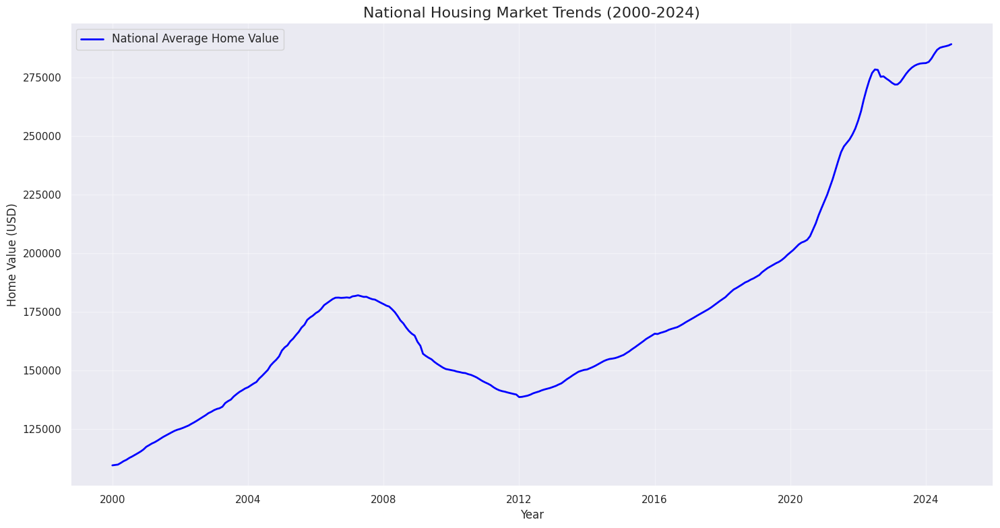

In [245]:
# Convert time-series columns to a numeric format for analysis
time_series_columns = real_estate_data.columns[5:]
real_estate_data[time_series_columns] = real_estate_data[time_series_columns].astype(float)

# Calculate the mean home value across all regions for each time point (National Trend)
national_trend = real_estate_data[time_series_columns].mean()

# Extract years from the column names for labeling
time_points = pd.to_datetime(time_series_columns).to_period("M")

# Plotting National Home Value Trends Over Time
plt.figure(figsize=(15, 8))
plt.plot(time_points.to_timestamp(), national_trend, color='blue', linewidth=2, label='National Average Home Value')
plt.title("National Housing Market Trends (2000-2024)", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Home Value (USD)", fontsize=12)
plt.grid(alpha=0.4)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

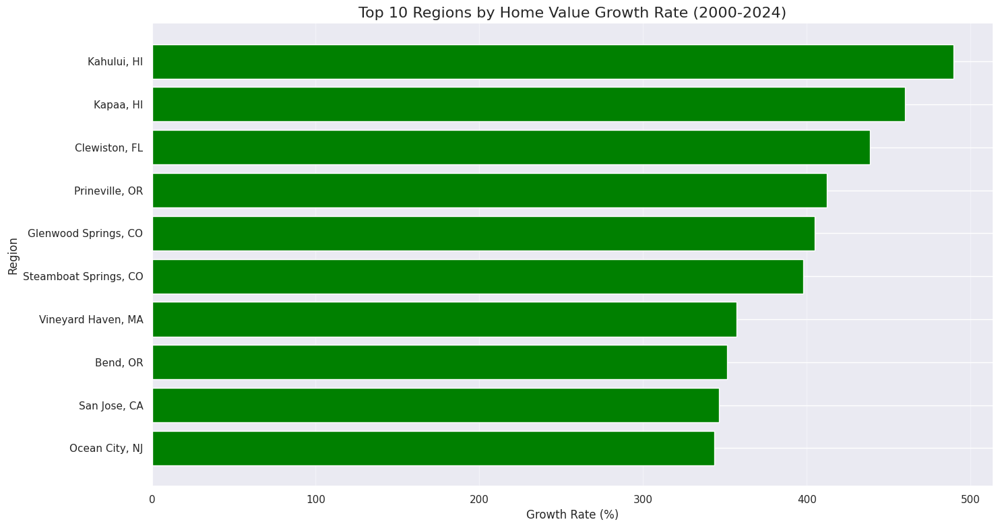

,RegionName,StateName,Growth_Rate
259,"Kahului, HI",HI,489.406257
465,"Kapaa, HI",HI,459.912014
685,"Clewiston, FL",FL,438.674145
837,"Prineville, OR",OR,412.026697
443,"Glenwood Springs, CO",CO,404.727546
832,"Steamboat Springs, CO",CO,397.804332
871,"Vineyard Haven, MA",MA,356.893734
225,"Bend, OR",OR,351.341487
35,"San Jose, CA",CA,346.316643
398,"Ocean City, NJ",NJ,343.647500


In [246]:
real_estate_data = real_estate_data.copy()

# Calculate growth rates by region: (latest value - earliest value) / earliest value
real_estate_data['Growth_Rate'] = (
    real_estate_data[time_series_columns[-1]] - real_estate_data[time_series_columns[0]]
) / real_estate_data[time_series_columns[0]] * 100

# Top 10 regions with the highest growth rates
top_regions = real_estate_data.nlargest(10, 'Growth_Rate')

# Plot growth rates for top regions in descending order
plt.figure(figsize=(15, 8))
colors = plt.cm.viridis_r(range(len(top_regions)))  # Colormap for diverse colors
plt.barh(top_regions['RegionName'], top_regions['Growth_Rate'], color='green')
plt.gca().invert_yaxis()  # Reverse the order for descending display
plt.title("Top 10 Regions by Home Value Growth Rate (2000-2024)", fontsize=16)
plt.xlabel("Growth Rate (%)", fontsize=12)
plt.ylabel("Region", fontsize=12)
plt.grid(axis='x', alpha=0.4)
plt.tight_layout()
plt.show()

# Displaying top regions for context
top_regions[['RegionName', 'StateName', 'Growth_Rate']]

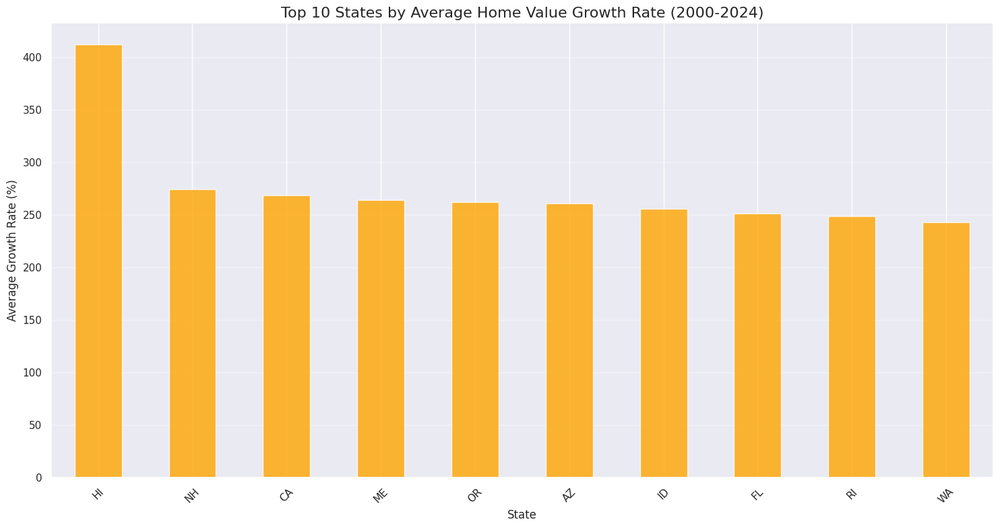

,Growth_Rate
StateName,
HI,412.104142
NH,274.399088
CA,268.786064
ME,264.279447
OR,262.058355
AZ,261.283041
ID,256.169561
FL,251.299506
RI,248.684576


In [247]:
# Aggregate data at the state level to calculate average growth rates per state
state_growth = real_estate_data.groupby('StateName')['Growth_Rate'].mean().sort_values(ascending=False)

# Plot the top 10 states with the highest average growth rates
plt.figure(figsize=(15, 8))
state_growth.head(10).plot(kind='bar', color='orange', alpha=0.8)
plt.title("Top 10 States by Average Home Value Growth Rate (2000-2024)", fontsize=16)
plt.xlabel("State", fontsize=12)
plt.ylabel("Average Growth Rate (%)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Displaying state-level growth rates for context
state_growth.head(10)

### 2- Sales Prices and Inventory Trends
Investigate whether overall sale prices and inventory levels are increasing or decreasing nationwide, providing insight into market stability and buyer/seller dynamics.

In [248]:
# Load the data from the CSV files
prices_df = pd.read_csv('Metro_median_sale_price_uc_sfr_sm_month.csv')
inventory_df = pd.read_csv('Metro_invt_fs_uc_sfr_sm_month.csv')

# Display the first few rows of each dataframe to understand their structure
prices_df.head(), inventory_df.head()

(   RegionID  SizeRank       RegionName RegionType StateName  2008-04-30  \
 0    102001         0    United States    country       NaN    171393.0   
 1    394913         1     New York, NY        msa        NY    396667.0   
 2    753899         2  Los Angeles, CA        msa        CA    490500.0   
 3    394463         3      Chicago, IL        msa        IL    220333.0   
 4    394514         4       Dallas, TX        msa        TX    143280.0   
 
    2008-05-31  2008-06-30  2008-07-31  2008-08-31  ...  2023-12-31  \
 0    174726.0    177833.0    179667.0    179000.0  ...    328333.0   
 1    396667.0    400000.0    408333.0    414000.0  ...    600000.0   
 2    480500.0    470833.0    454000.0    438667.0  ...    907667.0   
 3    225333.0    231300.0    234967.0    236633.0  ...    288333.0   
 4    147230.0    150500.0    153602.0    153602.0  ...    374667.0   
 
    2024-01-31  2024-02-29  2024-03-31  2024-04-30  2024-05-31  2024-06-30  \
 0    326000.0    328667.0    336667

In [249]:
# Convert date columns to datetime format
prices_df.columns = pd.to_datetime(prices_df.columns[5:], errors='coerce').insert(0, 'RegionID').insert(1, 'SizeRank').insert(2, 'RegionName').insert(3, 'RegionType').insert(4, 'StateName')
inventory_df.columns = pd.to_datetime(inventory_df.columns[5:], errors='coerce').insert(0, 'RegionID').insert(1, 'SizeRank').insert(2, 'RegionName').insert(3, 'RegionType').insert(4, 'StateName')

# Handle missing values
prices_df.ffill(inplace=True)
inventory_df.ffill(inplace=True)

#### Overall Trends in Sale Prices

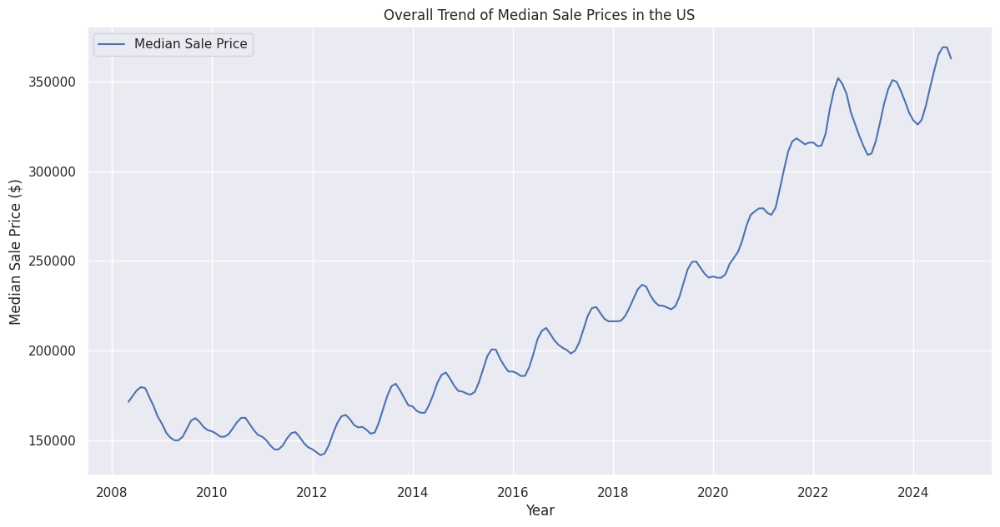

In [250]:
# Plot the overall trend of median sale prices in the US
plt.figure(figsize=(14, 7))
plt.plot(prices_df.columns[5:], prices_df.iloc[0, 5:], label='Median Sale Price')
plt.title('Overall Trend of Median Sale Prices in the US')
plt.xlabel('Year')
plt.ylabel('Median Sale Price ($)')
plt.legend()
plt.grid(True)
plt.show()

#### Overall Trends in Inventory Listings

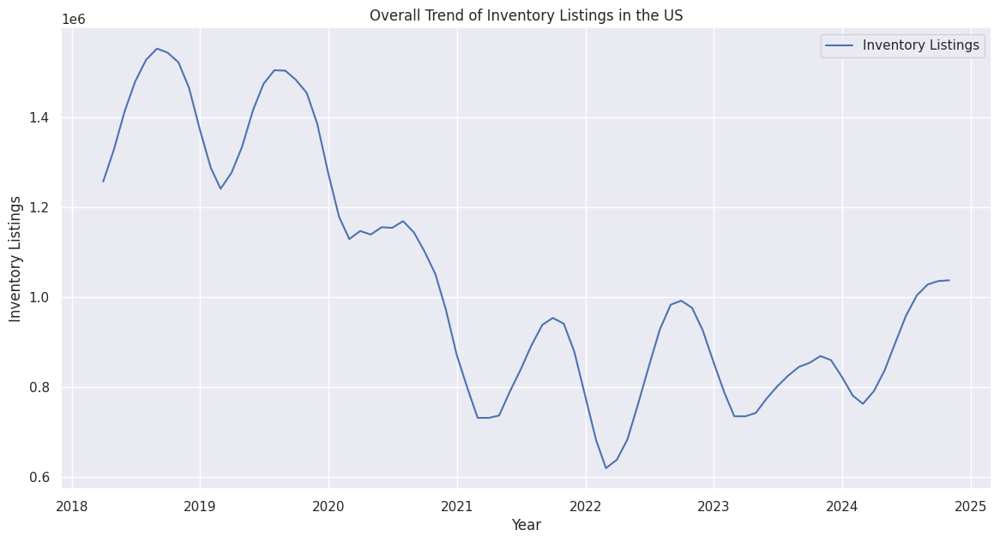

In [251]:
# Plot the overall trend of inventory listings in the US
plt.figure(figsize=(14, 7))
plt.plot(inventory_df.columns[5:], inventory_df.iloc[0, 5:], label='Inventory Listings')
plt.title('Overall Trend of Inventory Listings in the US')
plt.xlabel('Year')
plt.ylabel('Inventory Listings')
plt.legend()
plt.grid(True)
plt.show()

#### Comparison of Sale Prices and Inventory Listings

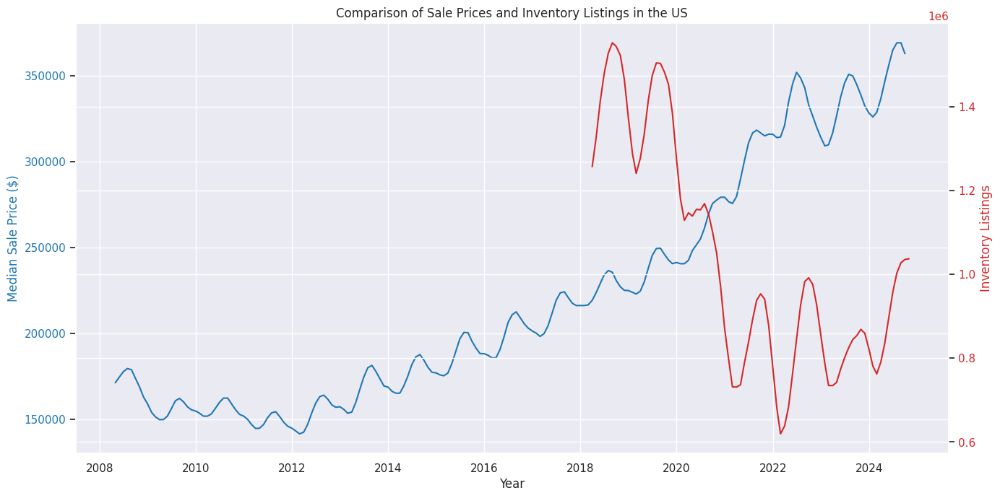

In [252]:
# Create a combined plot to compare the trends in sale prices and inventory listings
fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:blue'
ax1.set_xlabel('Year')
ax1.set_ylabel('Median Sale Price ($)', color=color)
ax1.plot(prices_df.columns[5:], prices_df.iloc[0, 5:], color=color, label='Median Sale Price')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Inventory Listings', color=color)
ax2.plot(inventory_df.columns[5:], inventory_df.iloc[0, 5:], color=color, label='Inventory Listings')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Comparison of Sale Prices and Inventory Listings in the US')
plt.grid(True)
plt.show()

##### The US housing market is experiencing rising sale prices and declining inventory listings. This combination suggests a competitive market with high demand and limited supply, which typically drives prices up

### 3- Investment recommendation
Should I wait to invest or should I invest now and if so then where should I invest?

In [253]:
heatDF = pd.read_csv("Metro_market_temp_index_uc_sfrcondo_month.csv")

heatDF.head(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,49.0,50.0,52.0,54.0,55.0,...,59.0,63.0,63.0,62.0,59.0,57.0,55.0,53.0,52.0,50.0
1,394913,1,"New York, NY",msa,NY,52.0,52.0,55.0,56.0,55.0,...,85.0,91.0,89.0,86.0,81.0,77.0,76.0,76.0,73.0,69.0
2,753899,2,"Los Angeles, CA",msa,CA,68.0,66.0,65.0,66.0,66.0,...,81.0,84.0,83.0,80.0,74.0,70.0,67.0,65.0,62.0,61.0
3,394463,3,"Chicago, IL",msa,IL,48.0,49.0,51.0,52.0,51.0,...,68.0,74.0,76.0,75.0,71.0,67.0,64.0,61.0,58.0,56.0
4,394514,4,"Dallas, TX",msa,TX,55.0,55.0,58.0,60.0,59.0,...,66.0,67.0,67.0,65.0,59.0,55.0,51.0,49.0,48.0,48.0


In [254]:
houseGrowthForecastDF = pd.read_csv("Metro_zhvf_growth_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")


In [255]:
houseGrowthForecastDF.dtypes

,0
RegionID,int64
SizeRank,int64
RegionName,object
RegionType,object
StateName,object
BaseDate,object
2024-11-30,float64
2025-01-31,float64
2025-10-31,float64


In [256]:
print("number of duplicate rows: ", heatDF[heatDF.duplicated()].shape)
print("number of duplicate rows: ", houseGrowthForecastDF[houseGrowthForecastDF.duplicated()].shape)

number of duplicate rows:  (0, 87)
number of duplicate rows:  (0, 9)


In [257]:
print( heatDF.isnull().sum())
print( houseGrowthForecastDF.isnull().sum())

RegionID      0
SizeRank      0
RegionName    0
RegionType    0
StateName     1
             ..
2024-06-30    0
2024-07-31    0
2024-08-31    4
2024-09-30    5
2024-10-31    5
Length: 87, dtype: int64
RegionID      0
SizeRank      0
RegionName    0
RegionType    0
StateName     1
BaseDate      0
2024-11-30    0
2025-01-31    0
2025-10-31    0
dtype: int64


In [258]:
heatDF = heatDF.drop(['RegionType'], axis=1)
houseGrowthForecastDF = houseGrowthForecastDF.drop(['RegionType'], axis=1)

In [259]:
#SQL table formatting conversion

heatSQLDF = heatDF.melt( id_vars=['RegionID', 'SizeRank', 'RegionName', 'StateName'], var_name='Date',value_name= 'Temp')
houseGrowthForecastSQLDF = houseGrowthForecastDF.melt( id_vars=['RegionID', 'SizeRank', 'RegionName', 'StateName', 'BaseDate'], var_name='Date',value_name= 'Growth')

In [260]:
homeValues = pd.read_csv("Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")
homeValues= homeValues.drop_duplicates()
homeValues= homeValues.dropna()
homeValues= homeValues.drop(['RegionType'], axis=1)
homeValuesSQLDF = homeValues.melt( id_vars=['RegionID', 'SizeRank', 'RegionName', 'StateName'], var_name='Date',value_name= 'Value')

In [261]:
try:
    sqliteConnection = sqlite3.connect('SQLite_Houses.db')
    cursor = sqliteConnection.cursor()
    print("Database created and Successfully Connected to SQLite")

    sqlite_select_Query = "select sqlite_version();"
    cursor.execute(sqlite_select_Query)
    record = cursor.fetchall()
    print("SQLite Database Version is: ", record)
    cursor.close()

except sqlite3.Error as error:
    print("Error while connecting to sqlite", error)

Database created and Successfully Connected to SQLite
SQLite Database Version is:  [('3.37.2',)]


__This is setup to see if any regions have an average home value above $10,000,000 to avoid regions that are too unaffordable to invest in.__

In [262]:
homeValues['Q1'] = np.nan
homeValues['Q3'] = np.nan
homeValues['IQR'] = np.nan

for i, r in homeValues.iterrows():
   if r['RegionID'] != '102001':
        fDF = homeValuesSQLDF[homeValuesSQLDF['RegionName'] == r['RegionName']]
        homeValues.at[i, 'Q1'] = fDF['Value'].quantile(.25)
        homeValues.at[i, 'Q3'] = fDF['Value'].quantile(.75)
        homeValues.at[i, 'IQR'] = fDF['Value'].quantile(.75) - fDF['Value'].quantile(.25)

In [263]:
homeValues= homeValues.sort_values(by=['Q3'], ascending=False)
homeValues

,RegionID,SizeRank,RegionName,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,2000-06-30,...,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,Q1,Q3,IQR
12,395057,12,"San Francisco, CA",CA,287637.725027,288762.905790,290477.782034,295130.015599,301541.621695,308196.787219,...,1.125522e+06,1.137856e+06,1.143858e+06,1.145914e+06,1.144496e+06,1.142771e+06,1.139954e+06,461851.259753,911792.241392,449940.981639
871,753925,910,"Vineyard Haven, MA",MA,328404.648611,329787.099204,331066.303852,334489.424184,338653.266825,343742.470820,...,1.478223e+06,1.493054e+06,1.495553e+06,1.491804e+06,1.489332e+06,1.493566e+06,1.495751e+06,597341.168243,823283.142676,225941.974433
179,395065,183,"Santa Cruz, CA",CA,298419.651784,299456.198587,301284.538525,305355.812414,310412.501388,315998.300238,...,1.139989e+06,1.144942e+06,1.145538e+06,1.144896e+06,1.145389e+06,1.145742e+06,1.143228e+06,482983.256933,815994.871285,333011.614352
303,394900,312,"Napa, CA",CA,246147.445345,246935.984949,248428.254541,251584.525481,255548.223343,259758.210156,...,8.956302e+05,9.018584e+05,9.037751e+05,9.036807e+05,9.030002e+05,9.011909e+05,8.977066e+05,403524.569383,678763.757659,275239.188276
54,753924,55,"Urban Honolulu, HI",HI,224983.630115,225152.400959,225573.371980,226332.974735,227432.009620,228655.210719,...,8.602366e+05,8.633459e+05,8.624425e+05,8.598711e+05,8.585652e+05,8.600912e+05,8.620080e+05,456908.931723,667058.196911,210149.265187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,394980,421,"Pine Bluff, AR",AR,47134.851439,47177.049800,47257.567449,47470.859207,47722.657062,47943.736745,...,9.895157e+04,1.000912e+05,1.008297e+05,1.009009e+05,1.005892e+05,9.963544e+04,9.866482e+04,62069.639985,73416.702466,11347.062482
879,394594,923,"Fitzgerald, GA",GA,55167.690116,54934.002263,54844.556950,54589.406725,54514.389098,54487.673273,...,1.119449e+05,1.129374e+05,1.134578e+05,1.138309e+05,1.141526e+05,1.141991e+05,1.140749e+05,61001.165332,71978.540677,10977.375345
479,395027,494,"Roanoke Rapids, NC",NC,52016.448756,52091.449908,51925.983494,51803.427686,51616.135404,51754.008663,...,9.643305e+04,9.801890e+04,9.939947e+04,1.001279e+05,1.000288e+05,9.893950e+04,9.803700e+04,59776.002928,69932.524998,10156.522070
839,394601,876,"Forrest City, AR",AR,49189.207458,49238.824190,49299.073272,49463.174096,49704.136156,49793.905274,...,7.447944e+04,7.553424e+04,7.620857e+04,7.591986e+04,7.548318e+04,7.478139e+04,7.429828e+04,59297.532984,67520.582888,8223.049905


In [264]:
heatSQLDF.shape

(76096, 6)

In [265]:
heatSQLDF.to_sql('HeatIndex', sqliteConnection, if_exists='replace')
houseGrowthForecastSQLDF.to_sql('HouseGrowthForcast', sqliteConnection, if_exists='replace')
homeValuesSQLDF.to_sql('HomeValues', sqliteConnection, if_exists='replace')

89400

In [266]:
heatSQLDF['Date'] = pd.to_datetime(heatSQLDF['Date'], infer_datetime_format=True)

cursor = sqliteConnection.cursor()

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapDF = heatMapSQLDF.pivot_table(index='RegionName', columns='Date', values='Temp')

<ipython-input-266-a6a6b89b87d1>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  heatSQLDF['Date'] = pd.to_datetime(heatSQLDF['Date'], infer_datetime_format=True)


This Sections shows the heat index by state. The lower values are markets favoring buyers and higher numbers are markets favored by sellers. Ideal markets to start investuing in are buyers
markets that will later swing into sellers markets.

<Axes: xlabel='Date', ylabel='RegionName'>

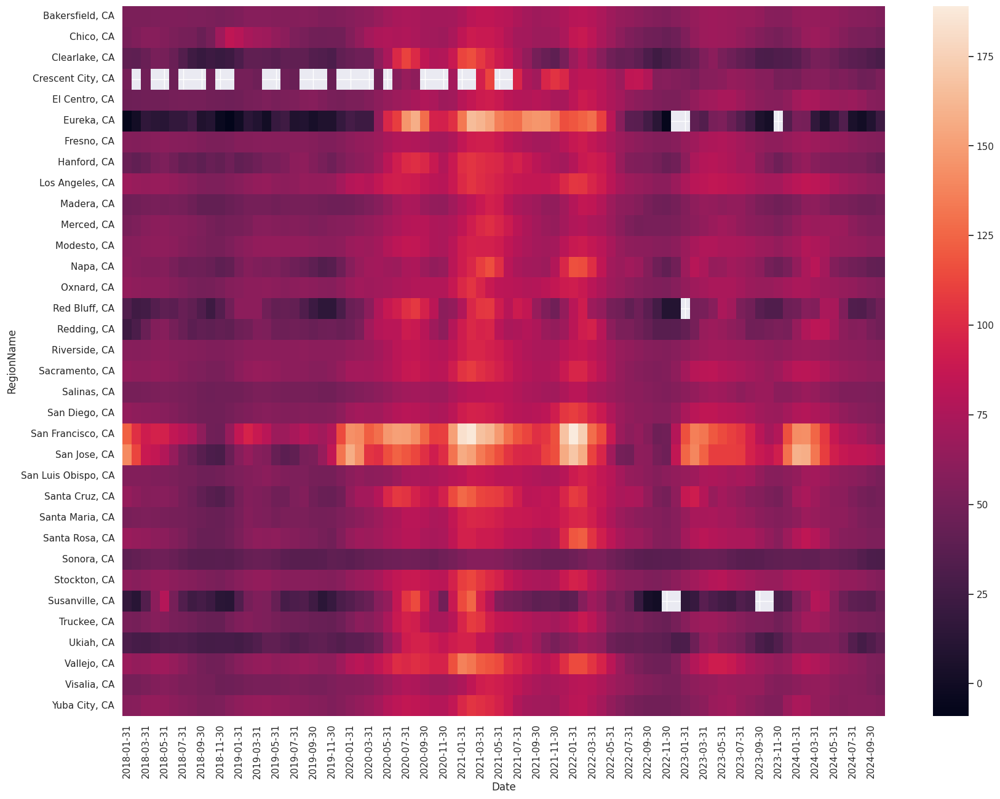

In [267]:
cursor = sqliteConnection.cursor()

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'CA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLCADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapCADF = heatMapSQLCADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapCADF)

In [268]:
heatMapSQLDF['StateName'].unique()

array(['NY', 'CA', 'IL', 'TX', 'VA', 'PA', 'FL', 'GA', 'MA', 'AZ', 'MI',
       'WA', 'MN', 'CO', 'MD', 'MO', 'NC', 'OR', 'OH', 'NV', 'IN', 'TN',
       'RI', 'WI', 'OK', 'KY', 'LA', 'UT', 'CT', 'AL', 'HI', 'NE', 'SC',
       'NM', 'ID', 'AR', 'IA', 'KS', 'MS', 'ME', 'NH', 'DE', 'AK', 'NJ',
       'SD', 'WV', 'ND', 'VT', 'MT', 'WY'], dtype=object)

<Axes: xlabel='Date', ylabel='RegionName'>

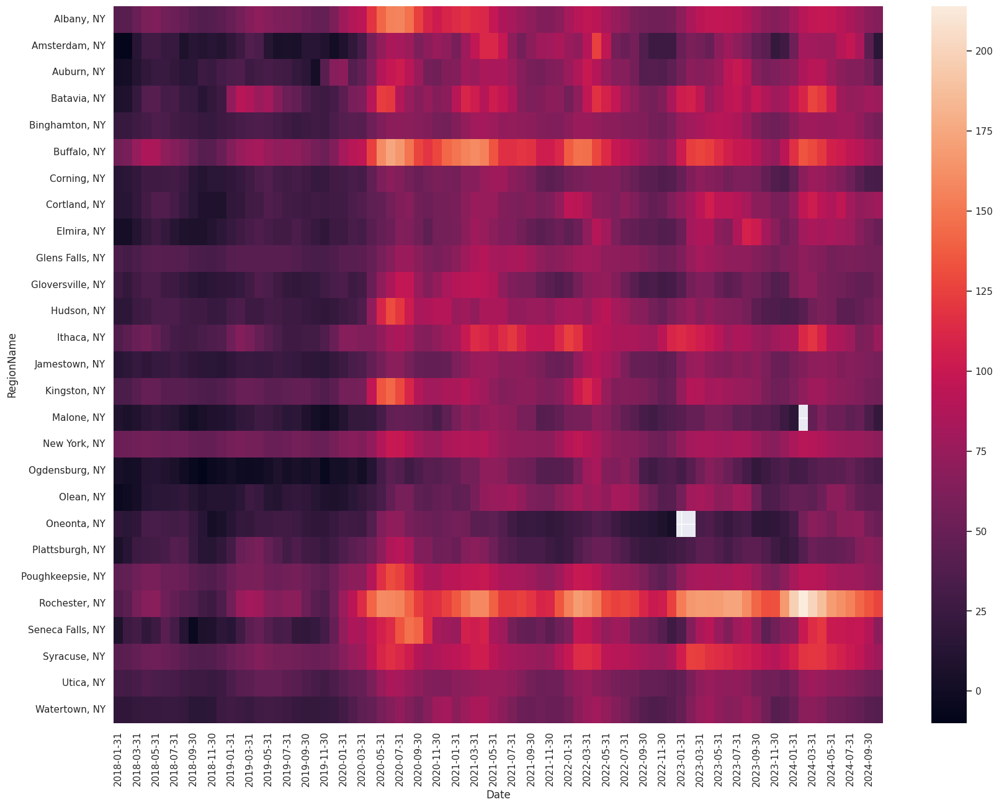

In [269]:
cursor = sqliteConnection.cursor()

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NY'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNYDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNYDF = heatMapSQLNYDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNYDF)

<Axes: xlabel='Date', ylabel='RegionName'>

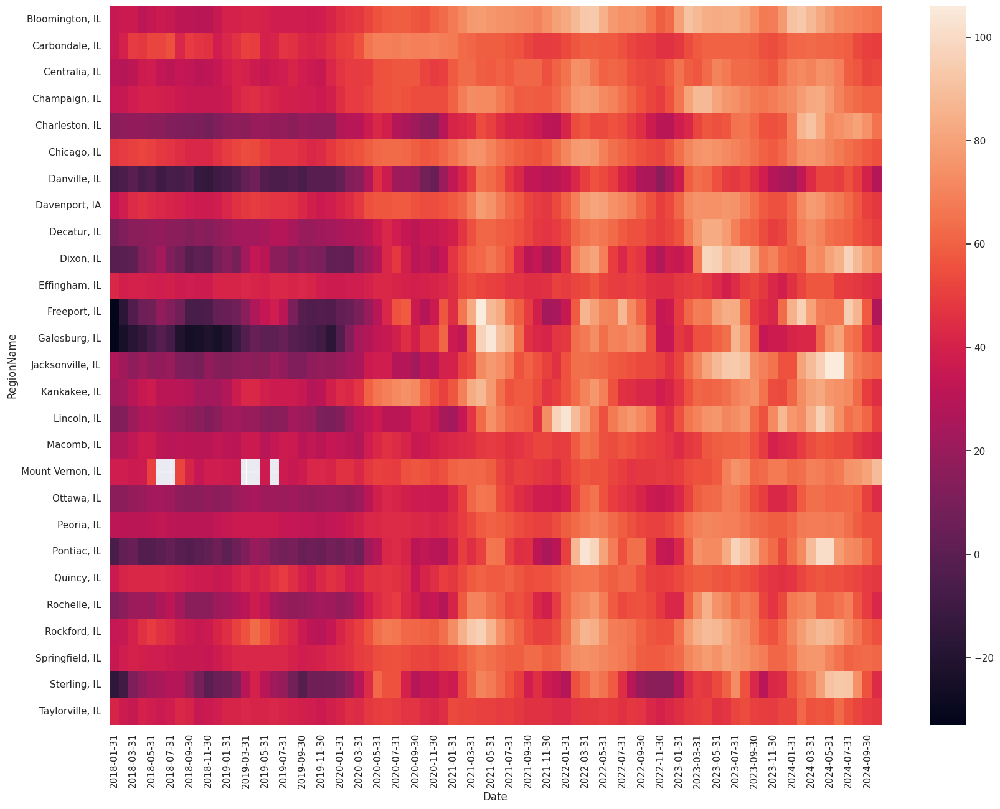

In [270]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'IL'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLILDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapILDF = heatMapSQLILDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapILDF)

<Axes: xlabel='Date', ylabel='RegionName'>

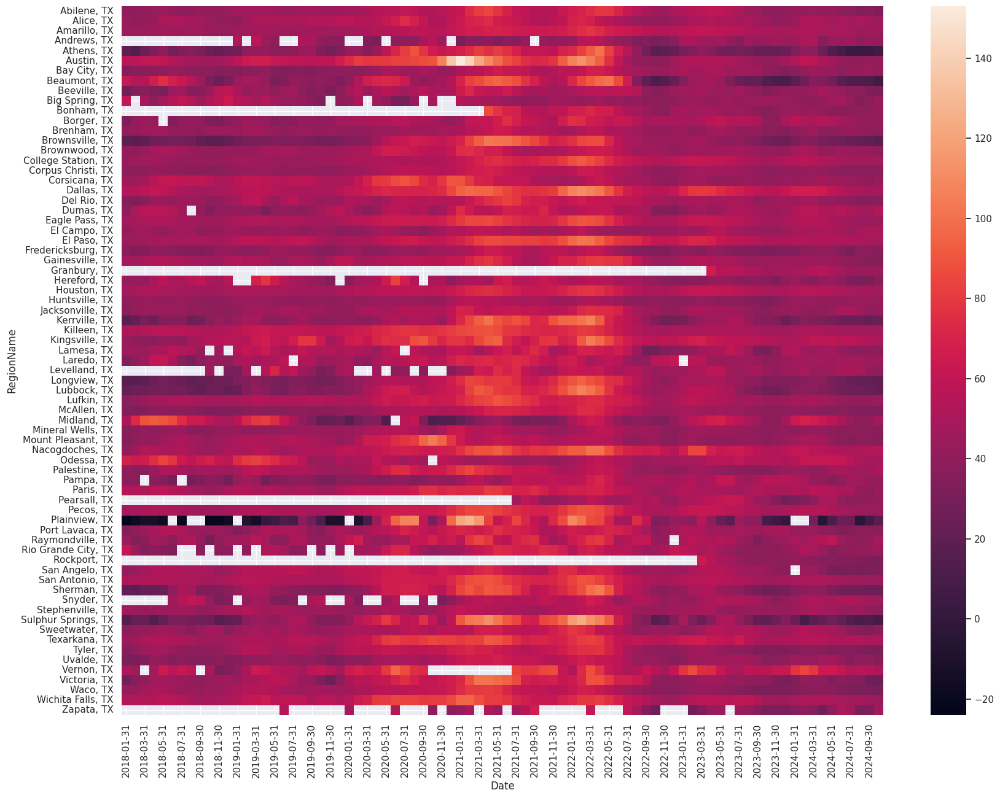

In [271]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'TX'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLTXDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapTXDF = heatMapSQLTXDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapTXDF)

<Axes: xlabel='Date', ylabel='RegionName'>

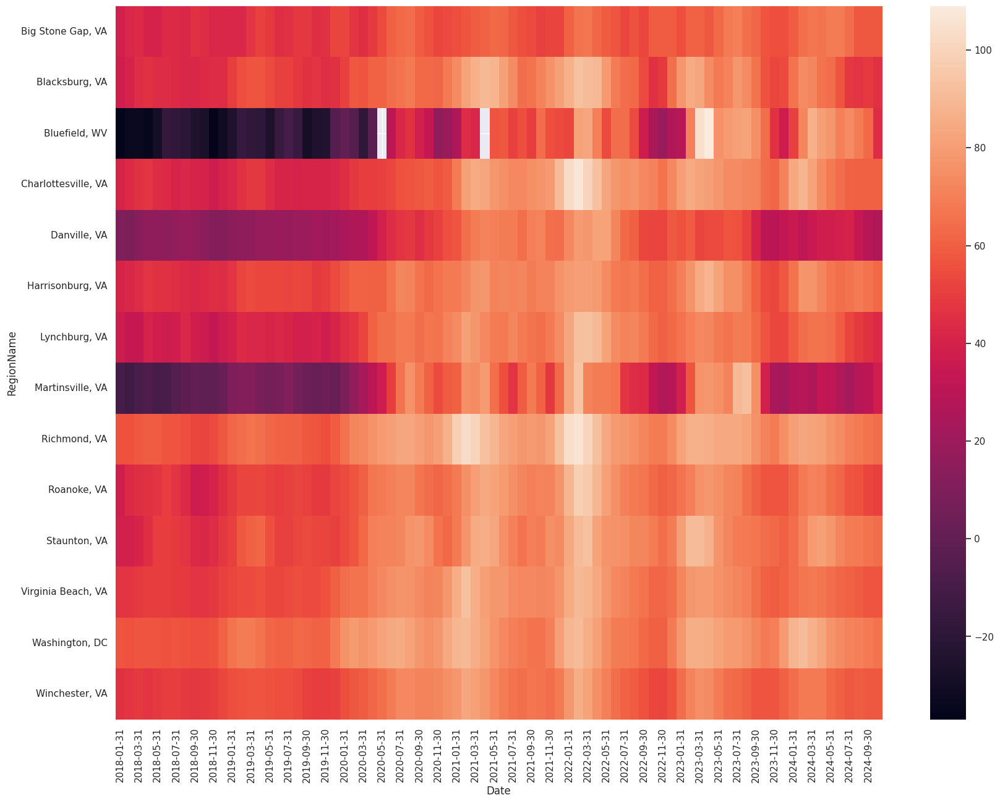

In [272]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'VA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLVADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapVADF = heatMapSQLVADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapVADF)

<Axes: xlabel='Date', ylabel='RegionName'>

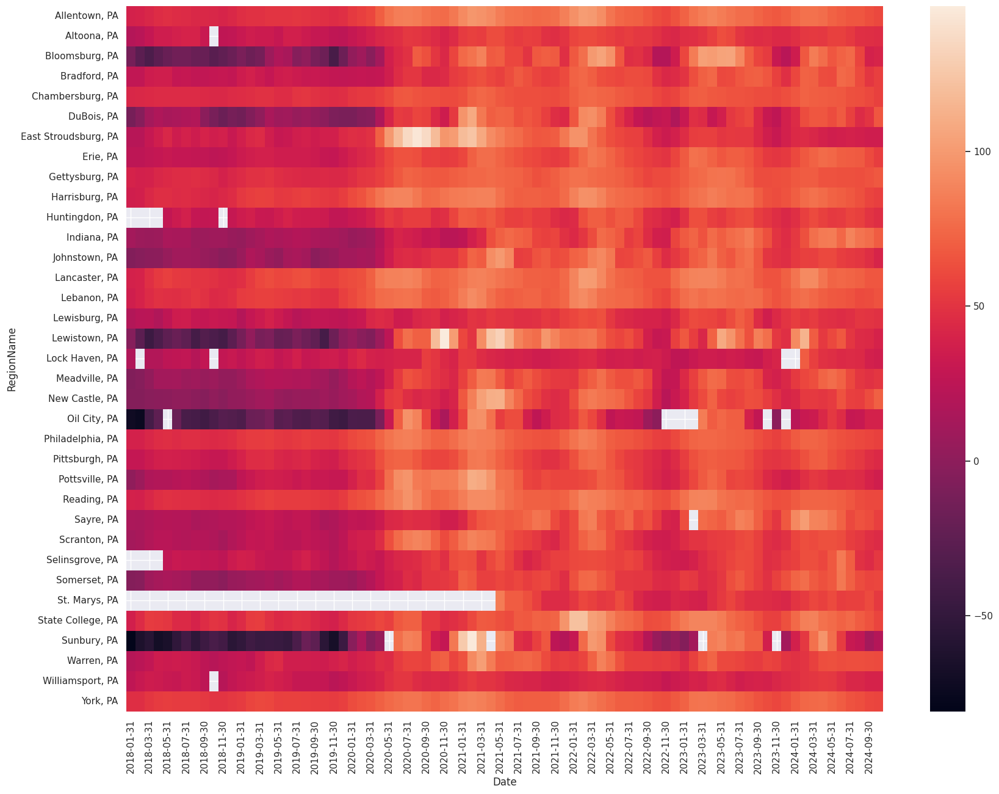

In [273]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'PA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLPADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapPADF = heatMapSQLPADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapPADF)

<Axes: xlabel='Date', ylabel='RegionName'>

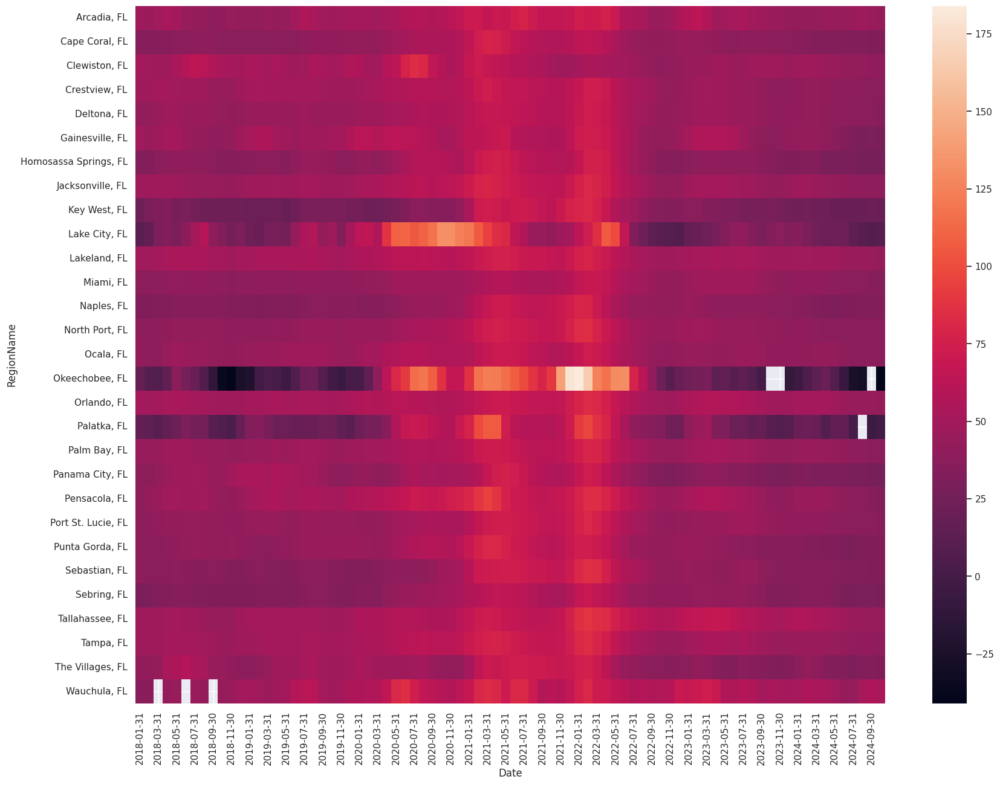

In [274]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'FL'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLFLDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapFLDF = heatMapSQLFLDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapFLDF)

<Axes: xlabel='Date', ylabel='RegionName'>

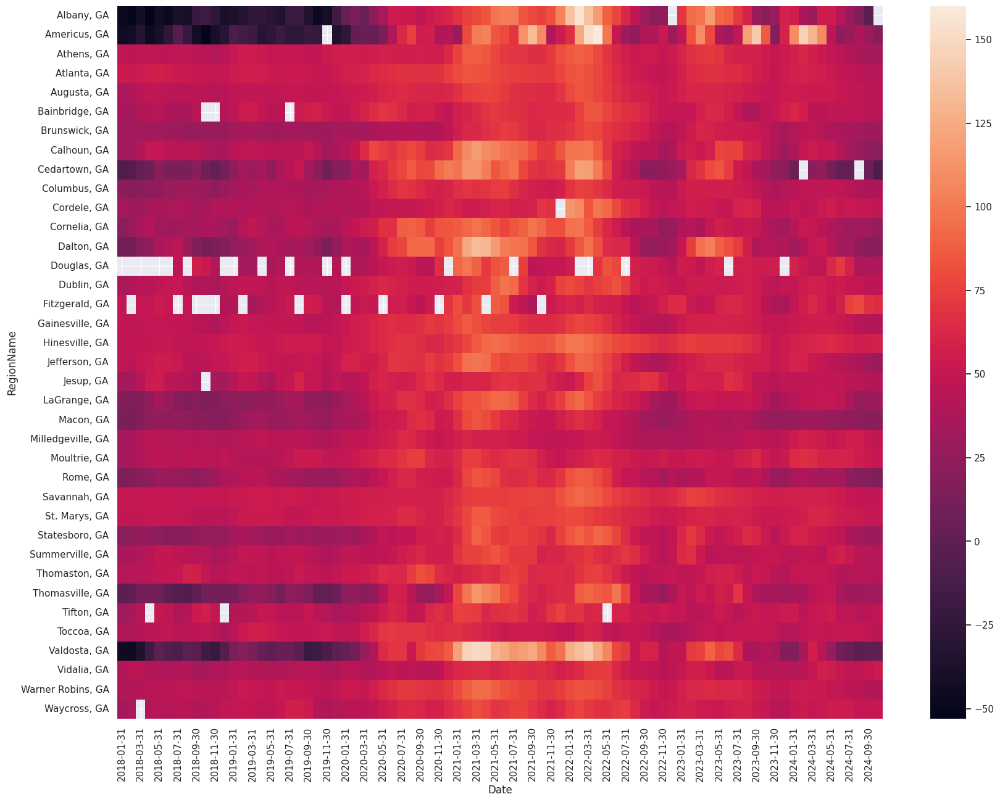

In [275]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'GA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLGADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapGADF = heatMapSQLGADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapGADF)

<Axes: xlabel='Date', ylabel='RegionName'>

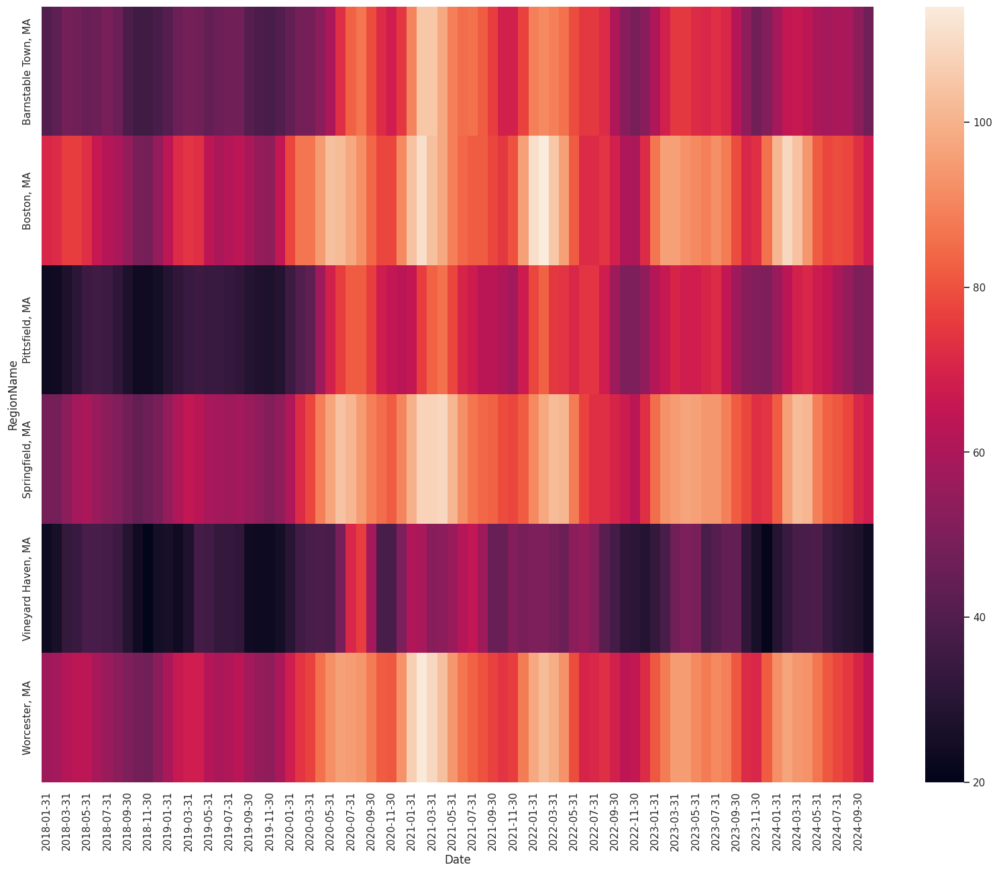

In [276]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMADF = heatMapSQLMADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMADF)

<Axes: xlabel='Date', ylabel='RegionName'>

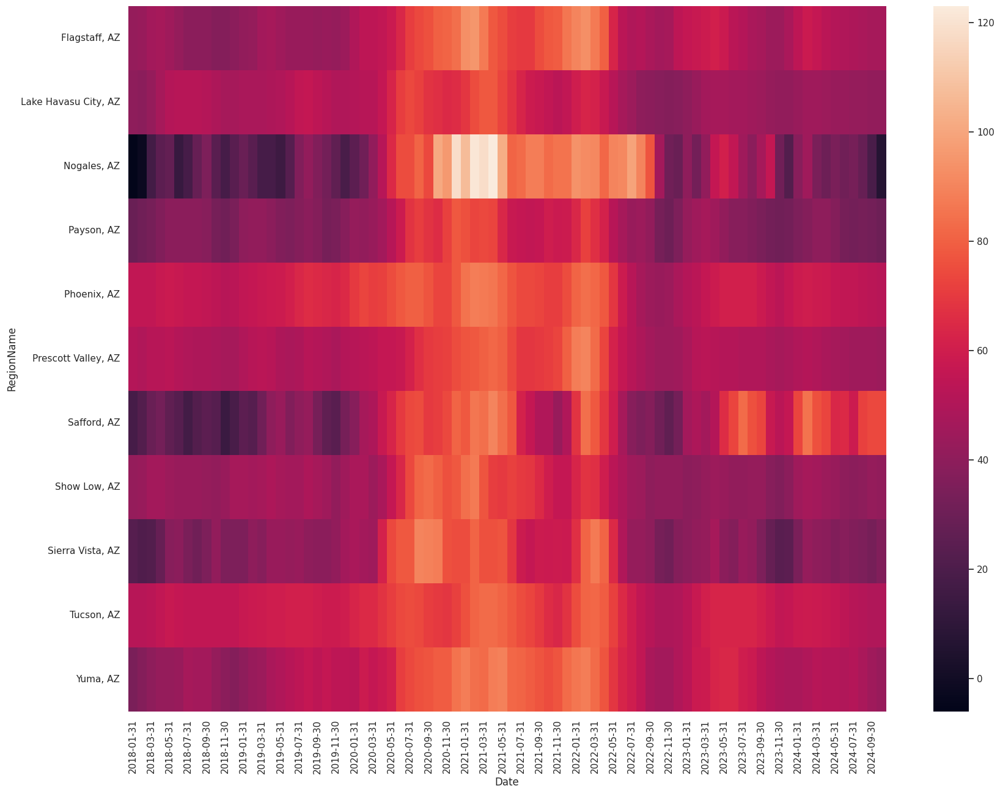

In [277]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'AZ'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLAZDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapAZDF = heatMapSQLAZDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapAZDF)

<Axes: xlabel='Date', ylabel='RegionName'>

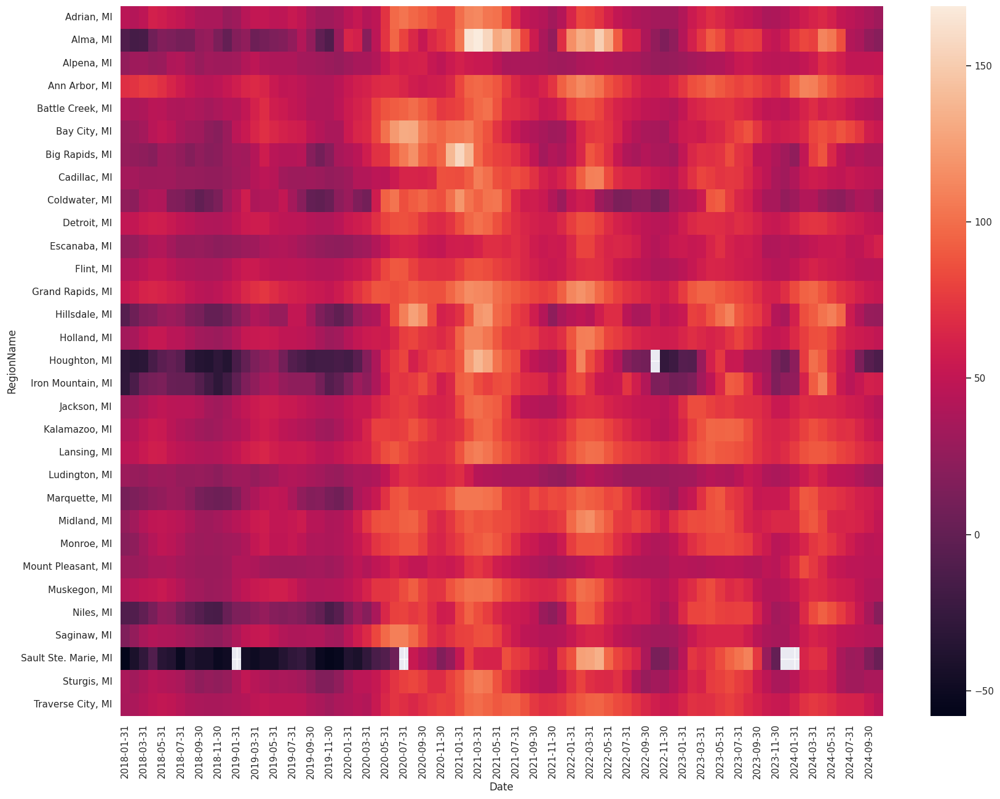

In [278]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MI'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMIDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMIDF = heatMapSQLMIDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMIDF)

<Axes: xlabel='Date', ylabel='RegionName'>

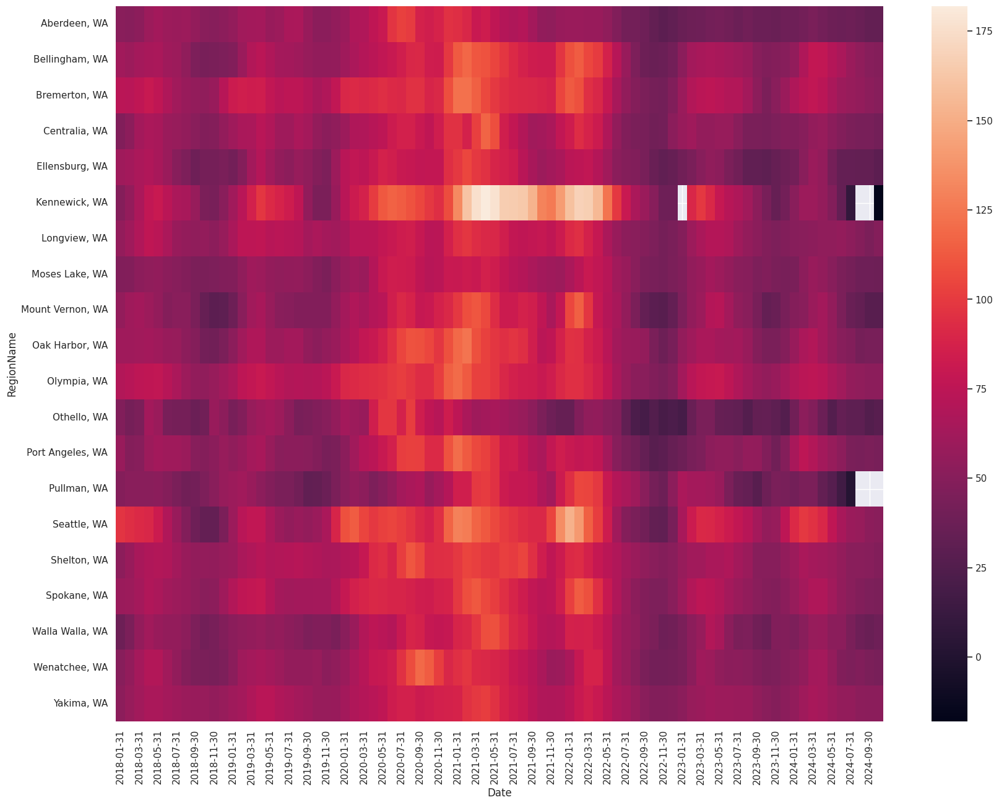

In [279]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'WA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLWADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapWADF = heatMapSQLWADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapWADF)

<Axes: xlabel='Date', ylabel='RegionName'>

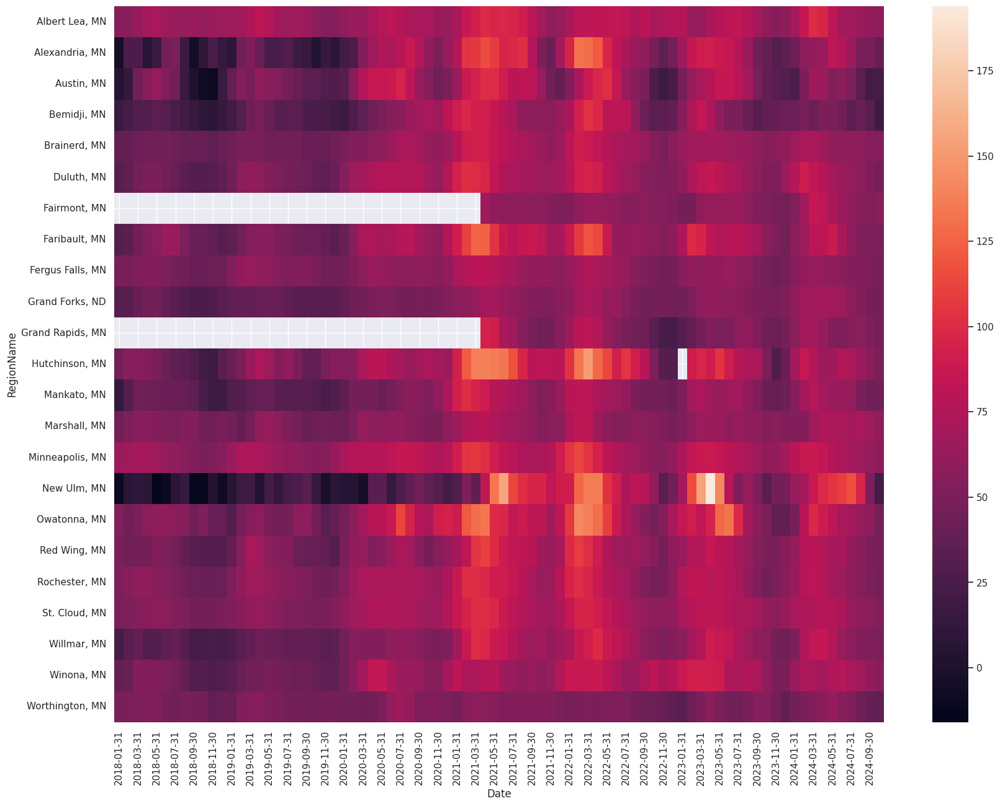

In [280]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MN'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMNDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMNDF = heatMapSQLMNDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMNDF)

<Axes: xlabel='Date', ylabel='RegionName'>

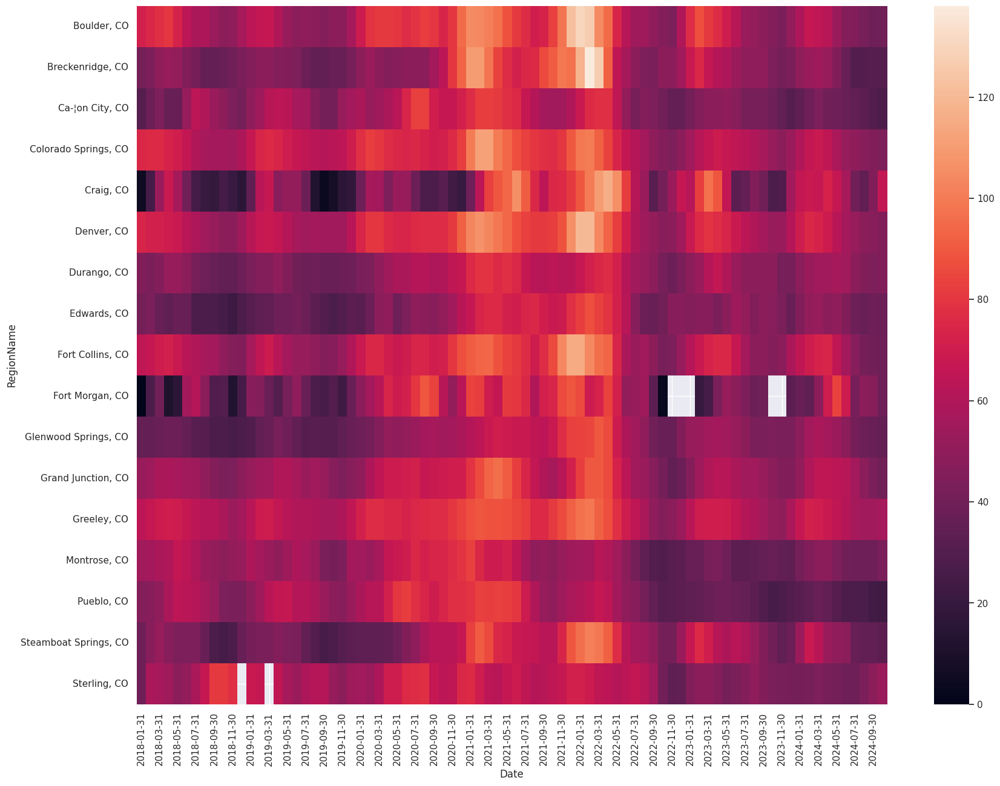

In [281]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'CO'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLCODF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapCODF = heatMapSQLCODF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapCODF)

<Axes: xlabel='Date', ylabel='RegionName'>

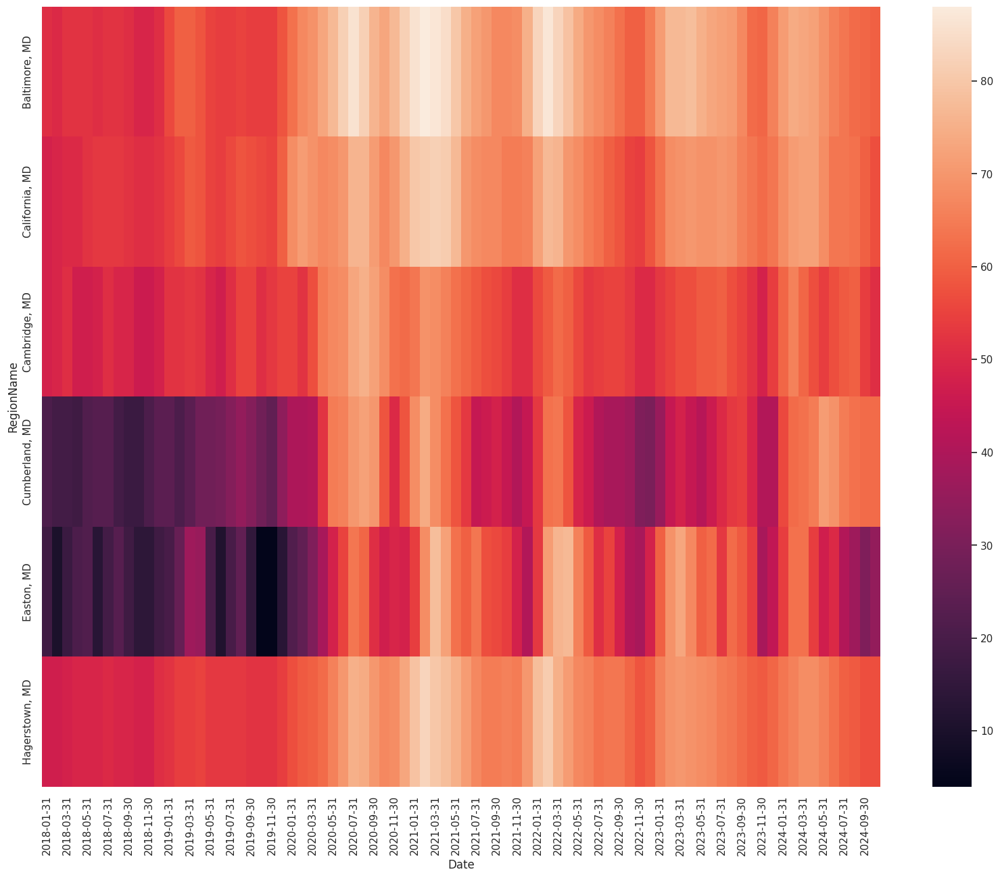

In [282]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MD'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMDDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMDDF = heatMapSQLMDDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMDDF)

<Axes: xlabel='Date', ylabel='RegionName'>

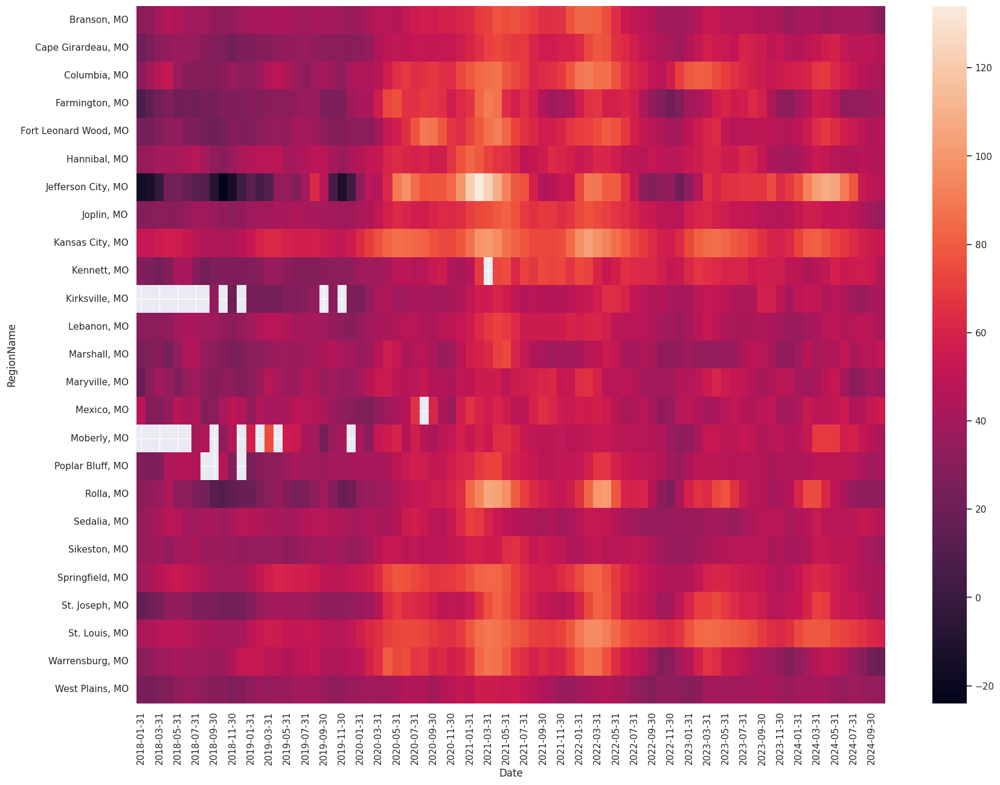

In [283]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MO'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMODF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMODF = heatMapSQLMODF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMODF)

<Axes: xlabel='Date', ylabel='RegionName'>

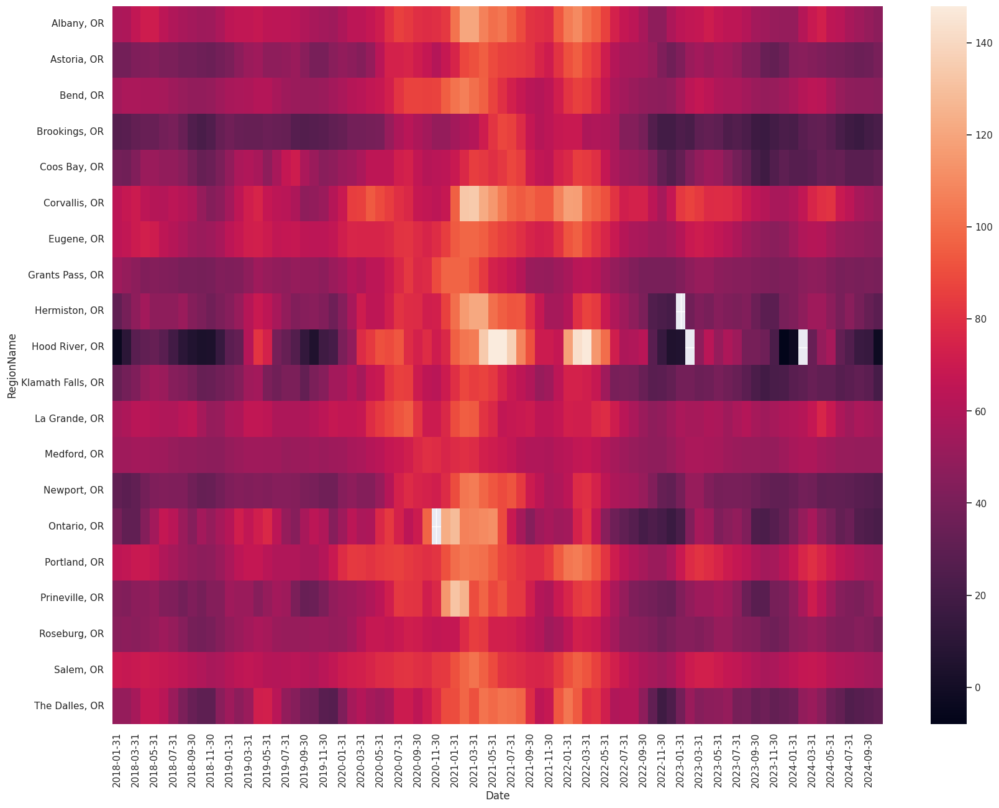

In [284]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'OR'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLORDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapORDF = heatMapSQLORDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapORDF)

<Axes: xlabel='Date', ylabel='RegionName'>

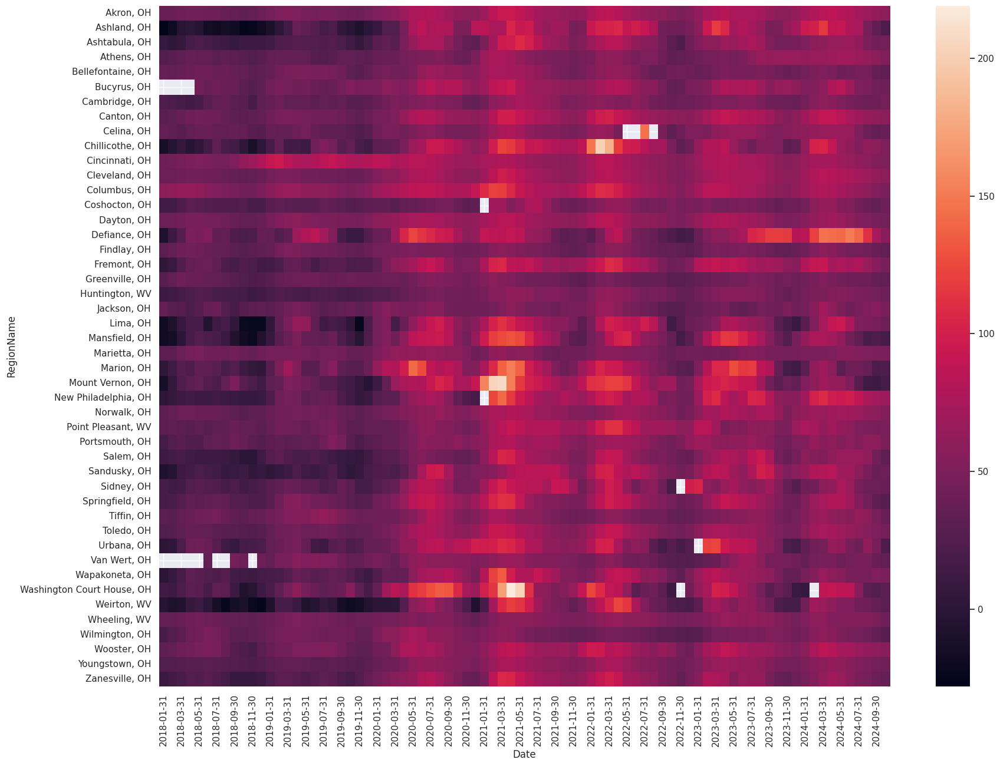

In [285]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'OH'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLOHDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapOHDF = heatMapSQLOHDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapOHDF)

<Axes: xlabel='Date', ylabel='RegionName'>

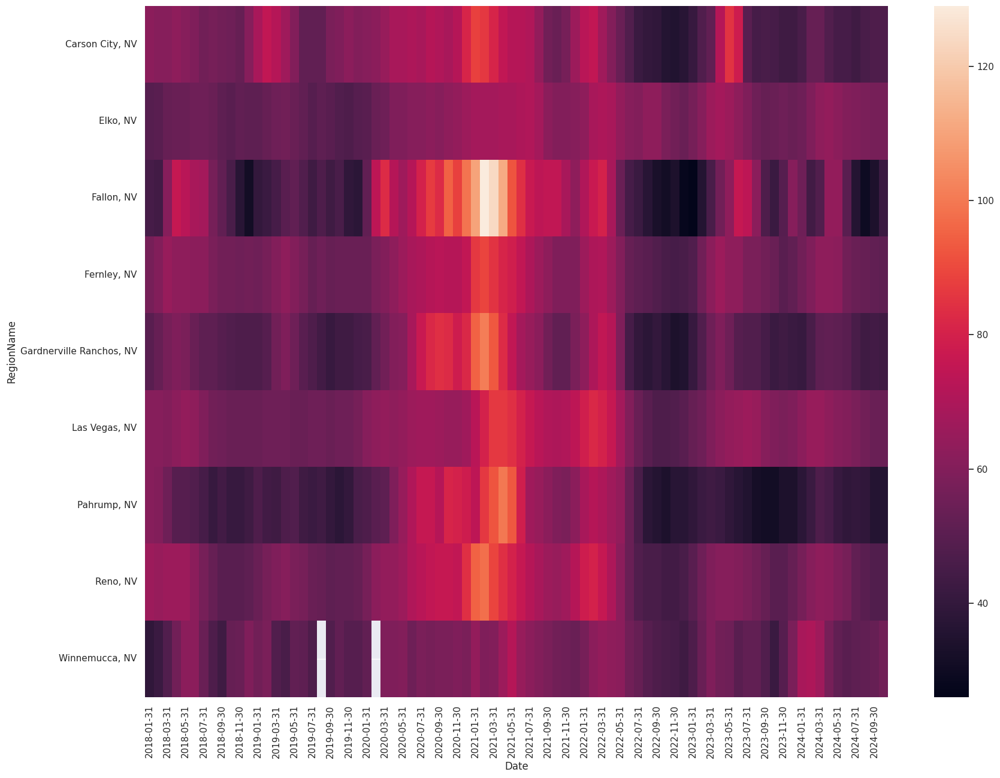

In [286]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NV'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNVDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNVDF = heatMapSQLNVDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNVDF)

<Axes: xlabel='Date', ylabel='RegionName'>

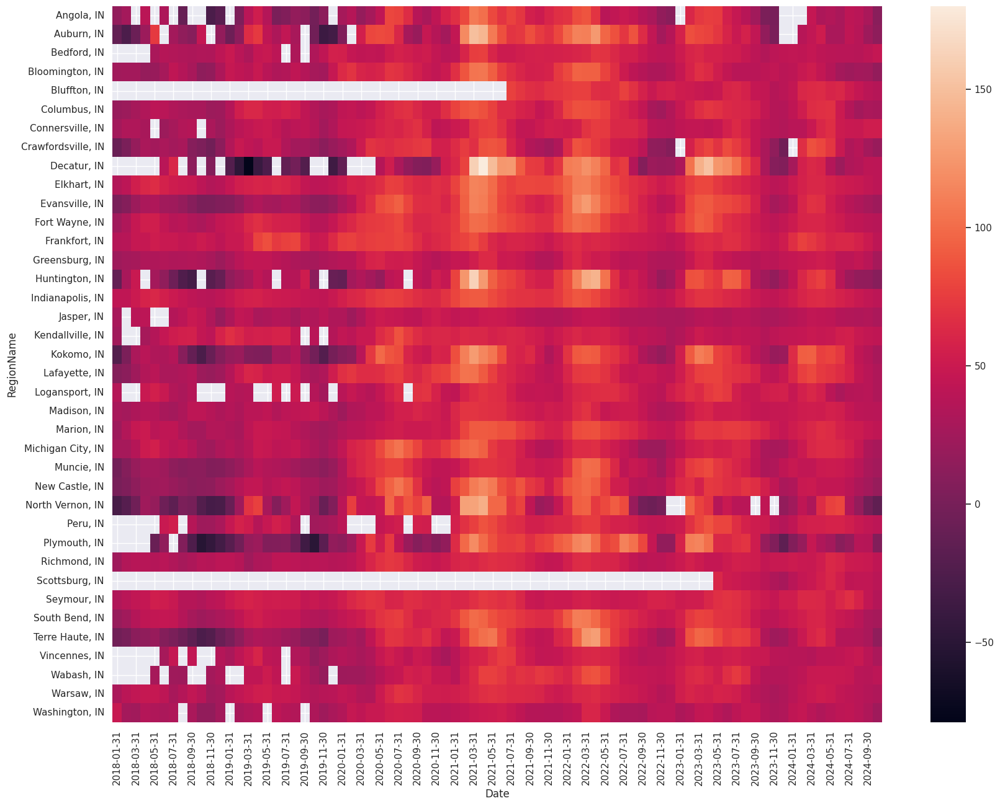

In [287]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'IN'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLINDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapINDF = heatMapSQLINDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapINDF)

<Axes: xlabel='Date', ylabel='RegionName'>

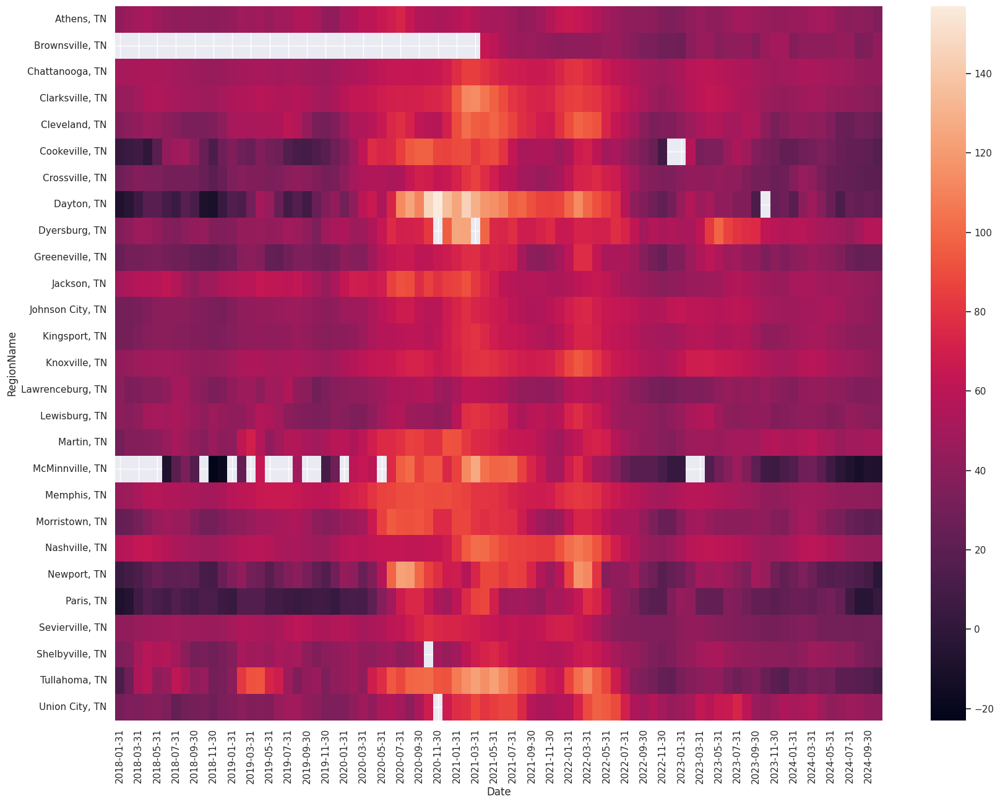

In [288]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'TN'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLTNDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapTNDF = heatMapSQLTNDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapTNDF)

<Axes: xlabel='Date', ylabel='RegionName'>

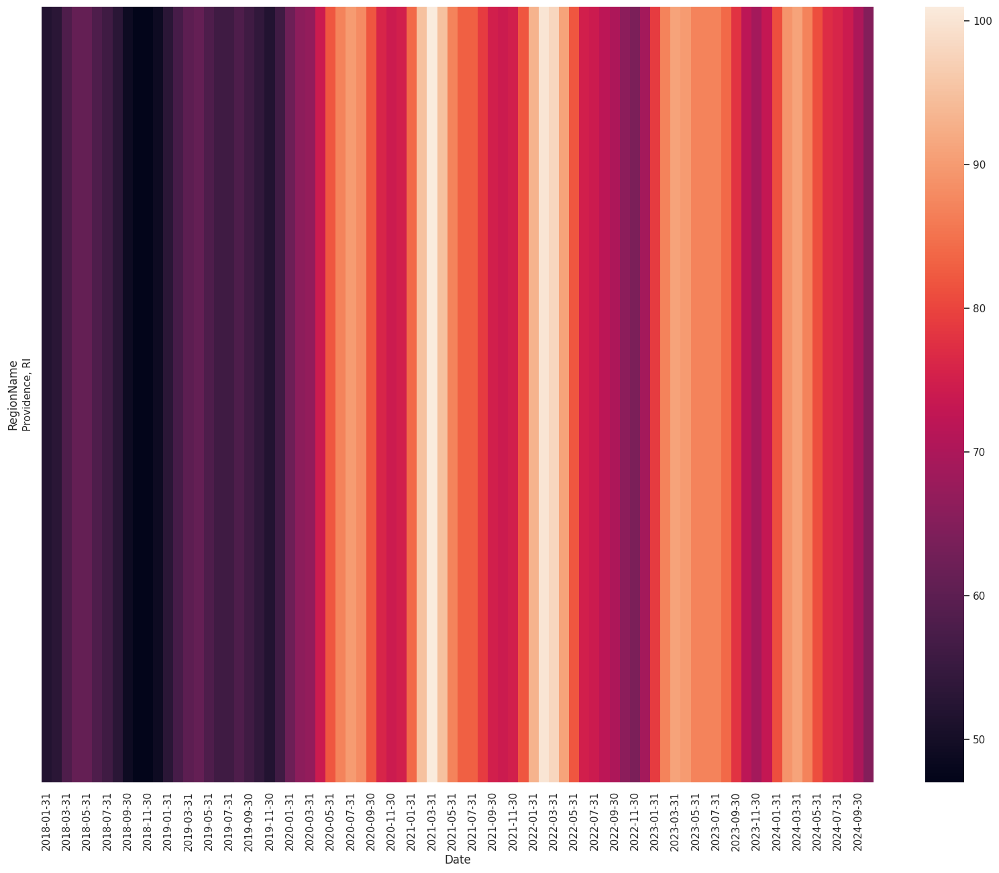

In [289]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'RI'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLRIDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapRIDF = heatMapSQLRIDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapRIDF)

<Axes: xlabel='Date', ylabel='RegionName'>

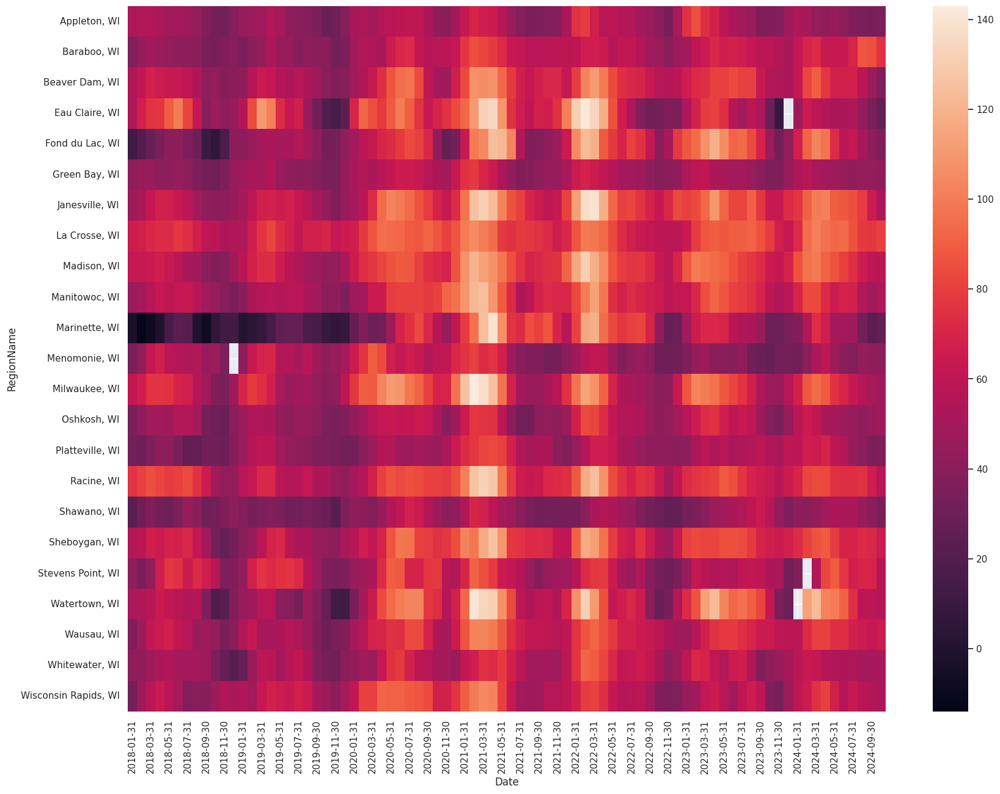

In [290]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'WI'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLWIDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapWIDF = heatMapSQLWIDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapWIDF)

<Axes: xlabel='Date', ylabel='RegionName'>

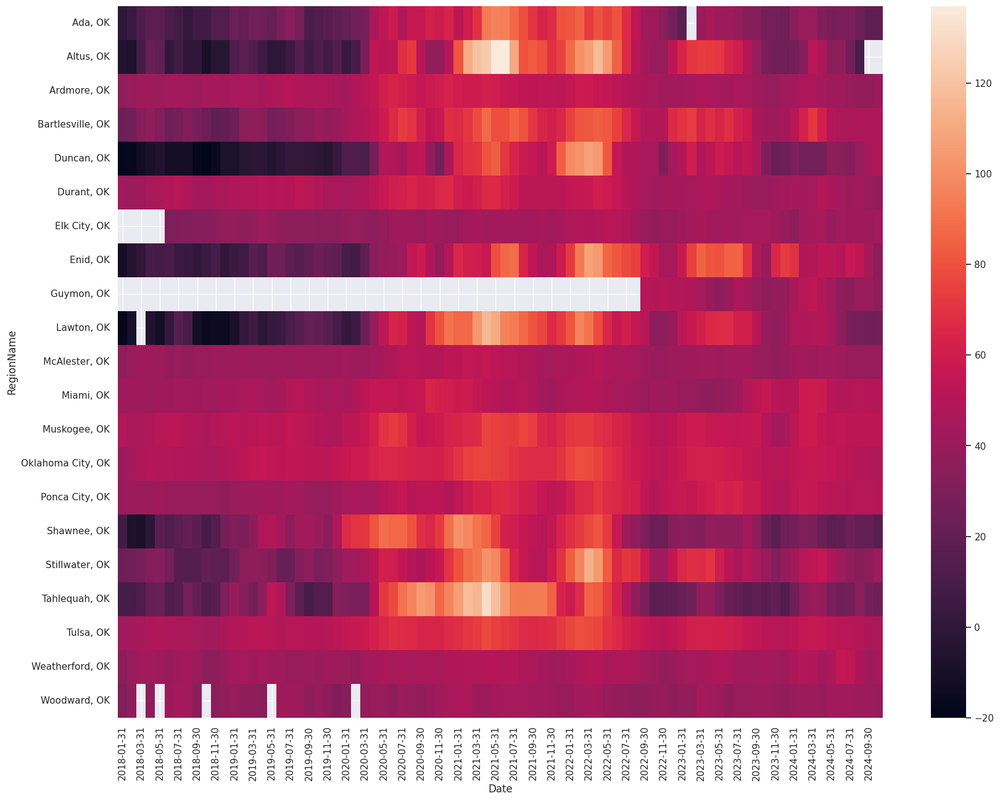

In [291]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'OK'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLOKDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapOKDF = heatMapSQLOKDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapOKDF)

<Axes: xlabel='Date', ylabel='RegionName'>

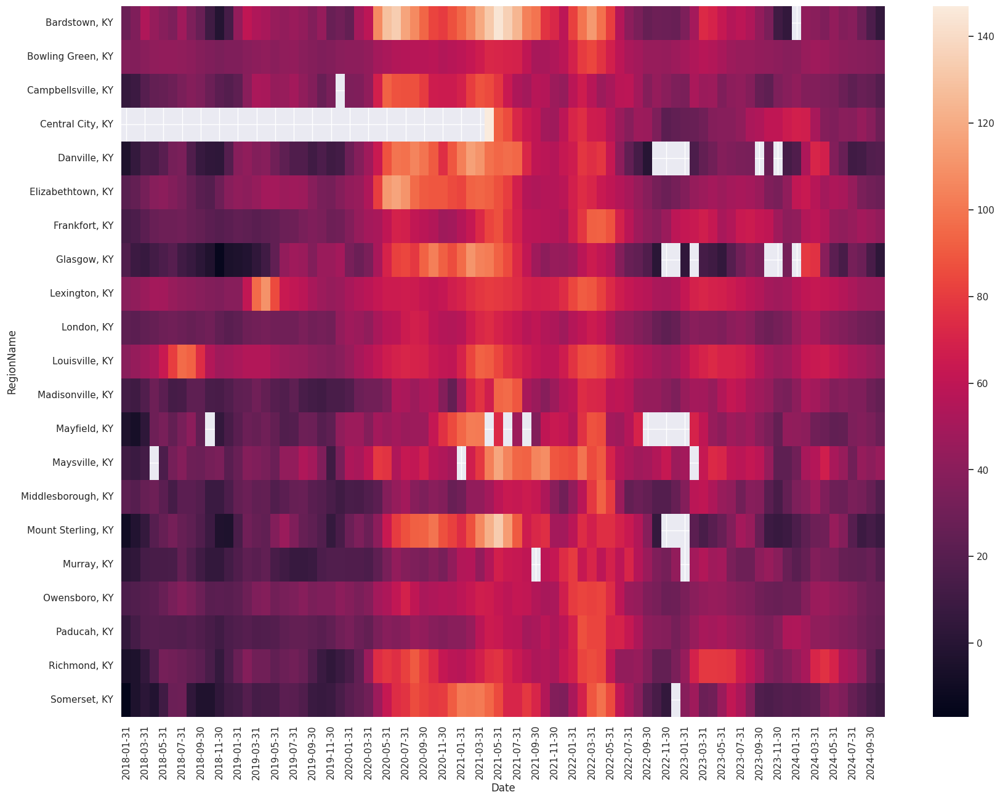

In [292]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'KY'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLKYDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapKYDF = heatMapSQLKYDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapKYDF)

<Axes: xlabel='Date', ylabel='RegionName'>

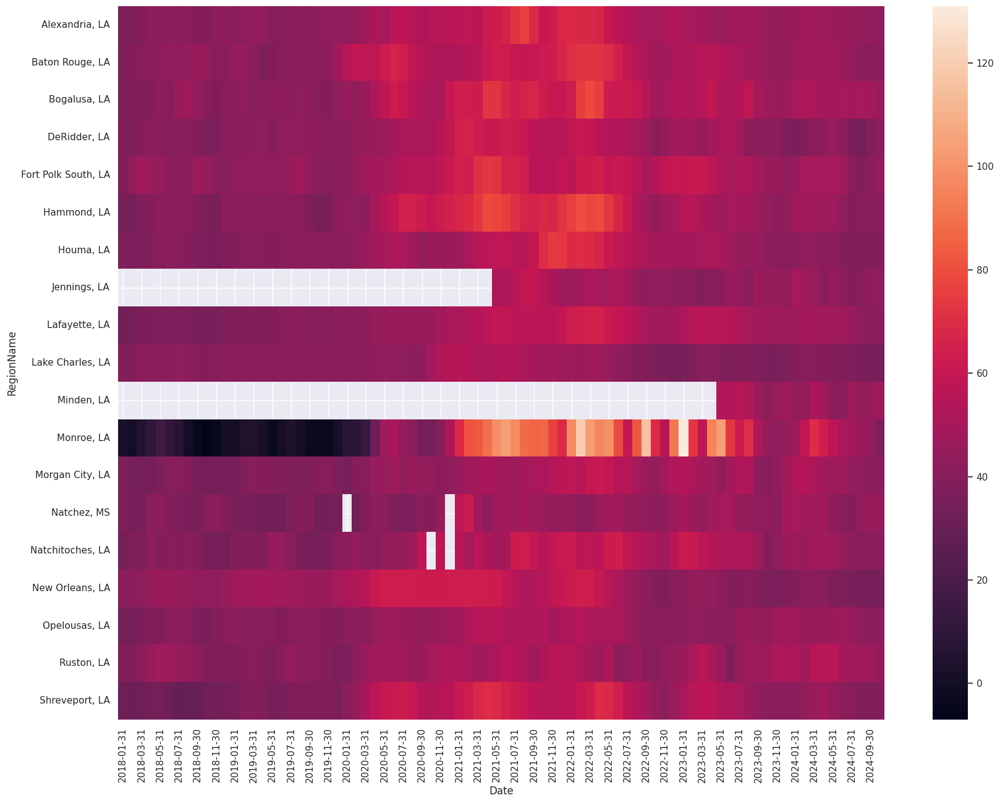

In [293]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'LA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLLADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapLADF = heatMapSQLLADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapLADF)

<Axes: xlabel='Date', ylabel='RegionName'>

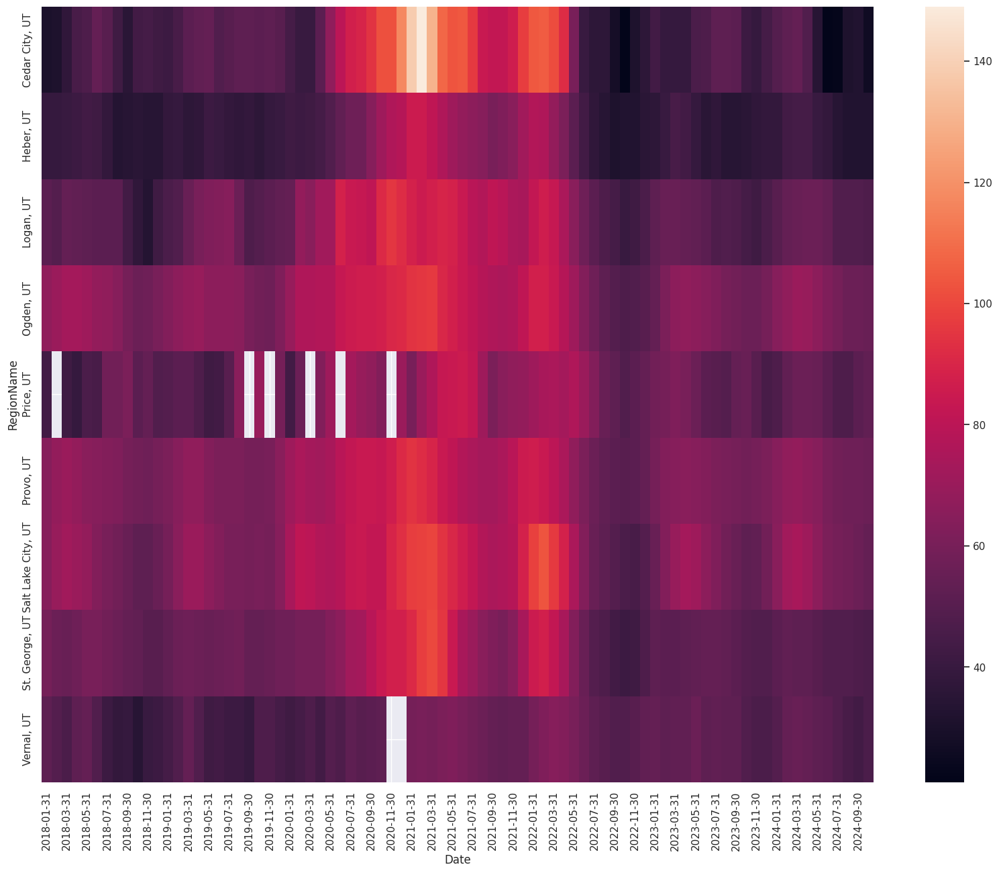

In [294]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'UT'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLUTDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapUTDF = heatMapSQLUTDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapUTDF)

<Axes: xlabel='Date', ylabel='RegionName'>

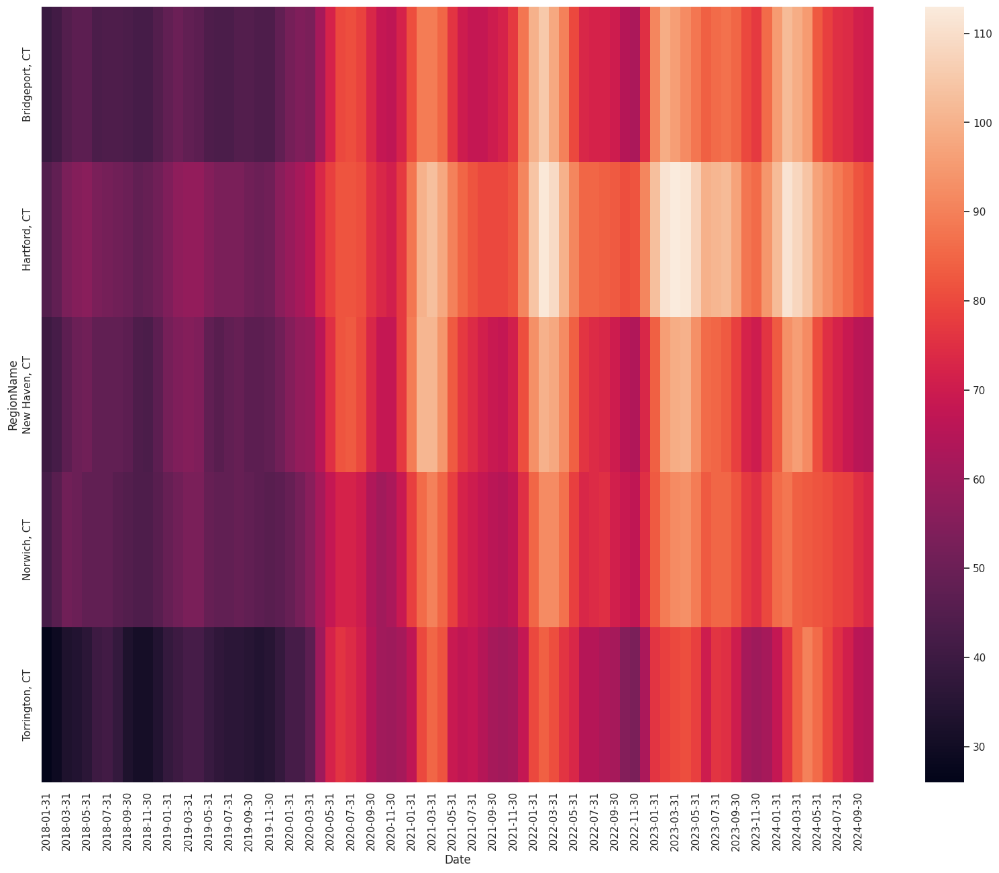

In [295]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'CT'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLCTDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapCTDF = heatMapSQLCTDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapCTDF)

<Axes: xlabel='Date', ylabel='RegionName'>

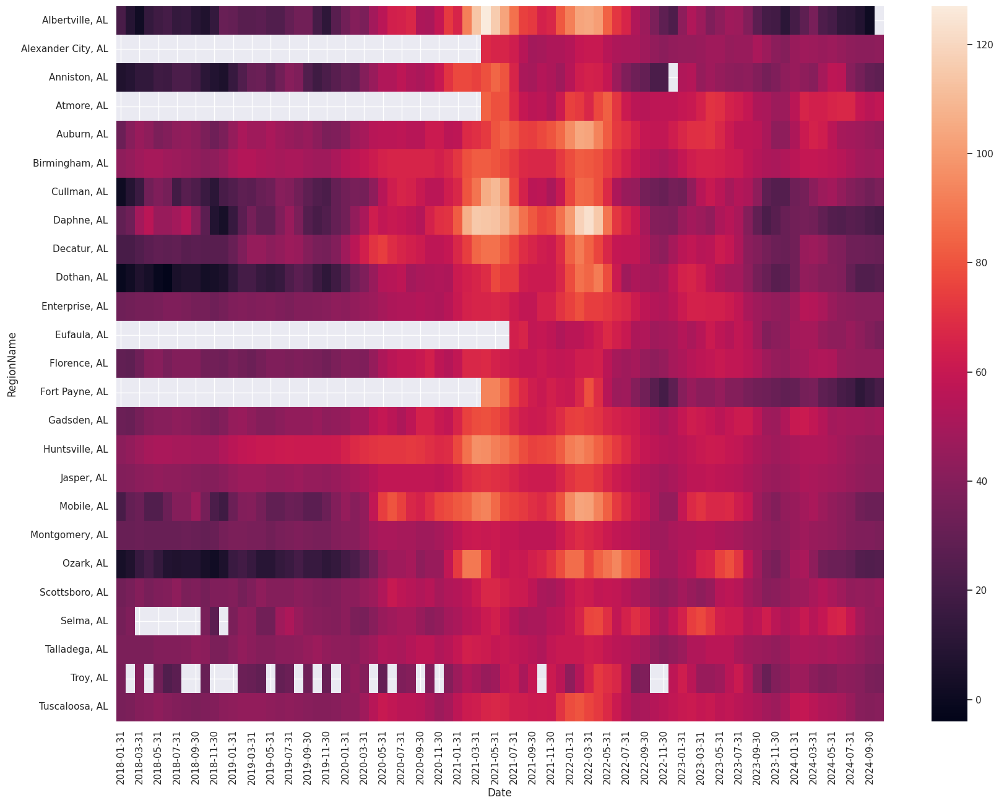

In [296]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'AL'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLALDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapALDF = heatMapSQLALDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapALDF)

<Axes: xlabel='Date', ylabel='RegionName'>

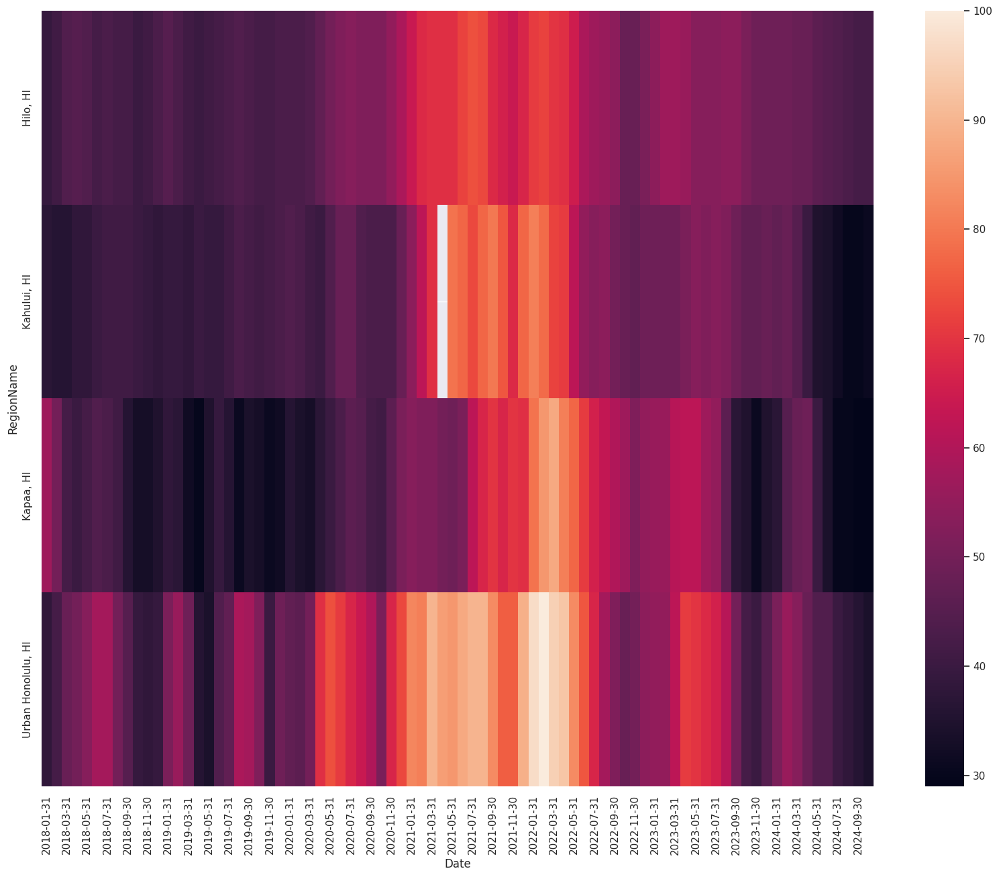

In [297]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'HI'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLHIDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapHIDF = heatMapSQLHIDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapHIDF)

<Axes: xlabel='Date', ylabel='RegionName'>

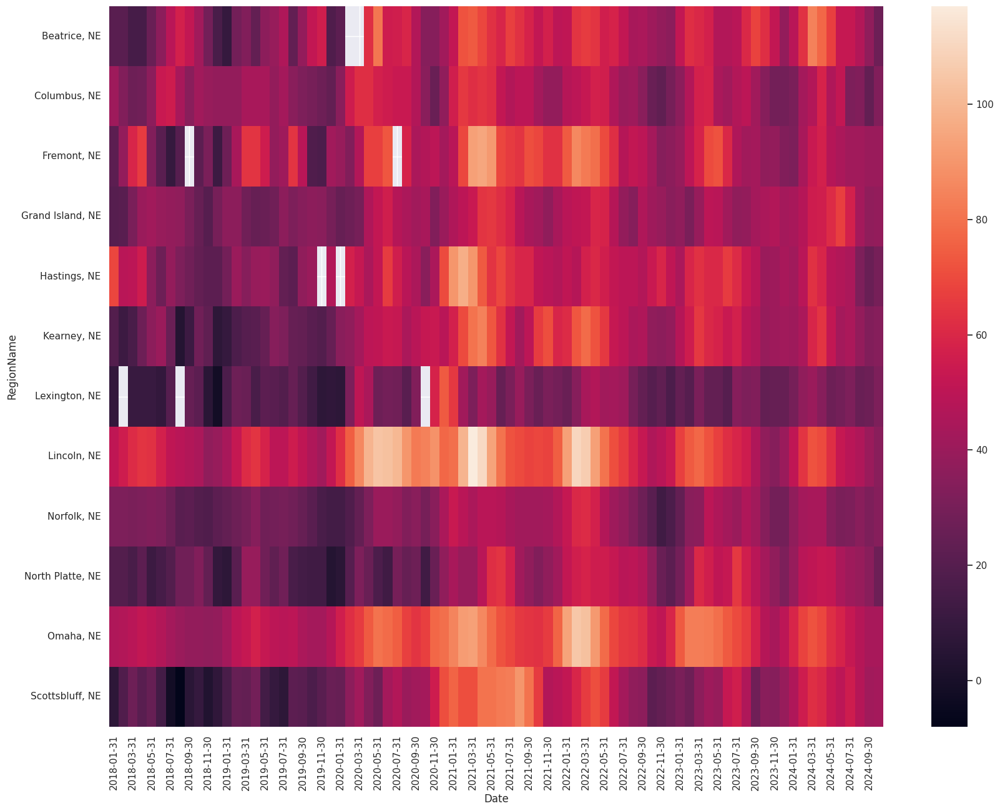

In [298]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NE'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNEDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNEDF = heatMapSQLNEDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNEDF)

<Axes: xlabel='Date', ylabel='RegionName'>

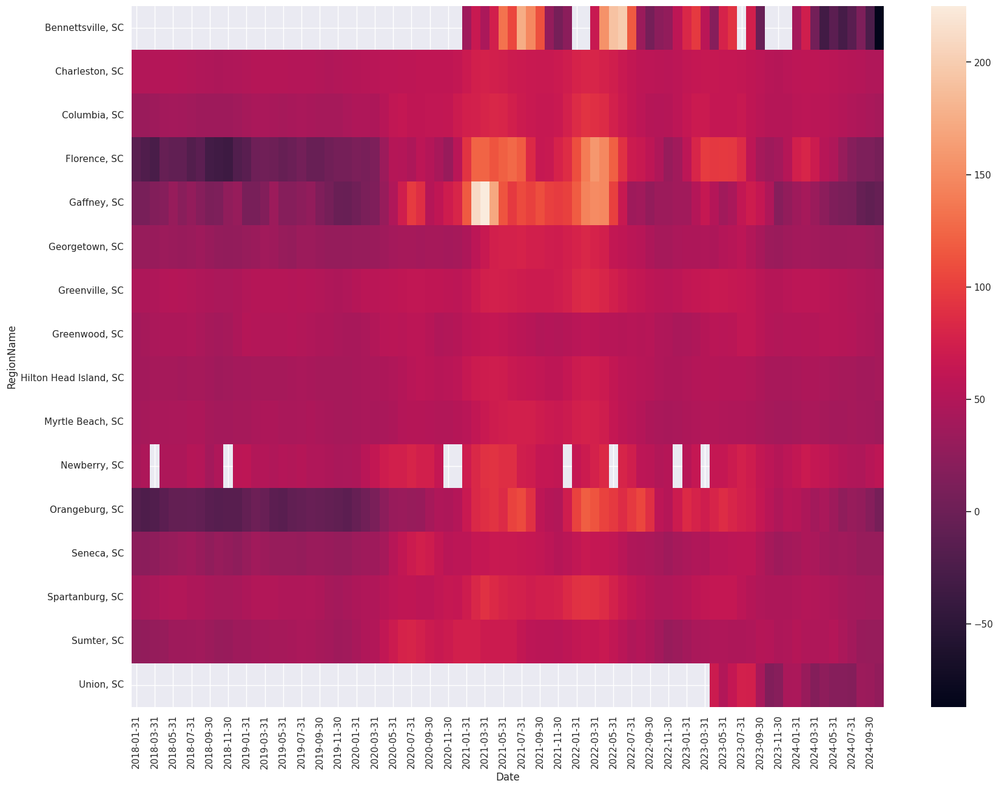

In [299]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'SC'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLSCDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapSCDF = heatMapSQLSCDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapSCDF)

<Axes: xlabel='Date', ylabel='RegionName'>

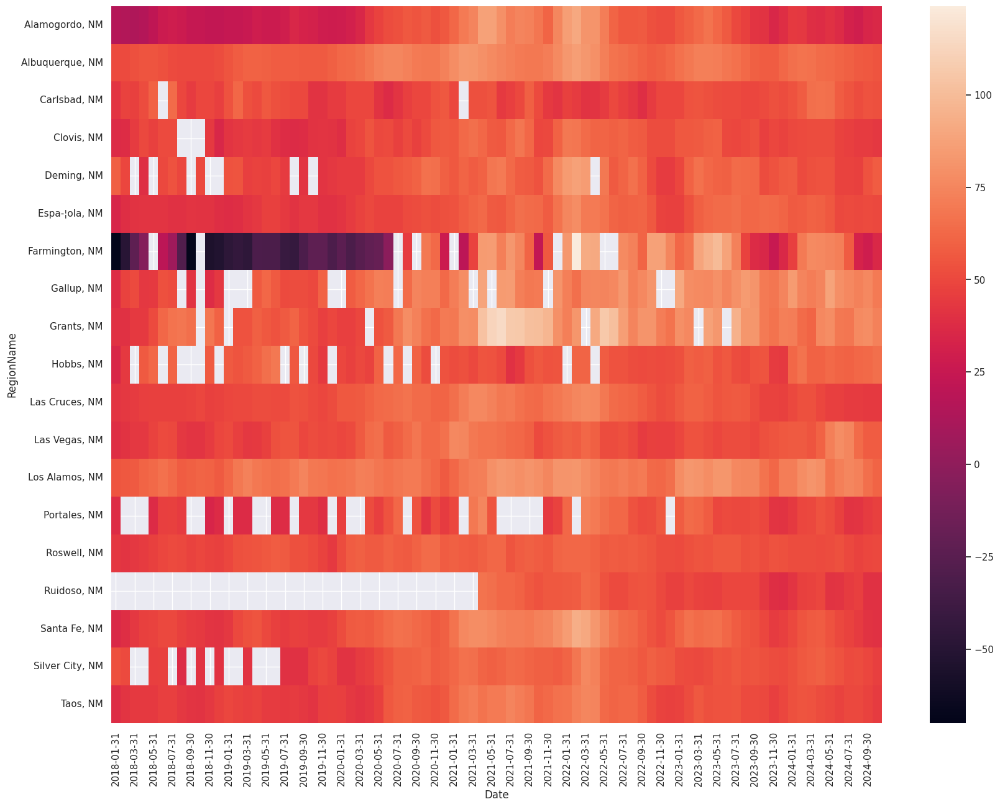

In [300]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NM'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNMDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNMDF = heatMapSQLNMDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNMDF)

<Axes: xlabel='Date', ylabel='RegionName'>

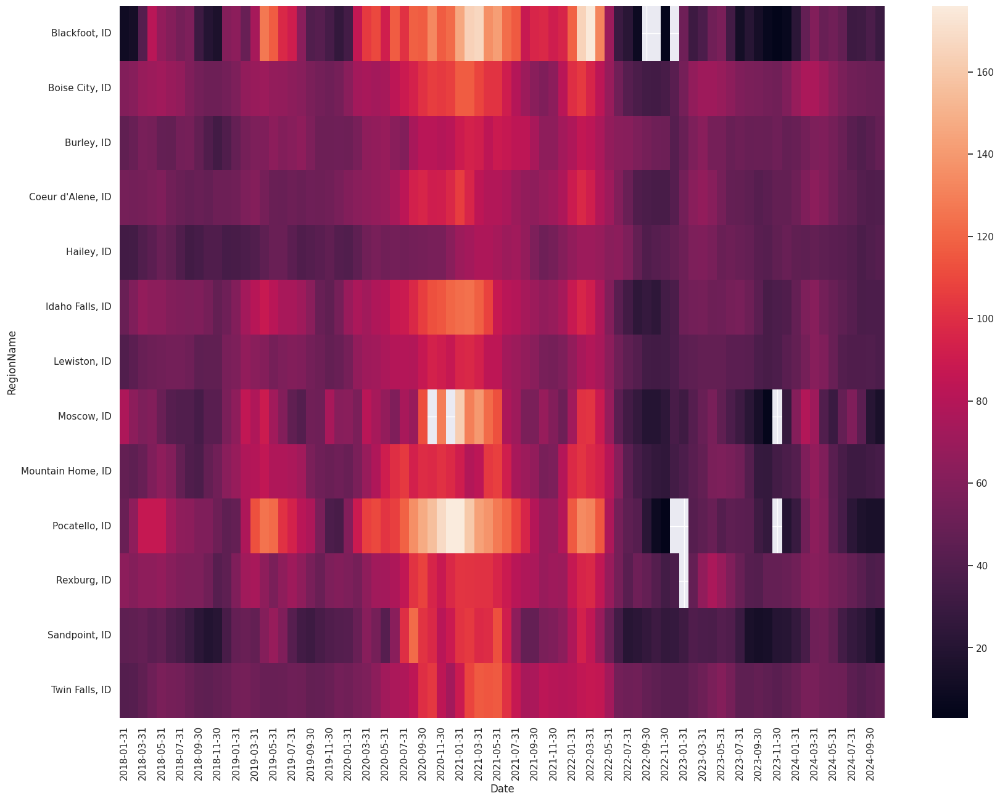

In [301]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'ID'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLIDDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapIDDF = heatMapSQLIDDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapIDDF)

<Axes: xlabel='Date', ylabel='RegionName'>

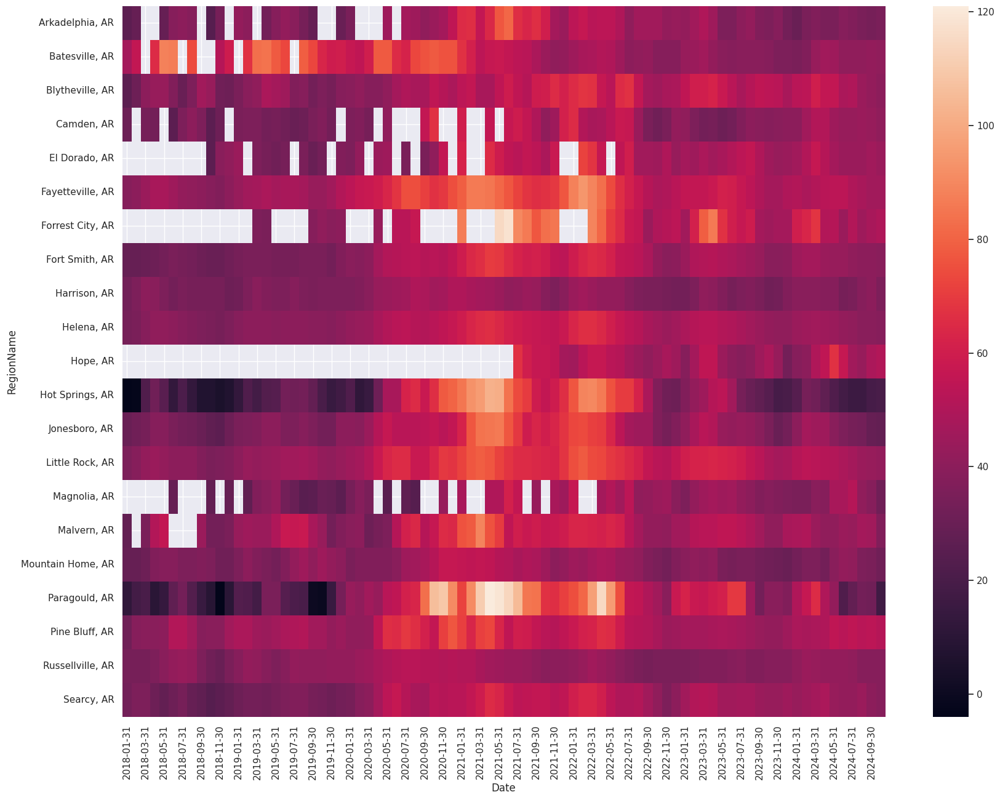

In [302]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'AR'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLARDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapARDF = heatMapSQLARDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapARDF)

<Axes: xlabel='Date', ylabel='RegionName'>

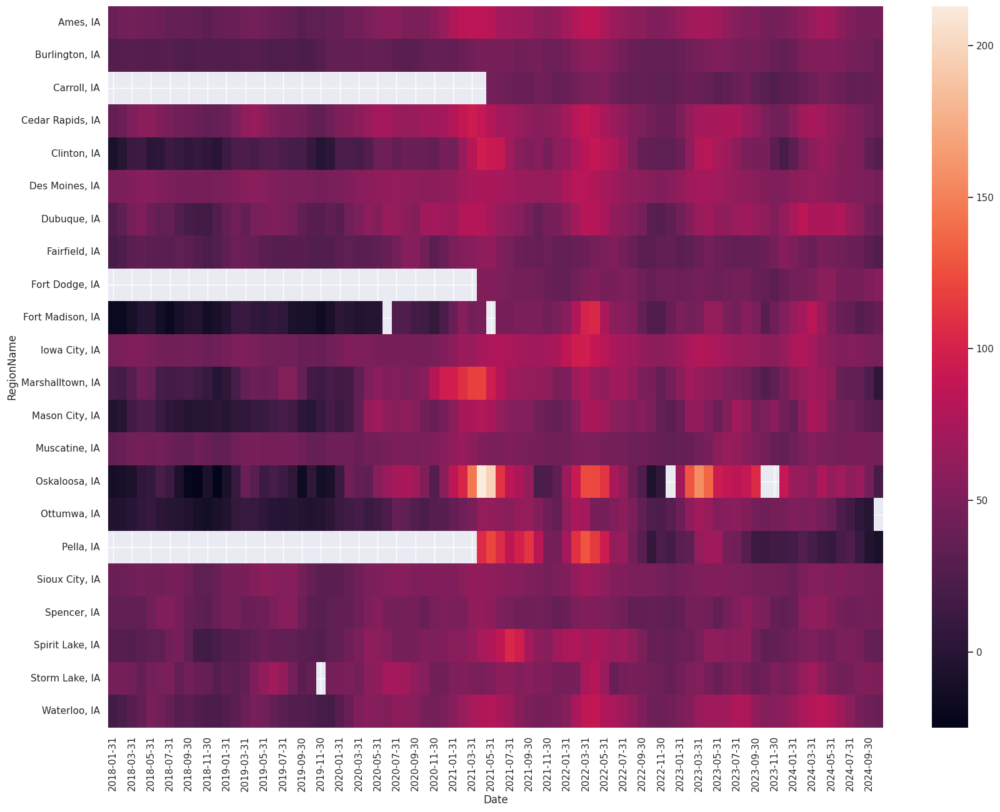

In [303]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'IA'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLIADF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapIADF = heatMapSQLIADF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapIADF)

<Axes: xlabel='Date', ylabel='RegionName'>

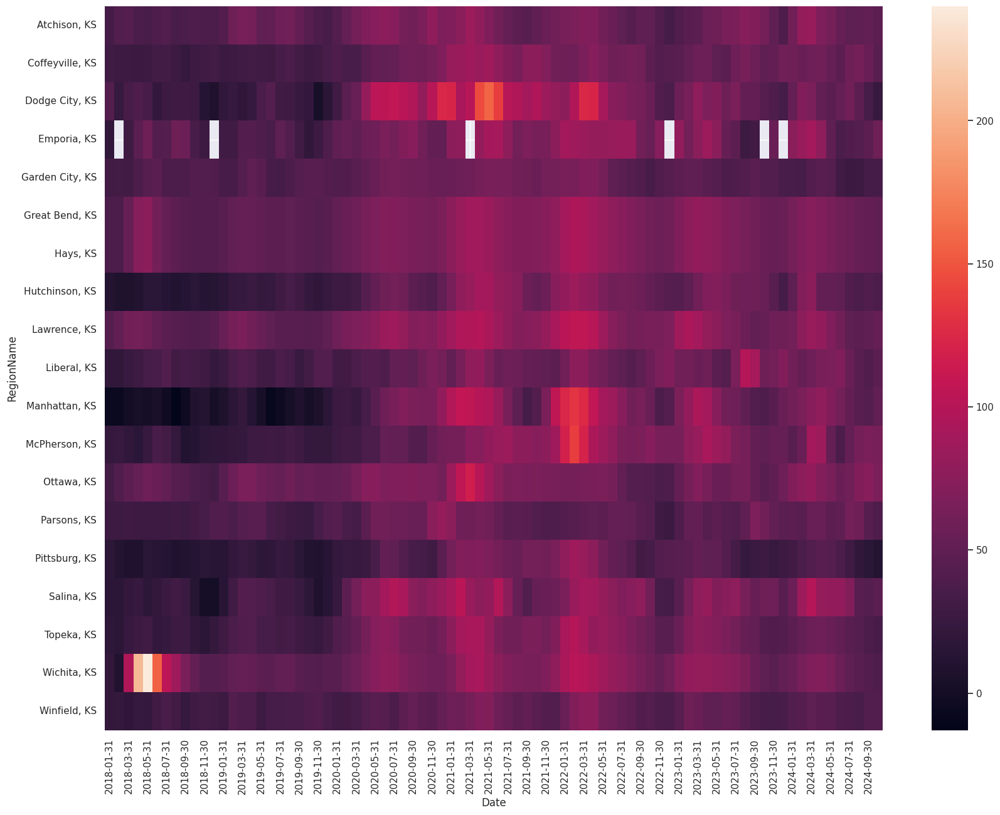

In [304]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'KS'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLKSDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapKSDF = heatMapSQLKSDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapKSDF)

<Axes: xlabel='Date', ylabel='RegionName'>

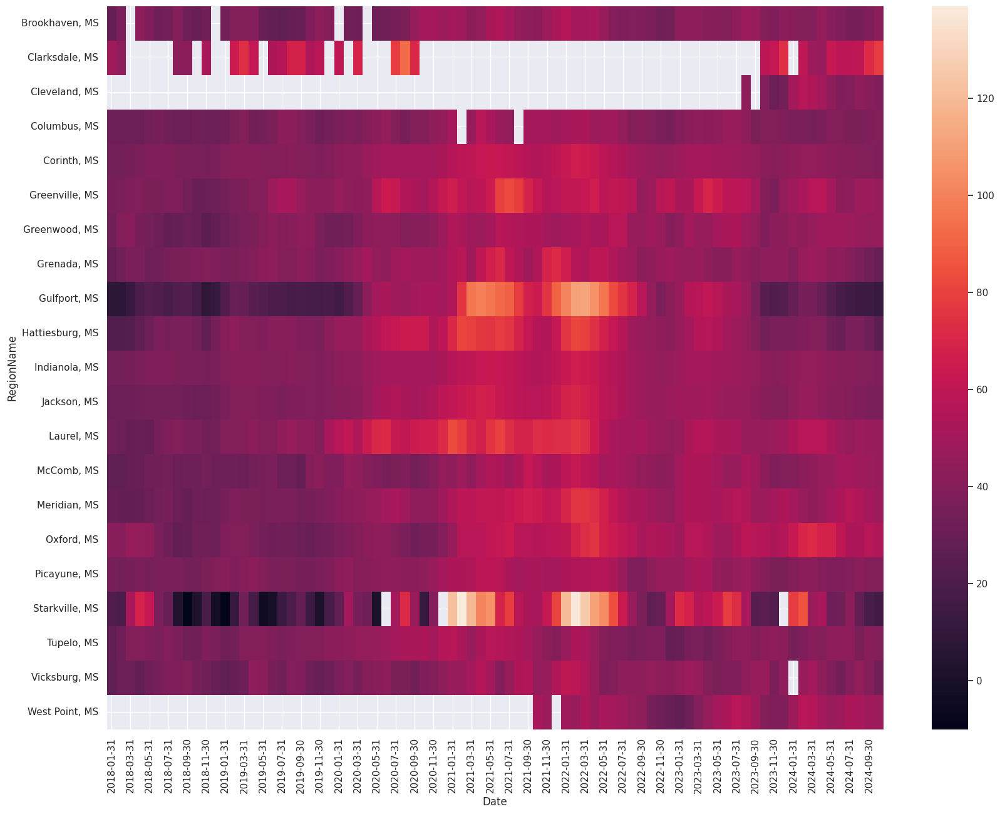

In [305]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MS'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMSDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMSDF = heatMapSQLMSDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMSDF)

<Axes: xlabel='Date', ylabel='RegionName'>

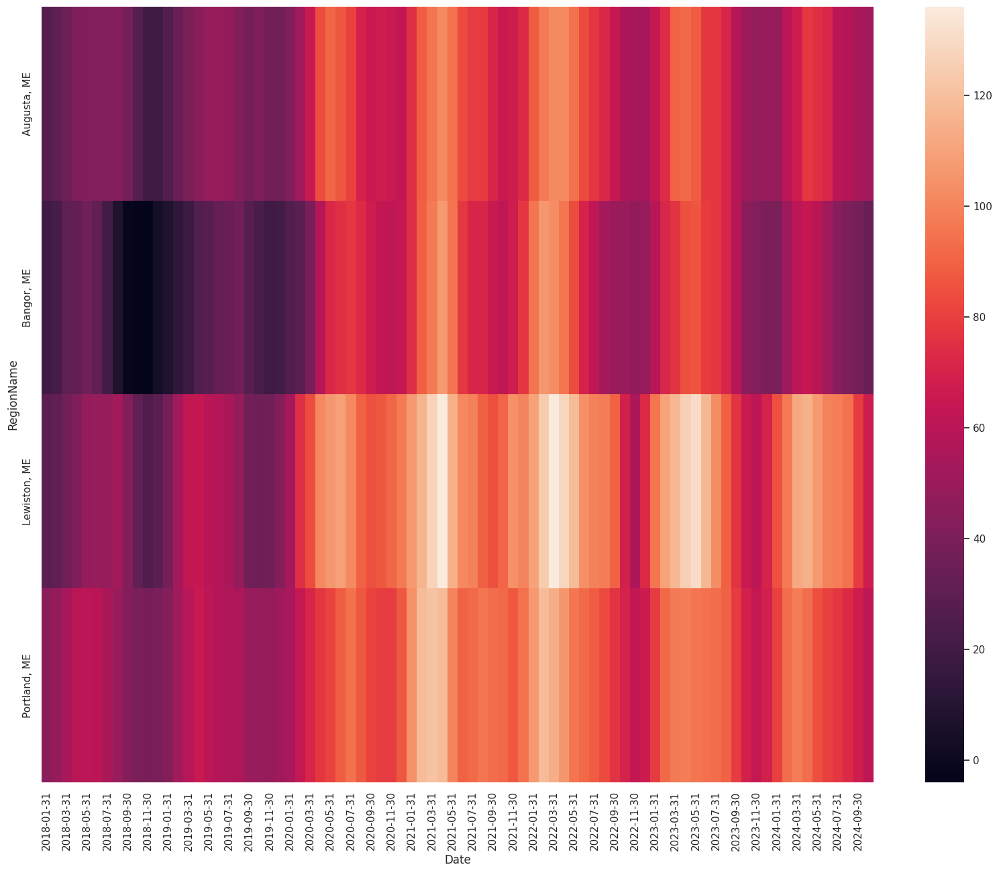

In [306]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'ME'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMEDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMEDF = heatMapSQLMEDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMEDF)

<Axes: xlabel='Date', ylabel='RegionName'>

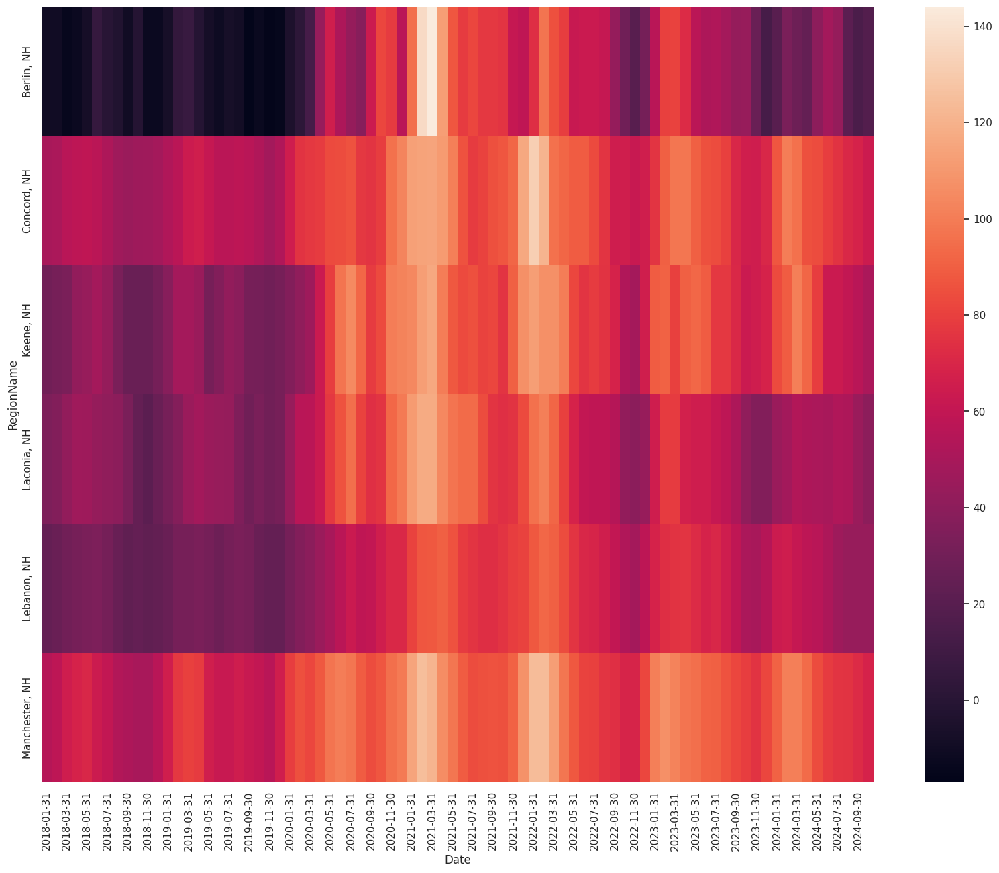

In [307]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NH'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNHDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNHDF = heatMapSQLNHDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNHDF)

<Axes: xlabel='Date', ylabel='RegionName'>

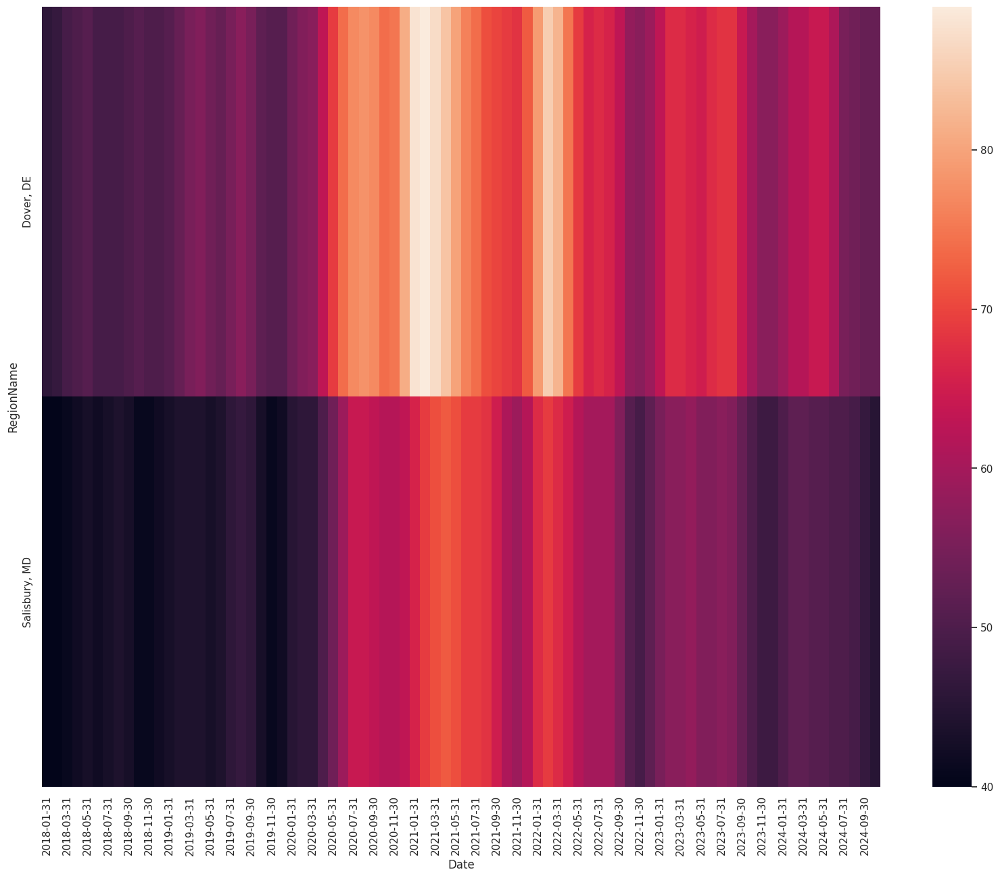

In [308]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'DE'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLDEDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapDEDF = heatMapSQLDEDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapDEDF)

<Axes: xlabel='Date', ylabel='RegionName'>

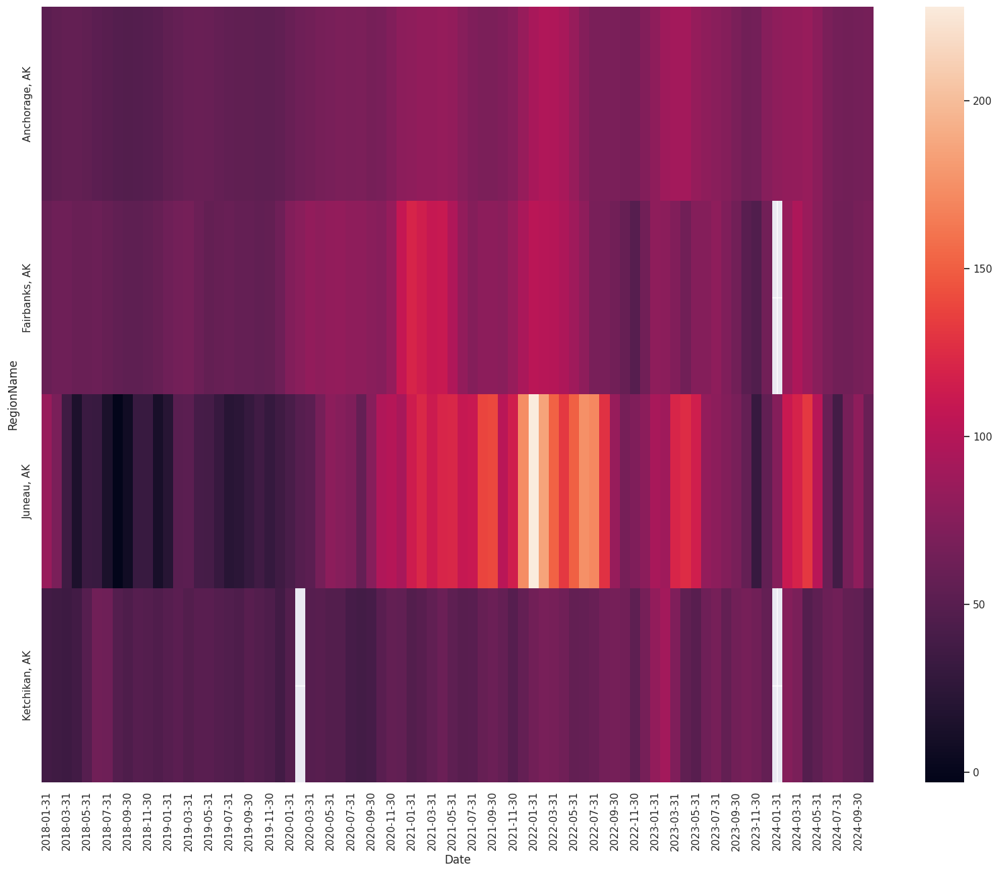

In [309]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'AK'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLAKDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapAKDF = heatMapSQLAKDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapAKDF)

<Axes: xlabel='Date', ylabel='RegionName'>

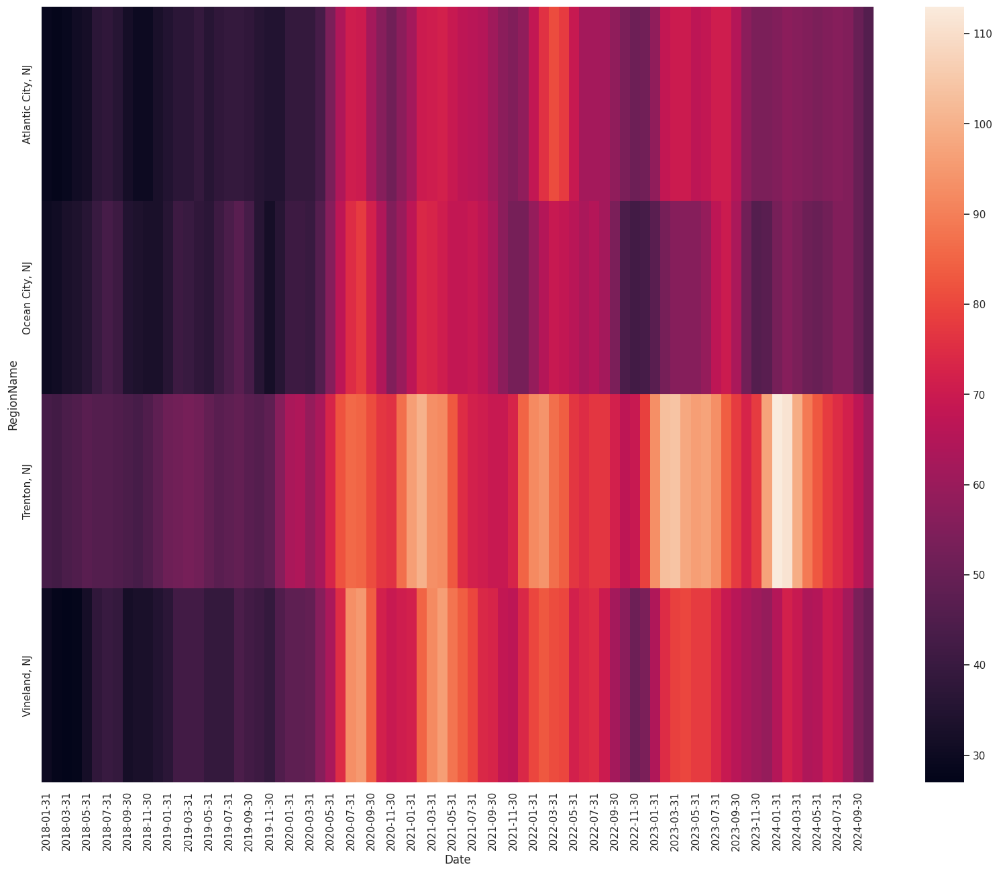

In [310]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'NJ'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNJDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNJDF = heatMapSQLNJDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNJDF)

<Axes: xlabel='Date', ylabel='RegionName'>

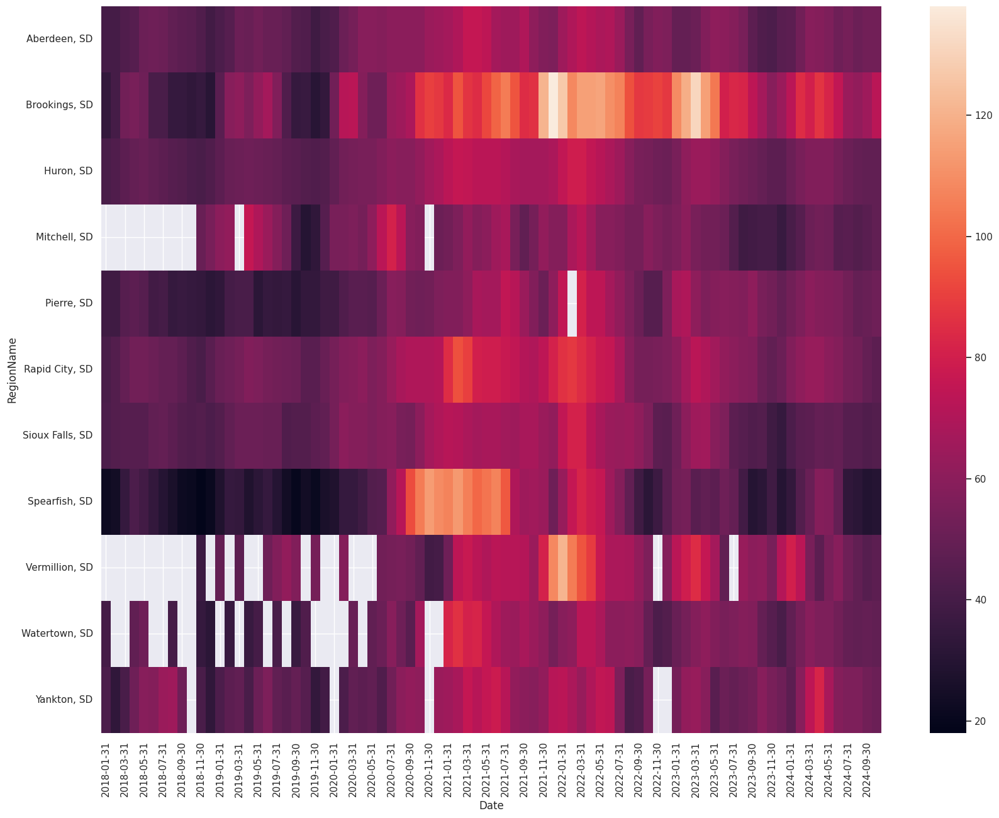

In [311]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'SD'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLSDDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapSDDF = heatMapSQLSDDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapSDDF)

<Axes: xlabel='Date', ylabel='RegionName'>

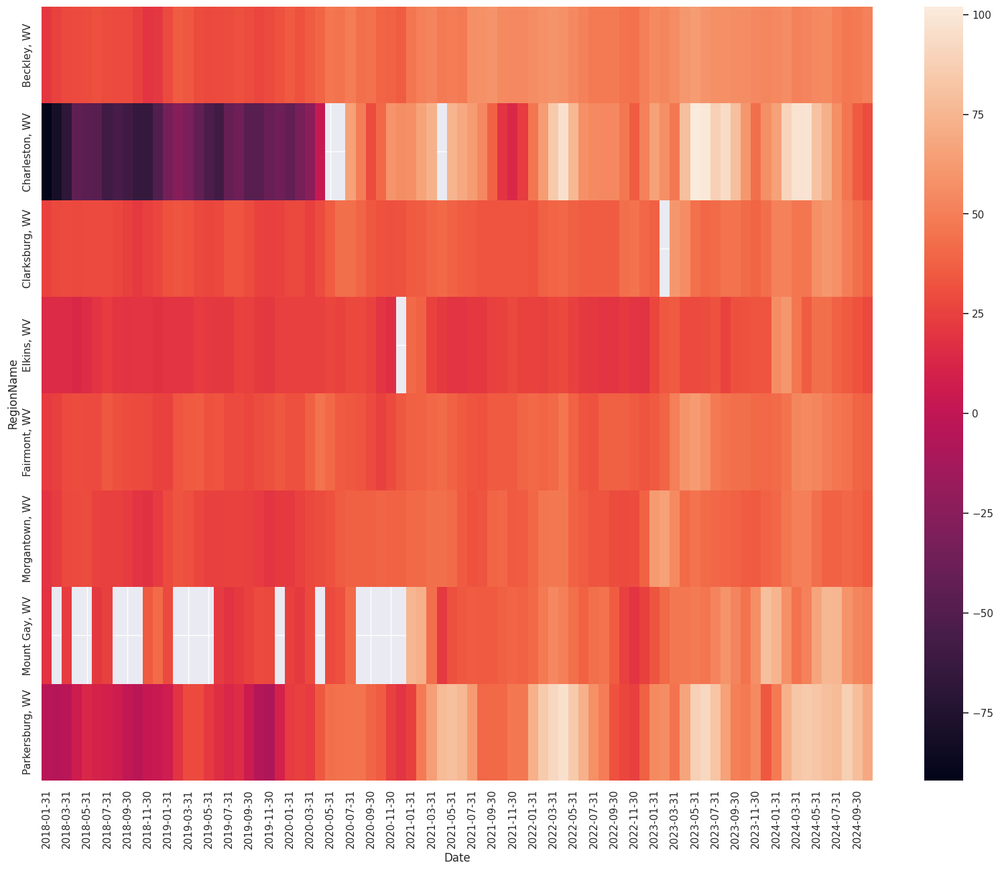

In [312]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'WV'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLWVDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapWVDF = heatMapSQLWVDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapWVDF)

<Axes: xlabel='Date', ylabel='RegionName'>

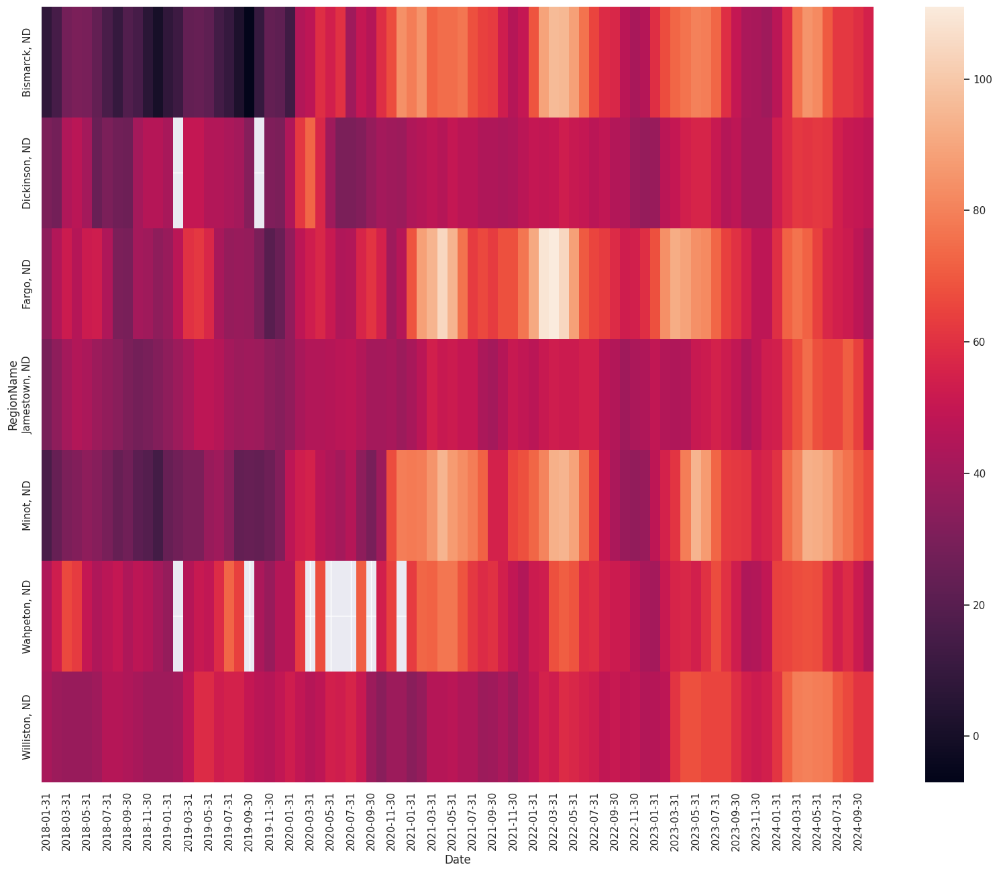

In [313]:
sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'ND'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLNDDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapNDDF = heatMapSQLNDDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapNDDF)

<Axes: xlabel='Date', ylabel='RegionName'>

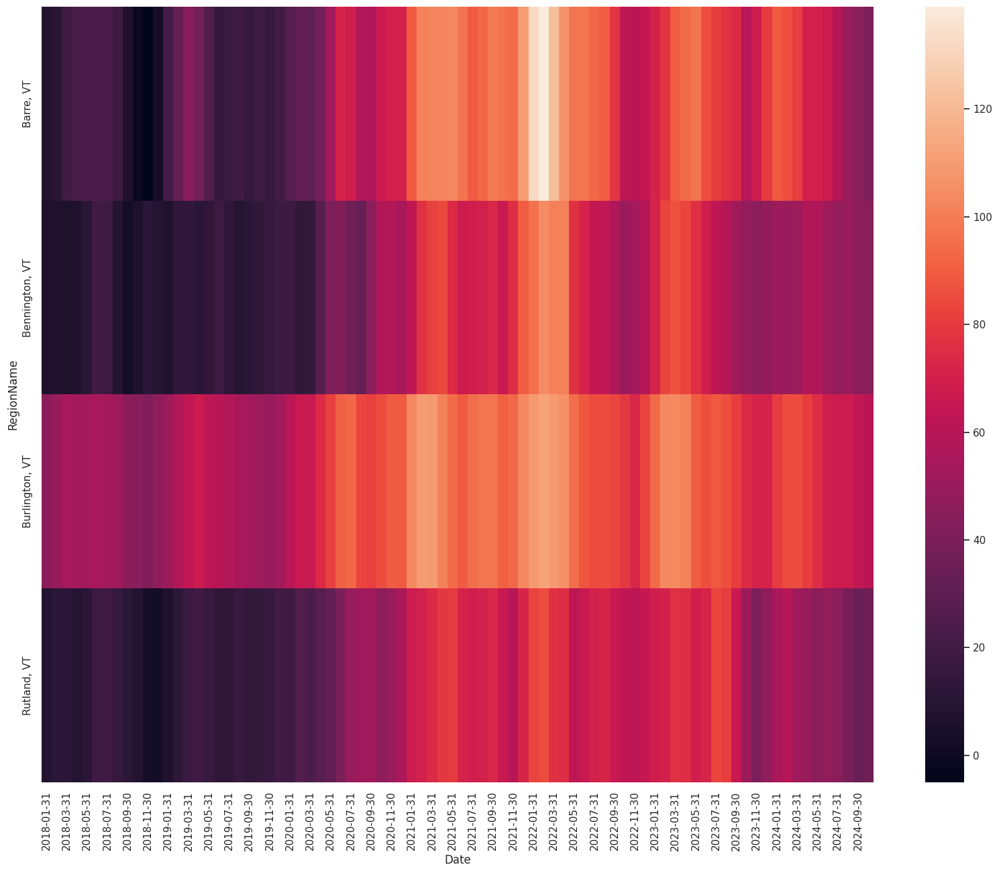

In [314]:

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'VT'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLVTDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapVTDF = heatMapSQLVTDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapVTDF)

<Axes: xlabel='Date', ylabel='RegionName'>

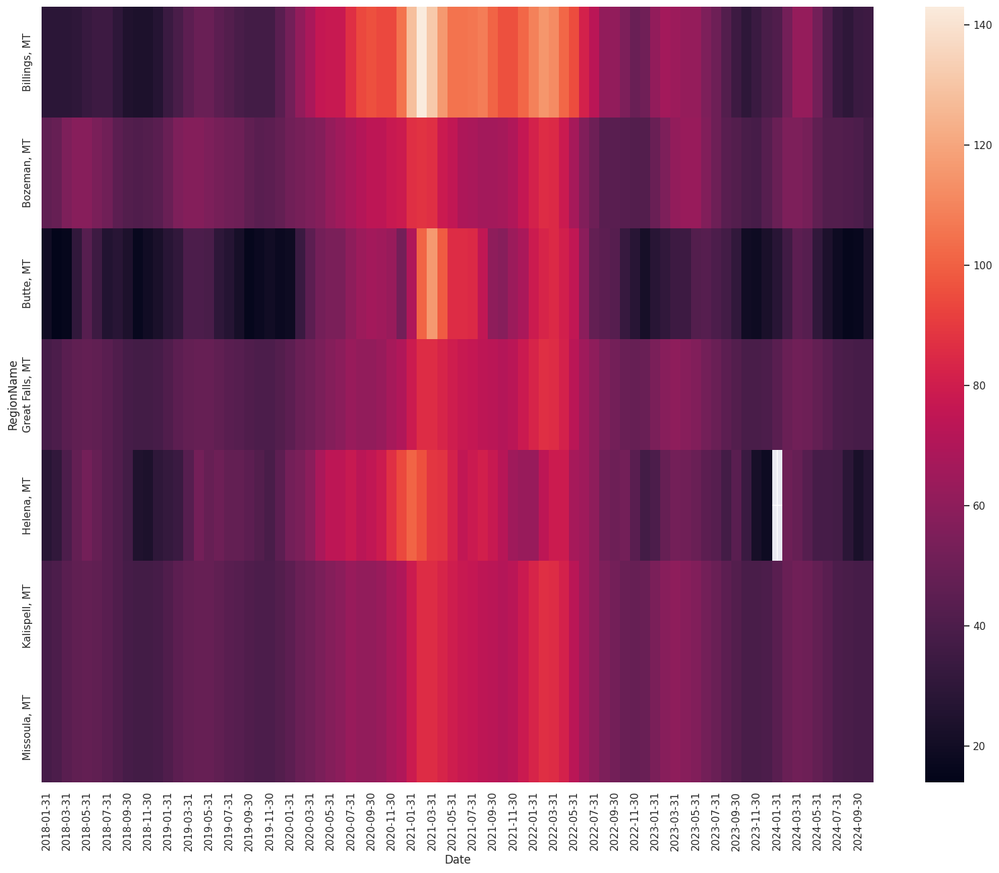

In [315]:

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'MT'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLMTDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapMTDF = heatMapSQLMTDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapMTDF)

<Axes: xlabel='Date', ylabel='RegionName'>

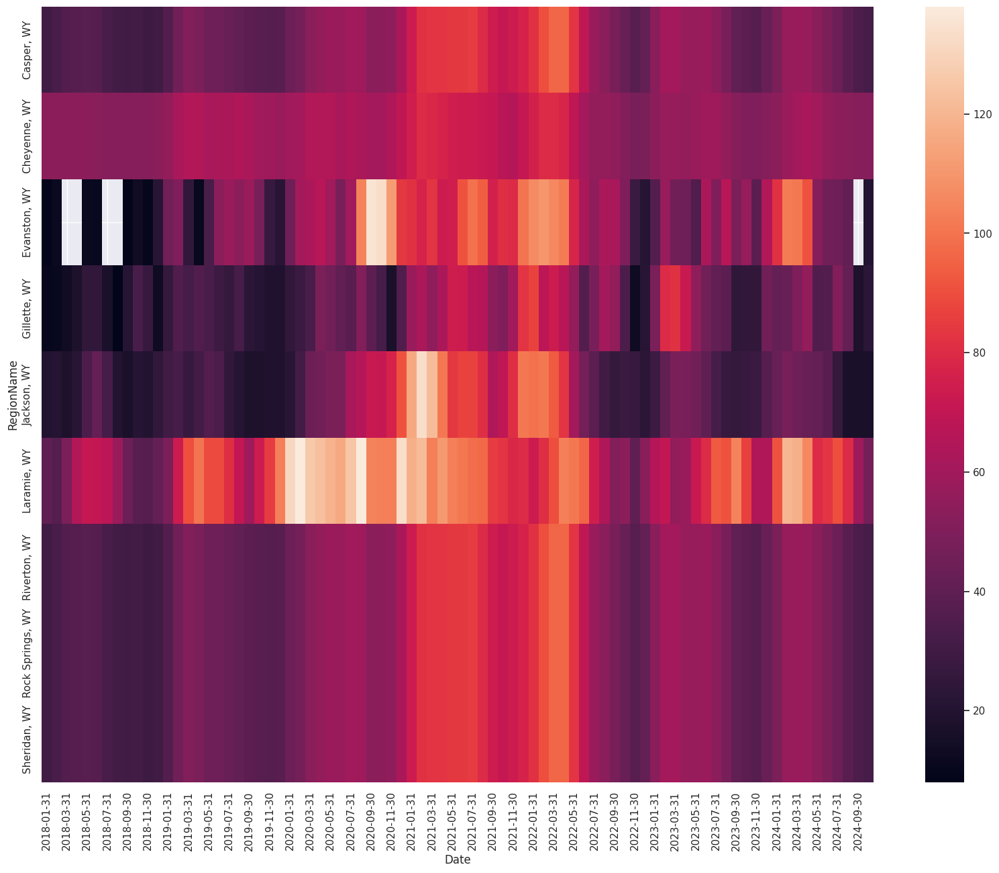

In [316]:

sqlite_select_query = """select * from HeatIndex Where RegionID != '102001' and StateName = 'WY'"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
heatMapSQLWYDF = pd.DataFrame(records, columns= ['index','RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date', 'Temp'])

heatMapWYDF = heatMapSQLWYDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapWYDF)

In [317]:
#IQR of heat indexes to find the volativity of a region

heatDF['Q1'] = np.nan
heatDF['Q3'] = np.nan
heatDF['IQR'] = np.nan

for i, r in heatDF.iterrows():
   if r['RegionID'] != '102001':
        fDF = heatMapSQLDF[heatMapSQLDF['RegionName'] == r['RegionName']]
        heatDF.at[i, 'Q1'] = fDF['Temp'].quantile(.25)
        heatDF.at[i, 'Q3'] = fDF['Temp'].quantile(.75)
        heatDF.at[i, 'IQR'] = fDF['Temp'].quantile(.75) - fDF['Temp'].quantile(.25)
heatDF.head(5)

,RegionID,SizeRank,RegionName,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,Q1,Q3,IQR
0,102001,0,United States,NaN,49.0,50.0,52.0,54.0,55.0,53.0,...,62.0,59.0,57.0,55.0,53.0,52.0,50.0,NaN,NaN,NaN
1,394913,1,"New York, NY",NY,52.0,52.0,55.0,56.0,55.0,52.0,...,86.0,81.0,77.0,76.0,76.0,73.0,69.0,56.0,82.75,26.75
2,753899,2,"Los Angeles, CA",CA,68.0,66.0,65.0,66.0,66.0,63.0,...,80.0,74.0,70.0,67.0,65.0,62.0,61.0,65.0,85.00,20.00
3,394463,3,"Chicago, IL",IL,48.0,49.0,51.0,52.0,51.0,48.0,...,75.0,71.0,67.0,64.0,61.0,58.0,56.0,52.0,67.00,15.00
4,394514,4,"Dallas, TX",TX,55.0,55.0,58.0,60.0,59.0,55.0,...,65.0,59.0,55.0,51.0,49.0,48.0,48.0,55.0,76.00,21.00


In [318]:
volitileDF = heatDF.sort_values(by=['IQR'], ascending=False)
volitileDF.index = pd.RangeIndex(len(volitileDF.index))

volitileDF.head(5)

,RegionID,SizeRank,RegionName,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,Q1,Q3,IQR
0,395140,415,"Sunbury, PA",PA,-81.0,-64.0,-57.0,-69.0,-65.0,-52.0,...,97.0,78.0,54.0,31.0,27.0,12.0,20.0,-40.00,71.00,111.00
1,395069,738,"Sault Ste. Marie, MI",MI,-58.0,-42.0,-28.0,-10.0,-34.0,-37.0,...,69.0,56.0,37.0,30.0,32.0,15.0,4.0,-35.50,69.75,105.25
2,394455,192,"Charleston, WV",WV,-92.0,-80.0,-68.0,-44.0,-46.0,-47.0,...,98.0,81.0,72.0,57.0,46.0,35.0,30.0,-39.00,65.00,104.00
3,394324,779,"Americus, GA",GA,-44.0,-43.0,-32.0,-46.0,-39.0,-27.0,...,109.0,46.0,25.0,29.0,38.0,29.0,20.0,-19.00,79.00,98.00
4,394588,342,"Farmington, NM",NM,-70.0,-49.0,-23.0,-5.0,NaN,20.0,...,76.0,74.0,72.0,58.0,33.0,29.0,36.0,-23.75,73.75,97.50


In [319]:
volitileSQlDF = volitileDF[['RegionID', 'RegionName', 'StateName', 'Q1', 'Q3', 'IQR']]
volitileSQlDF

,RegionID,RegionName,StateName,Q1,Q3,IQR
0,395140,"Sunbury, PA",PA,-40.00,71.00,111.00
1,395069,"Sault Ste. Marie, MI",MI,-35.50,69.75,105.25
2,394455,"Charleston, WV",WV,-39.00,65.00,104.00
3,394324,"Americus, GA",GA,-19.00,79.00,98.00
4,394588,"Farmington, NM",NM,-23.75,73.75,97.50
...,...,...,...,...,...,...
923,394842,"McAlester, OK",OK,41.00,46.00,5.00
924,395236,"Woodward, OK",OK,38.00,43.00,5.00
925,394763,"Lake Charles, LA",LA,39.00,43.75,4.75
926,394699,"Huntsville, TX",TX,40.00,44.00,4.00


In [320]:
volitileSQlDF.to_sql('Volatility', sqliteConnection, if_exists='replace')

928

In [321]:
sqlite_select_query = """select  HGF.* from HouseGrowthForcast HGF
Where HGF.RegionID in ( SELECT DISTINCT RegionID from Volatility
Order BY IQR DESC LIMIT 50)
"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
UnstableDF = pd.DataFrame(records, columns= ['Index', 'RegionID', 'SizeRank', 'RegionName', 'StateName', 'BaseDate', 'Date' , 'Growth'])

UnstableDF

,Index,RegionID,SizeRank,RegionName,StateName,BaseDate,Date,Growth
0,51,395031,52,"Rochester, NY",NY,2024-10-31,2024-11-30,0.2
1,188,394455,192,"Charleston, WV",WV,2024-10-31,2024-11-30,0.1
2,215,394872,222,"Monroe, LA",LA,2024-10-31,2024-11-30,-0.4
3,221,394597,228,"Florence, SC",SC,2024-10-31,2024-11-30,0.0
4,287,394306,295,"Albany, GA",GA,2024-10-31,2024-11-30,-0.3
...,...,...,...,...,...,...,...,...
142,2599,394921,841,"North Vernon, IN",IN,2024-10-31,2025-10-31,3.9
143,2602,394381,846,"Bennettsville, SC",SC,2024-10-31,2025-10-31,-7.4
144,2610,394912,855,"New Ulm, MN",MN,2024-10-31,2025-10-31,1.1
145,2619,394322,864,"Altus, OK",OK,2024-10-31,2025-10-31,-0.1


In [322]:
sqlite_select_query = """select  HGF.* from HouseGrowthForcast HGF
Where HGF.RegionID in ( SELECT DISTINCT RegionID from Volatility
Order BY IQR  LIMIT 50) and RegionID !='102001'
"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
StableDF = pd.DataFrame(records, columns= ['Index', 'RegionID', 'SizeRank', 'RegionName', 'StateName', 'BaseDate', 'Date' , 'Growth'])

StableDF

,Index,RegionID,SizeRank,RegionName,StateName,BaseDate,Date,Growth
0,8,394856,8,"Miami, FL",FL,2024-10-31,2024-11-30,-0.2
1,206,394763,213,"Lake Charles, LA",LA,2024-10-31,2024-11-30,-0.6
2,261,395170,269,"Tupelo, MS",MS,2024-10-31,2024-11-30,0.3
3,288,395102,297,"Sioux City, IA",IA,2024-10-31,2024-11-30,0.0
4,422,395042,435,"Russellville, AR",AR,2024-10-31,2024-11-30,0.0
...,...,...,...,...,...,...,...,...
115,2603,394615,847,"Fredericksburg, TX",TX,2024-10-31,2025-10-31,0.9
116,2604,395159,848,"Toccoa, GA",GA,2024-10-31,2025-10-31,6.6
117,2626,395236,871,"Woodward, OK",OK,2024-10-31,2025-10-31,-2.6
118,2637,394564,884,"Elk City, OK",OK,2024-10-31,2025-10-31,-0.1


In [323]:
sqlite_select_query = """select  * from HeatIndex
Where RegionID in ( SELECT DISTINCT RegionID from Volatility
Order BY IQR DESC LIMIT 50)
"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
UnstableHeatDF = pd.DataFrame(records, columns= ['Index', 'RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date' , 'Temp'])

UnstableHeatDF

,Index,RegionID,SizeRank,RegionName,StateName,Date,Temp
0,51,395031,52,"Rochester, NY",NY,2018-01-31,37.0
1,190,394455,192,"Charleston, WV",WV,2018-01-31,-92.0
2,219,394872,222,"Monroe, LA",LA,2018-01-31,3.0
3,225,394597,228,"Florence, SC",SC,2018-01-31,-15.0
4,291,394306,295,"Albany, GA",GA,2018-01-31,-47.0
...,...,...,...,...,...,...,...
4095,76000,394921,841,"North Vernon, IN",IN,2024-10-31,-15.0
4096,76005,394381,846,"Bennettsville, SC",SC,2024-10-31,-87.0
4097,76013,394912,855,"New Ulm, MN",MN,2024-10-31,22.0
4098,76022,394322,864,"Altus, OK",OK,2024-10-31,NaN


In [324]:
sqlite_select_query = """select  * from HeatIndex
Where RegionID in ( SELECT DISTINCT RegionID from Volatility
Order BY IQR  LIMIT 50)
"""
cursor.execute(sqlite_select_query)
records = cursor.fetchall()
stableHeatDF = pd.DataFrame(records, columns= ['Index', 'RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date' , 'Temp'])

stableHeatDF

,Index,RegionID,SizeRank,RegionName,StateName,Date,Temp
0,0,102001,0,United States,None,2018-01-31,49.0
1,8,394856,8,"Miami, FL",FL,2018-01-31,38.0
2,210,394763,213,"Lake Charles, LA",LA,2018-01-31,39.0
3,265,395170,269,"Tupelo, MS",MS,2018-01-31,28.0
4,293,395102,297,"Sioux City, IA",IA,2018-01-31,40.0
...,...,...,...,...,...,...,...
4095,76042,394564,884,"Elk City, OK",OK,2024-10-31,43.0
4096,76044,395239,885,"Worthington, MN",MN,2024-10-31,37.0
4097,76060,786254,902,"Carroll, IA",IA,2024-10-31,38.0
4098,76071,786257,914,"Fairmont, MN",MN,2024-10-31,57.0


__Heat map of the least volatile regions__

<Axes: xlabel='Date', ylabel='RegionName'>

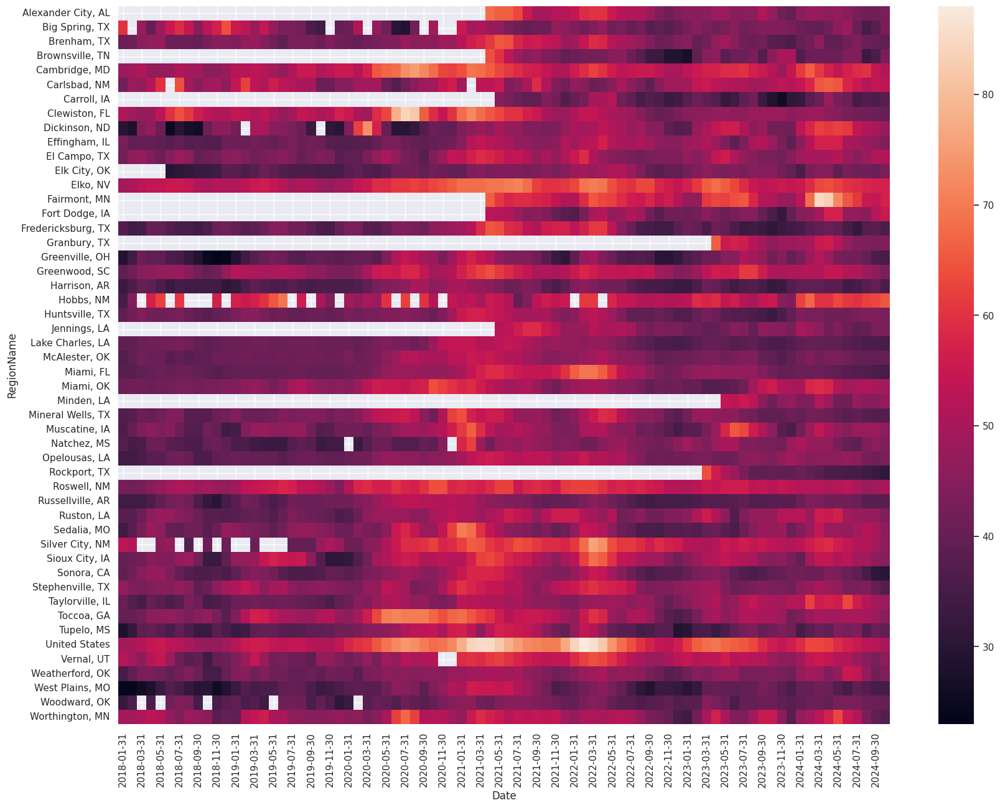

In [325]:
heatMapStableDF = stableHeatDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapStableDF)

<Axes: xlabel='Date', ylabel='RegionName'>

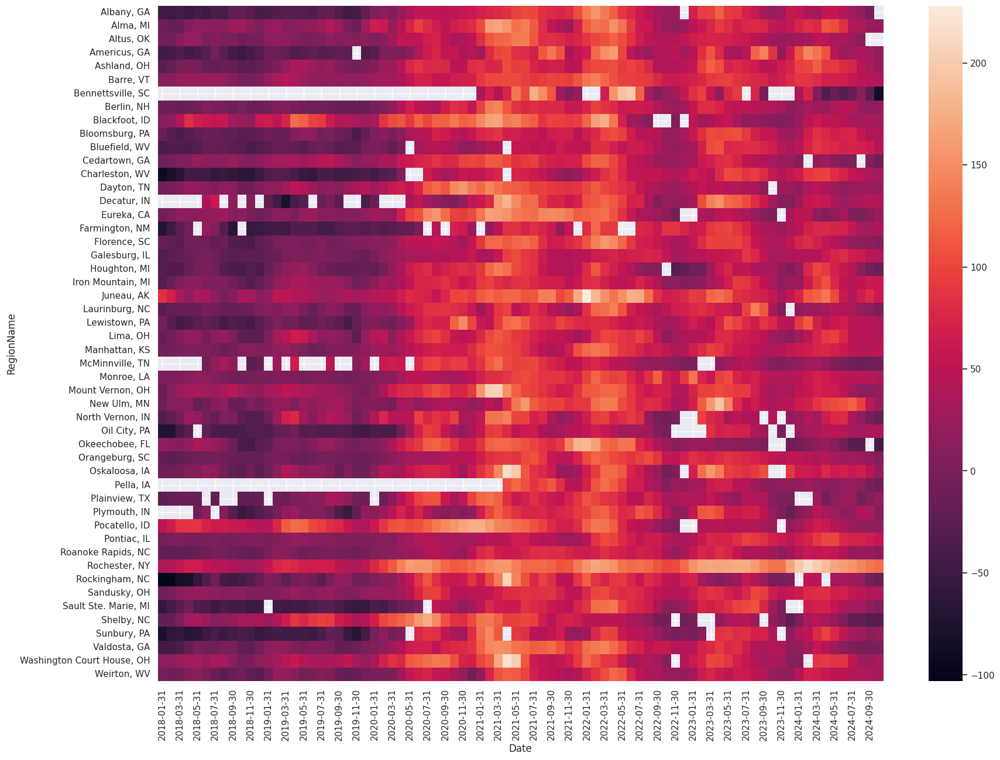

In [326]:
heatMapUnStableDF = UnstableHeatDF.pivot_table(index='RegionName', columns='Date', values='Temp')
plt.subplots(figsize=(20,15))
sns.heatmap(heatMapUnStableDF)

In [327]:
houseGrowthForecastDF.to_sql('StackedHF', sqliteConnection, if_exists='replace')

895

__Forcasted housing price increase of the most volatile regions__

<Axes: xlabel='RegionName'>

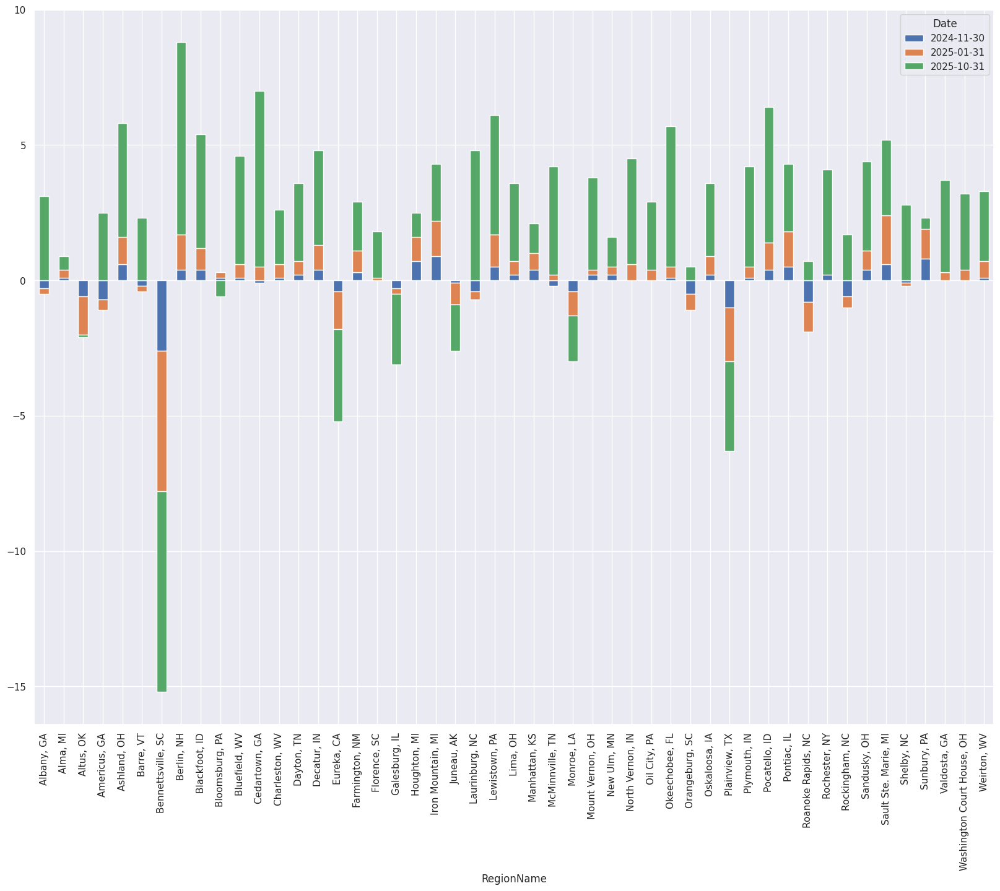

In [328]:
UnstableDFPivot = UnstableDF.pivot_table(index='RegionName', columns='Date', values='Growth')
UnstableDFPivot.plot(kind='bar', stacked=True, figsize=(20,15))

__Forcasted housing price increase of the most volatile regions__

<Axes: xlabel='RegionName'>

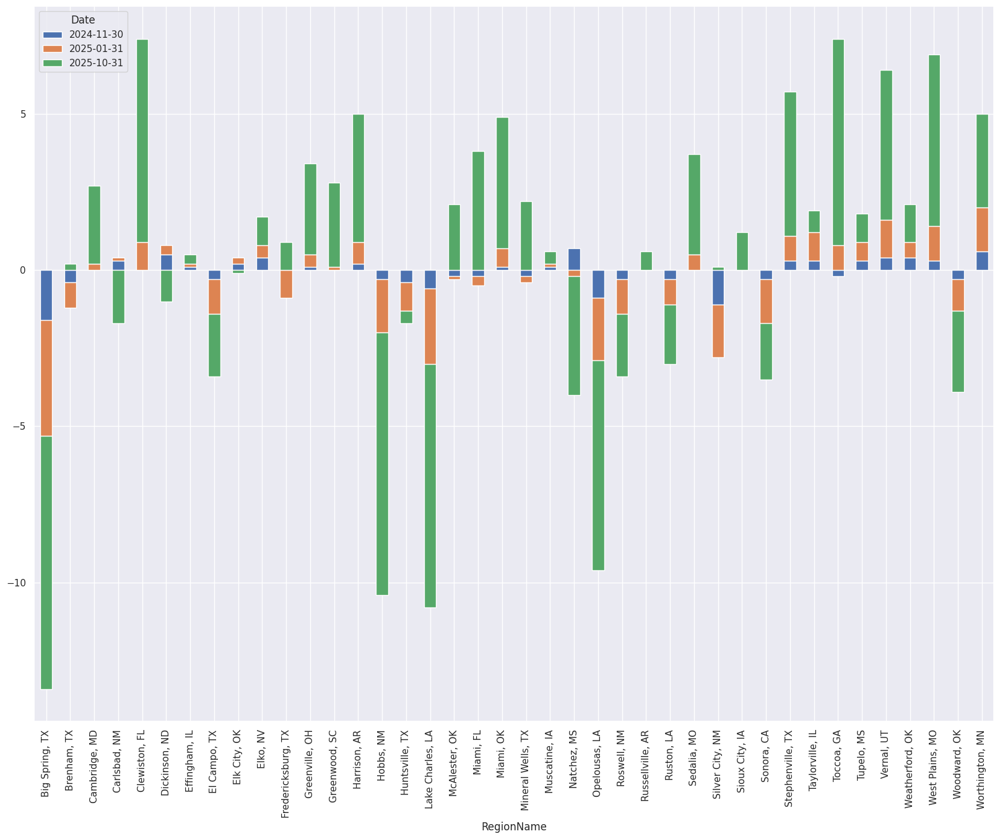

In [329]:
stableDFPivot = StableDF.pivot_table(index='RegionName', columns='Date', values='Growth')
stableDFPivot.plot(kind='bar', stacked=True, figsize=(20,15))

In [330]:
sqlite_select_query = """select SHF.RegionName, SHF."2024-11-30", SHF."2025-01-31", SHF."2025-10-31" from StackedHF SHF
Join HeatIndex HI on HI.RegionID = SHF.RegionID and HI.Date = SHF.BaseDate
JOIN Volatility V on V.RegionID = SHF.RegionID
Order By TEMP DESC, IQR ASC  Limit 50

"""


cursor.execute(sqlite_select_query)
records = cursor.fetchall()
stableHeatBuyersDF = pd.DataFrame(records, columns=['RegionName',  '2024-11-30', '2025-01-31', '2025-10-31' ])

stableHeatBuyersDF

,RegionName,2024-11-30,2025-01-31,2025-10-31
0,"Rochester, NY",0.2,0.0,3.9
1,"Mount Vernon, IL",0.3,1.3,-0.4
2,"La Crosse, WI",0.2,0.5,2.5
3,"Hartford, CT",0.3,0.7,4.2
4,"Cortland, NY",0.2,0.6,2.7
5,"Syracuse, NY",0.3,0.4,4.2
6,"Clarksdale, MS",0.1,-0.4,-4.6
7,"Batavia, NY",0.4,0.7,3.4
8,"San Jose, CA",0.2,-0.5,0.3
9,"Buffalo, NY",0.1,0.2,3.0


__Forcasted housing price increase of the least volatile regions that favors buyers__

<Axes: xlabel='RegionName'>

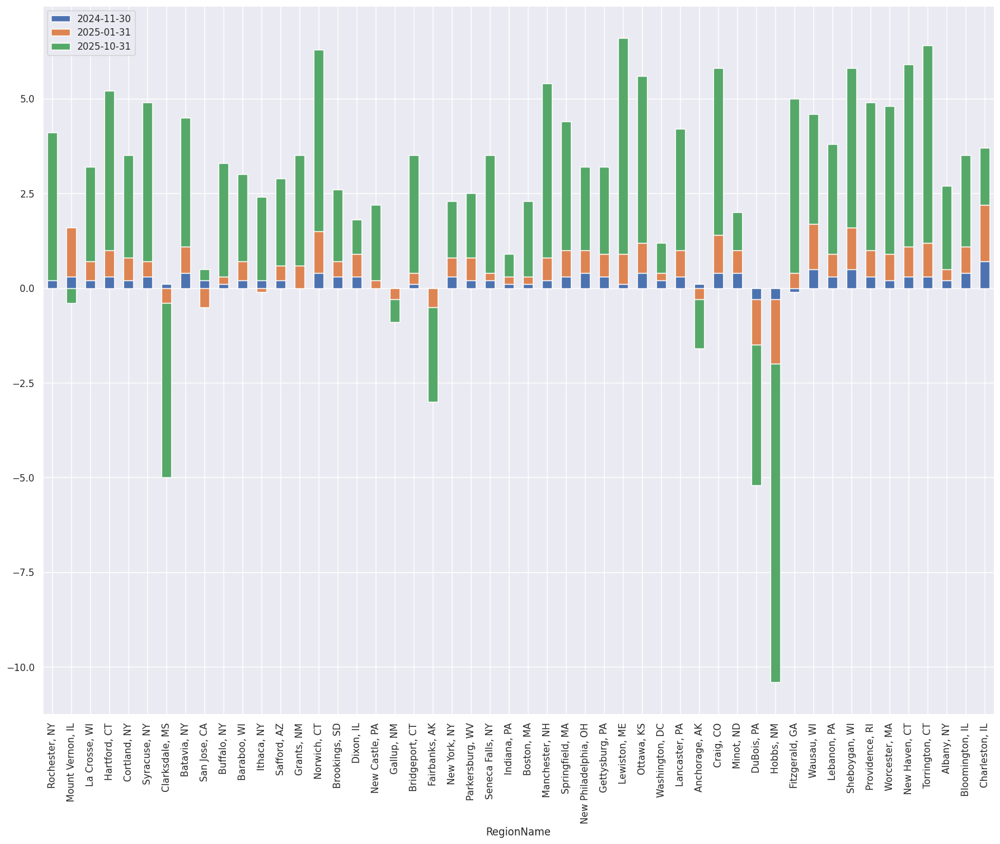

In [331]:
stableHeatBuyersDF.plot(kind='bar', stacked=True, figsize=(20,15), x='RegionName')

__Forcasted housing price increase of the least volatile regions that favors buyers__

<Axes: xlabel='RegionName'>

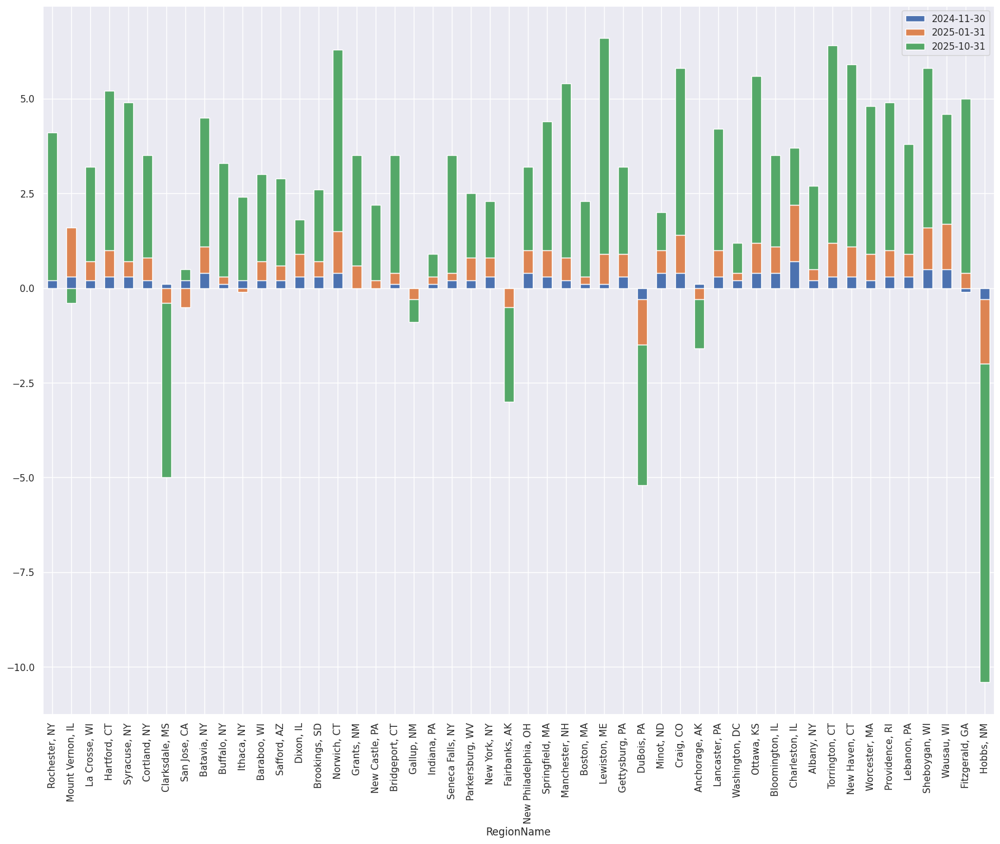

In [332]:
sqlite_select_query = """select SHF.RegionName, SHF."2024-11-30", SHF."2025-01-31", SHF."2025-10-31" from StackedHF SHF
Join HeatIndex HI on HI.RegionID = SHF.RegionID and HI.Date = SHF.BaseDate
JOIN Volatility V on V.RegionID = SHF.RegionID
Order By TEMP DESC, IQR DESC  Limit 50


"""


cursor.execute(sqlite_select_query)
records = cursor.fetchall()
unstableHeatBuyersDF = pd.DataFrame(records, columns=['RegionName',  '2024-11-30', '2025-01-31', '2025-10-31' ])

unstableHeatBuyersDF.plot(kind='bar', stacked=True, figsize=(20,15), x='RegionName')


__Forcasted housing price increase of the least volatile regions that favors sellers__

<Axes: xlabel='RegionName'>

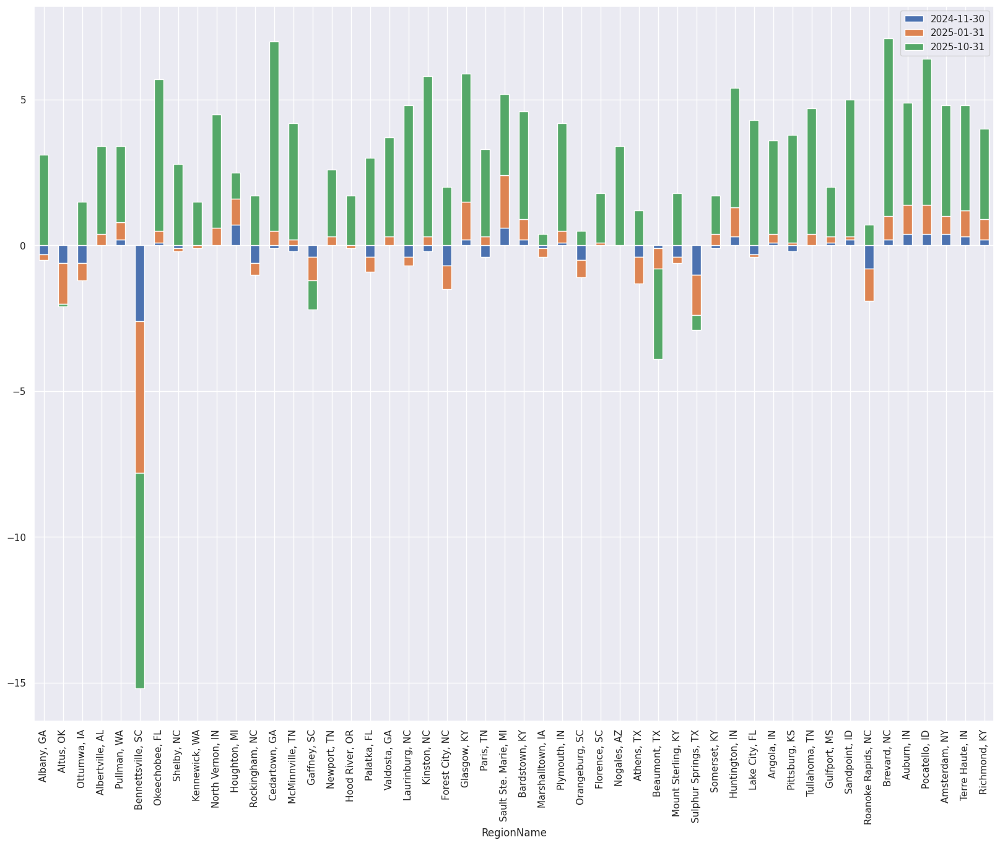

In [333]:
sqlite_select_query = """select SHF.RegionName, SHF."2024-11-30", SHF."2025-01-31", SHF."2025-10-31" from StackedHF SHF
Join HeatIndex HI on HI.RegionID = SHF.RegionID and HI.Date = SHF.BaseDate
JOIN Volatility V on V.RegionID = SHF.RegionID
Order By TEMP ASC, IQR DESC  Limit 50


"""


cursor.execute(sqlite_select_query)
records = cursor.fetchall()
unstableHeatSellersDF = pd.DataFrame(records, columns=['RegionName',  '2024-11-30', '2025-01-31', '2025-10-31' ])

unstableHeatSellersDF.plot(kind='bar', stacked=True, figsize=(20,15), x='RegionName')

<Axes: xlabel='RegionName'>

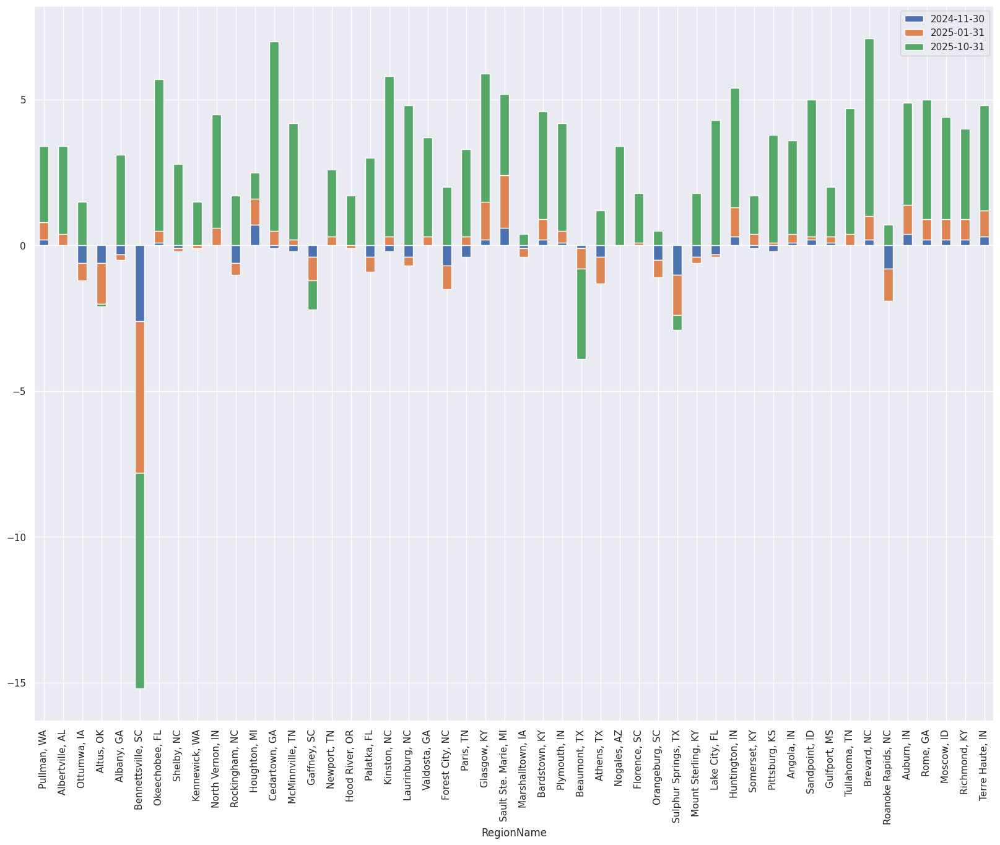

In [334]:
sqlite_select_query = """select SHF.RegionName, SHF."2024-11-30", SHF."2025-01-31", SHF."2025-10-31" from StackedHF SHF
Join HeatIndex HI on HI.RegionID = SHF.RegionID and HI.Date = SHF.BaseDate
JOIN Volatility V on V.RegionID = SHF.RegionID
Order By TEMP ASC, IQR ASC  Limit 50


"""


cursor.execute(sqlite_select_query)
records = cursor.fetchall()
unstableHeatSellersDF = pd.DataFrame(records, columns=['RegionName',  '2024-11-30', '2025-01-31', '2025-10-31' ])

unstableHeatSellersDF.plot(kind='bar', stacked=True, figsize=(20,15), x='RegionName')

__Regions with the highest growth potentional overall__

<Axes: xlabel='RegionName'>

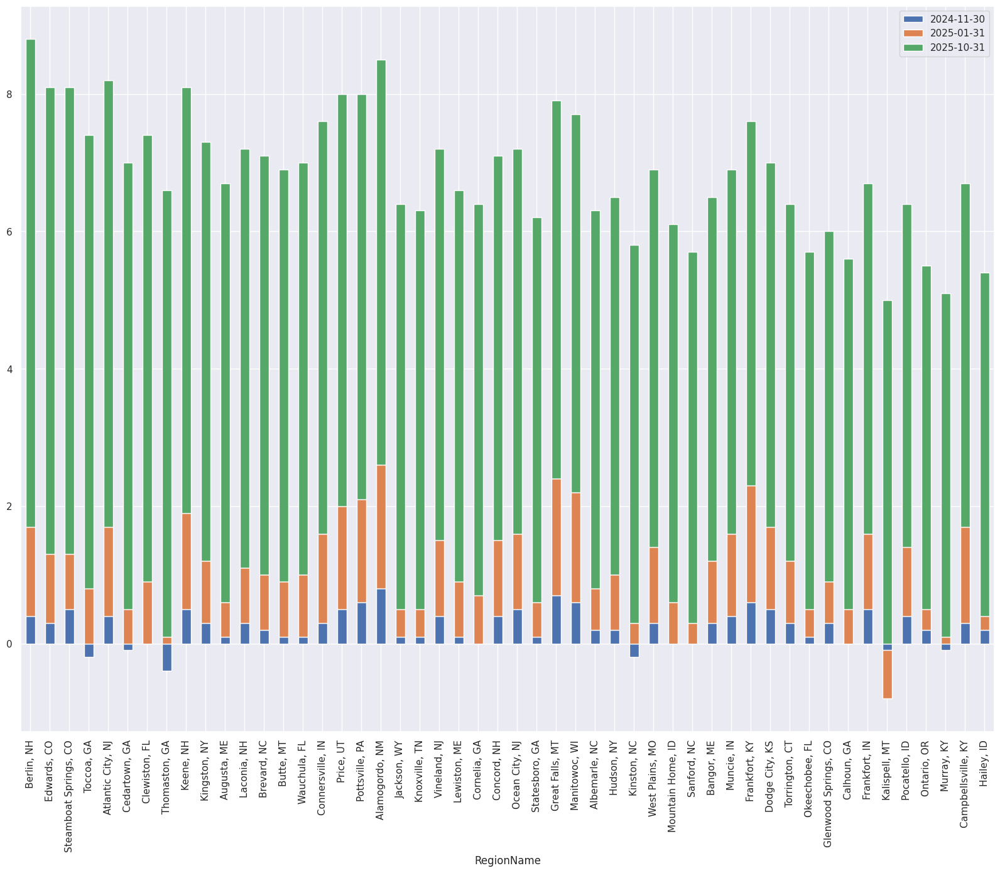

In [335]:
sqlite_select_query = """select SHF.RegionName, SHF."2024-11-30", SHF."2025-01-31", SHF."2025-10-31" from StackedHF SHF
Order By
"2025-10-31" DESC Limit 50


"""


cursor.execute(sqlite_select_query)
records = cursor.fetchall()
highGrowthDF = pd.DataFrame(records, columns=['RegionName',  '2024-11-30', '2025-01-31', '2025-10-31' ])

highGrowthDF.plot(kind='bar', stacked=True, figsize=(20,15), x='RegionName')

In [336]:
shared = unstableHeatBuyersDF[unstableHeatBuyersDF['RegionName'].isin(highGrowthDF['RegionName'])]
shared

,RegionName,2024-11-30,2025-01-31,2025-10-31
29,"Lewiston, ME",0.1,0.8,5.7
41,"Torrington, CT",0.3,0.9,5.2


Overall the markets are currently favoring buyers and there are several regions within the US that have the potential to to give you a profit if it's sold after a year. The more volitle markets are more likely to change to a sellers favored market within the next few years and are a better to invest if you plan on reinvesting after the inital investment. The top two regions that are volatile and have high growth potential are Lewiston, ME and Torrington, CT

### 4. Market Time for Real Estate
How long some of the real-estate stays on the market before they rent or sell?

__Dataset used:__

Mean Days to Pending(Smooth,All Homes,Monthly):-

    It contains data on how long it takes homes in a region to change to pending status on Zillow.com after     first being shown as for sale. The reported figure indicates the number of days(mean) that it took for homes that went pending during the week being reported, to go pending.
    
Mean Days to Close(Smooth,All Homes,Monthly):-

    It contains data on the number of days(mean) between the listing going pending and the sale date.


Text(0.5, 1.0, 'Avg Number of Days from "For Sale" to "Pending" in the US')

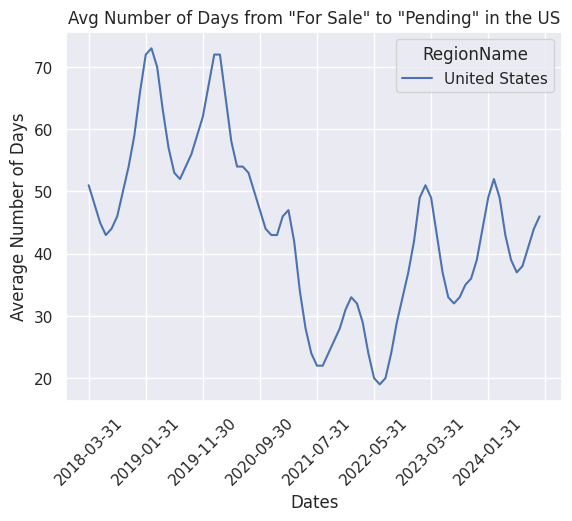

In [337]:
# Loading data for ForSale to Pending

forSaleToPending = pd.read_csv('Metro_mean_doz_pending_uc_sfrcondo_sm_month.csv')

# Getting only US Data
US = forSaleToPending['RegionName'] == "United States"
USOnly = forSaleToPending.loc[US]
USOnly = USOnly.set_index('RegionName')

# Removing unwanted columns
USData = USOnly.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName'])
USData

# Graph
USDataT = USData.T
plot = USDataT.plot.line()
plot.tick_params(axis='x', labelrotation=45)
plot.set_xlabel('Dates')
plot.set_ylabel('Average Number of Days')
plot.set_title('Avg Number of Days from "For Sale" to "Pending" in the US')

__Average days to move from "For Sale" to "Pending" for United States__

Around 20 to 70 days in average

Text(0.5, 1.0, 'Avg Number of Days from "Pending" to "Close" in the US')

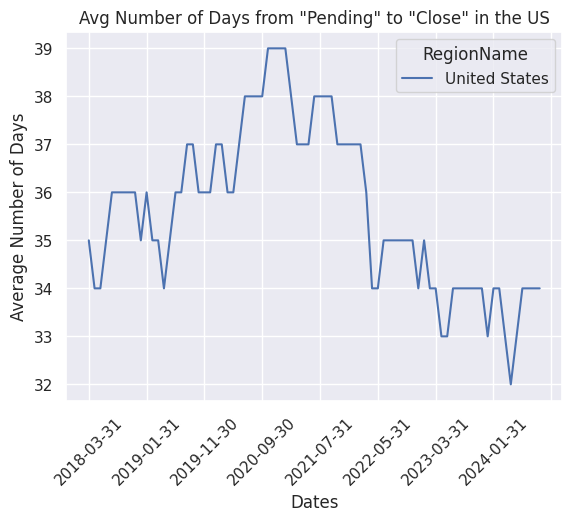

In [338]:
# Loading data for Pending to close
pendingToClose = pd.read_csv('Metro_mean_days_to_close_uc_sfrcondo_sm_month.csv')

# Getting only US data
US = pendingToClose['RegionName'] == "United States"
USOnly = pendingToClose.loc[US]
USOnly = USOnly.set_index('RegionName')

# Removing unwanted columns
USData = USOnly.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName'])

# Graph
USDataT = USData.T
plot = USDataT.plot.line()
plot.tick_params(axis='x', labelrotation=45)
plot.set_xlabel('Dates')
plot.set_ylabel('Average Number of Days')
plot.set_title('Avg Number of Days from "Pending" to "Close" in the US')

__Average days to move from "Pending" to "Close" in United States__

Around 32 to 39 days in average



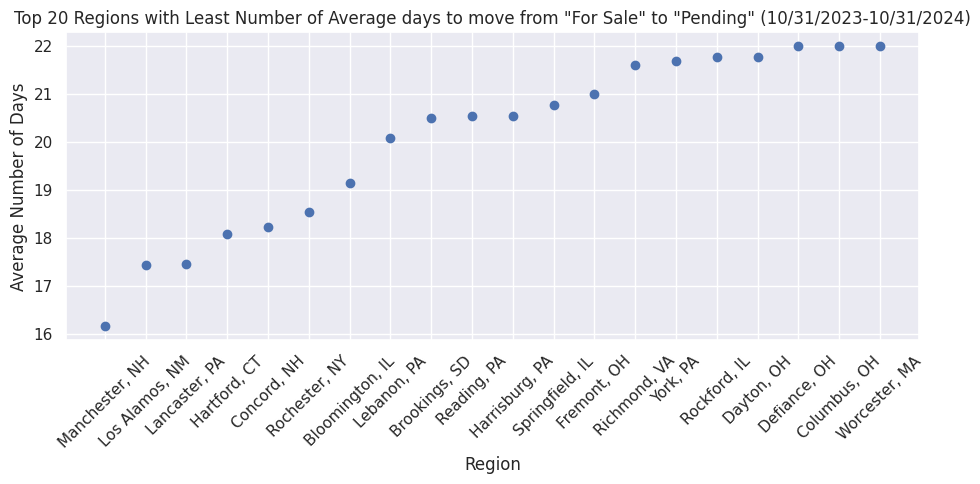

In [339]:
# Calculate the average days it take for a listing to get to pending status in each region
# in the last one year from 2023-10-31 to 2024-10-31

forSaleToPending['AverageDaysForSaleToPending'] = np.nanmean(forSaleToPending[['2023-10-31', '2023-11-30', '2023-12-31', '2024-01-31', '2024-02-29','2024-03-31','2024-04-30', '2024-05-31','2024-06-30','2024-07-31','2024-08-31','2024-09-30', '2024-10-31']], axis=1)

# Sorting the average days it takes for a house to move to pending status by ascending order (least time)

sortedForSalesToPending = forSaleToPending.sort_values(['AverageDaysForSaleToPending'], ascending = [True])
sortedForSalesToPending

# Graph
plt.subplots(figsize=(11,4))
plt.scatter(sortedForSalesToPending.RegionName[:20],sortedForSalesToPending.AverageDaysForSaleToPending[:20])
plt.xticks(rotation = 45)
plt.title('Top 20 Regions with Least Number of Average days to move from "For Sale" to "Pending" (10/31/2023-10/31/2024)')
plt.xlabel('Region')
plt.ylabel('Average Number of Days')
plt.show()

__According to the above scatter plot, Listed below are the top 20 US market where single family homes and condos took the least number of days in average to move from "For sale" to "Pending" in the last one year from 2023-10-31 to 2024-10-31 :__

1. Manchester, NH
2. Los Alamos, NM
3. Lancaster, PA
4. Hartford, CT
5. Concord, NH
6. Rochester, NY
7. Bloomington, IL
8. Lebanon, PA
9. Brookings,SD
10. Reading, PA
11. Harrisburg, PA
12. Springfield, IL
13. Fremont, OH
14. Richmond, VA
15. York, PA
16. Rockford,IL
17. Dayton, OH
18. Defiance,OH
19. Columbus, OH
20. Worcester, MA

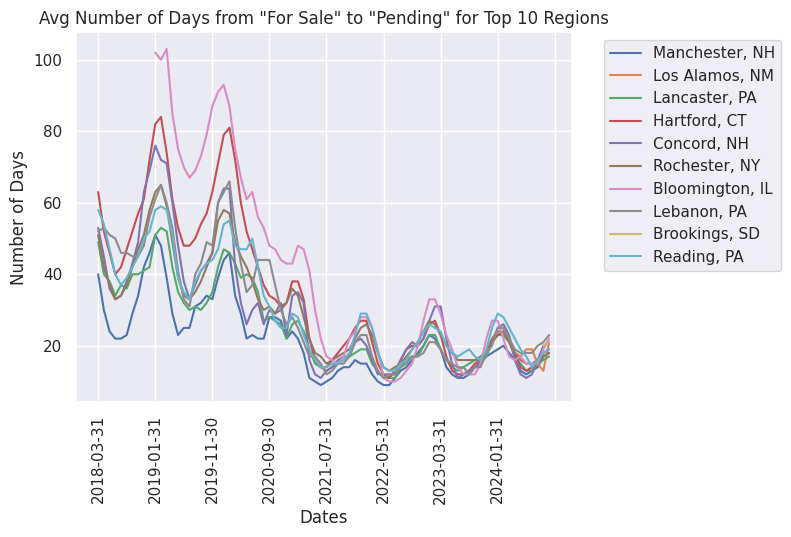

In [340]:
# Looking at the trend of averages throughout the years for top 10 places.

forSaleToPendingTop10 = sortedForSalesToPending.iloc[0:10]
forSaleToPendingTop10
Top10 = forSaleToPendingTop10.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName','AverageDaysForSaleToPending'])
Top10 = Top10.set_index('RegionName')
TTop10 = Top10.T
plot = TTop10.plot.line()
plot.tick_params(axis='x', labelrotation=90)
plot.set_xlabel('Dates')
plot.set_ylabel('Number of Days')
plot.set_title('Avg Number of Days from "For Sale" to "Pending" for Top 10 Regions')
plot.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

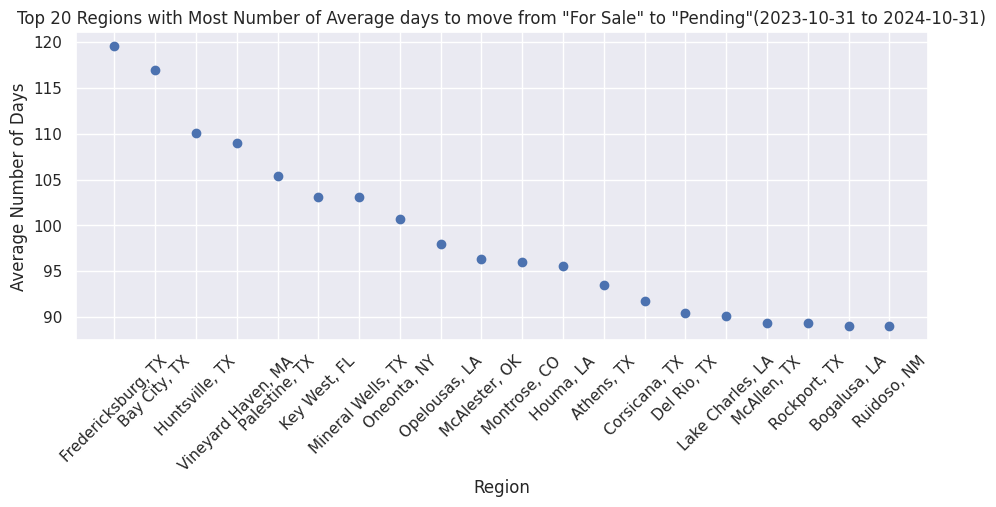

In [341]:
descSortedForSaleToPending = forSaleToPending.sort_values(['AverageDaysForSaleToPending'], ascending = [False])

# Getting the Bottom 20 regions as well

bottom20_descSortedForSaleToPending= descSortedForSaleToPending.head(20)

# Graph

plt.subplots(figsize=(11,4))
plt.scatter(bottom20_descSortedForSaleToPending['RegionName'],bottom20_descSortedForSaleToPending['AverageDaysForSaleToPending'])
plt.xticks(rotation = 45)
plt.title('Top 20 Regions with Most Number of Average days to move from "For Sale" to "Pending"(2023-10-31 to 2024-10-31)')
plt.xlabel('Region')
plt.ylabel('Average Number of Days')
plt.show()

__According to the above scatter plot, Listed below are the bottom 20 US market where single family homes and condos took the most number of days in average to move from "For sale" to "Pending" in the last one year from 2023-10-31 to 2024-10-31 :__

1. Fredericksburg, TX
2. Bay City, TX
3. Huntsville, TX
4. Vineyard Haven, MA
5. Palestine, TX
6. Key West, FL
7. Mineral Wells, TX
8. Oneonta, NY
9. Opelousas, LA
10. McAlester, OK
11. Montrose, CO
12. Houma, LA
13. Athens, TX
14. Corsicana, TX
15. Del Rio, TX
16. Lake Charles, LA
17. McAllen, TX
18. Rockport, TX
19. Bogalusa, LA
20. Ruidoso, NM

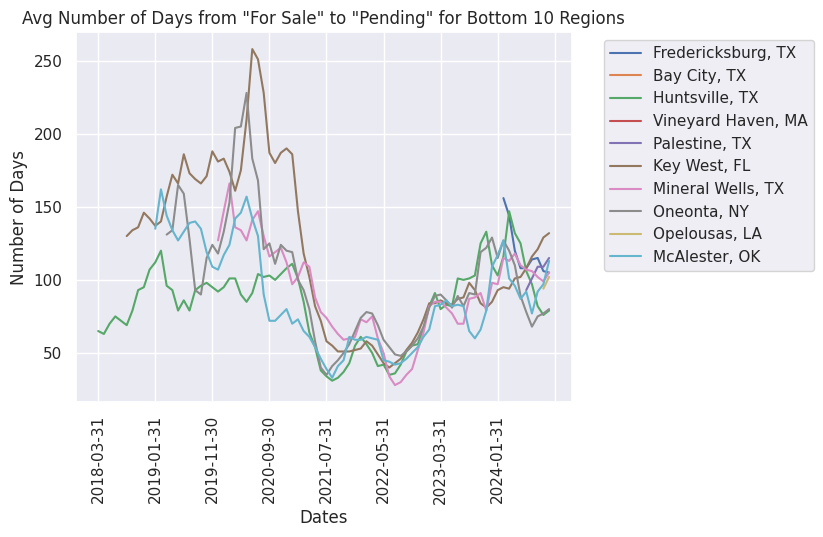

In [342]:
# Looking at the trend of averages throughout the years for bottom 10 places.

forSaleToPendingBottom10 = descSortedForSaleToPending.iloc[0:10]
forSaleToPendingBottom10
Bottom10 = forSaleToPendingBottom10.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName','AverageDaysForSaleToPending'])
Bottom10 = Bottom10.set_index('RegionName')
TBottom10 = Bottom10.T
plot = TBottom10.plot.line()
plot.tick_params(axis='x', labelrotation=90)
plot.set_xlabel('Dates')
plot.set_ylabel('Number of Days')
plot.set_title('Avg Number of Days from "For Sale" to "Pending" for Bottom 10 Regions')
plot.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

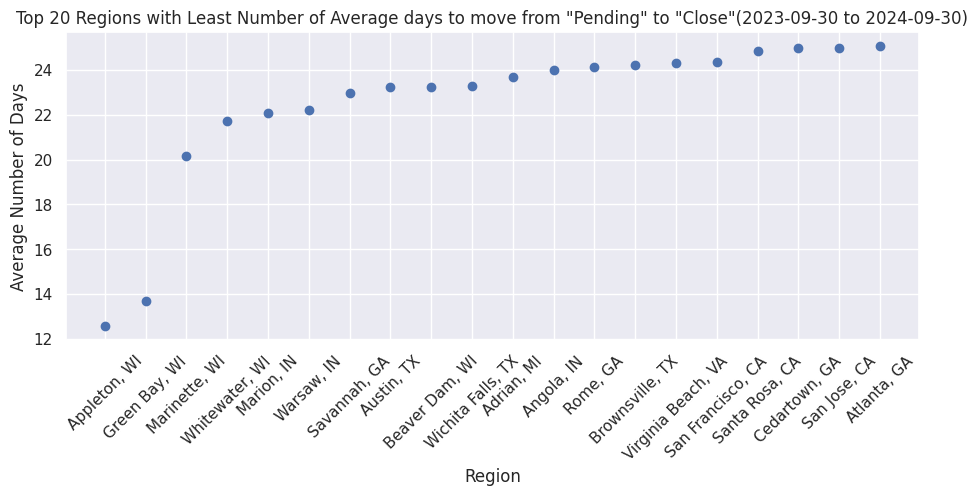

In [343]:
# Calculate the average days it take for a listing to get to Close from Pending in each region
# in the last one year from 2023-09-30 to 2024-09-30

pendingToClose['AverageDaysPendingToClose'] = np.nanmean(pendingToClose[['2023-09-30','2023-10-31','2023-11-30','2023-12-31','2024-01-31','2024-02-29','2024-03-31','2024-04-30','2024-05-31','2024-06-30','2024-07-31','2024-08-31','2024-09-30']], axis=1)

# Sorting the average days it takes for a house to move to pending status by ascending order (least time)

sortedPendingToClose = pendingToClose.sort_values(['AverageDaysPendingToClose'], ascending = [True])

# Graph

plt.subplots(figsize=(11,4))
plt.scatter(sortedPendingToClose.RegionName[:20],sortedPendingToClose.AverageDaysPendingToClose[:20])
plt.xticks(rotation = 45)
plt.title('Top 20 Regions with Least Number of Average days to move from "Pending" to "Close"(2023-09-30 to 2024-09-30)')
plt.xlabel('Region')
plt.ylabel('Average Number of Days')
plt.show()

__According to the above scatter plot, Listed below are the top 20 US market where single family homes and condos took the least average days to move from "Pending" to "Close" in the last one year from 2023-09-30 to 2024-09-30 :__
1. Appleton,WI
2. Green Bay,WI
3. Marinette,WI
4. Whitewater,WI
5. Marion,IN
6. Warsaw,IN
7. Savannah,GA
8. Austin,TX
9. Beaver Dam,WI
10. Wichita Falls,TX
11. Adrian,MI
12. Angola,IN
13. Rome,GA
14. Brownsville,TX
15. Virginia Beach,VA
16. San Francisco,CA
17. Santa Rosa,CA
18. Cedartown,GA
19. San Jose,CA
20. Atlanta, GA

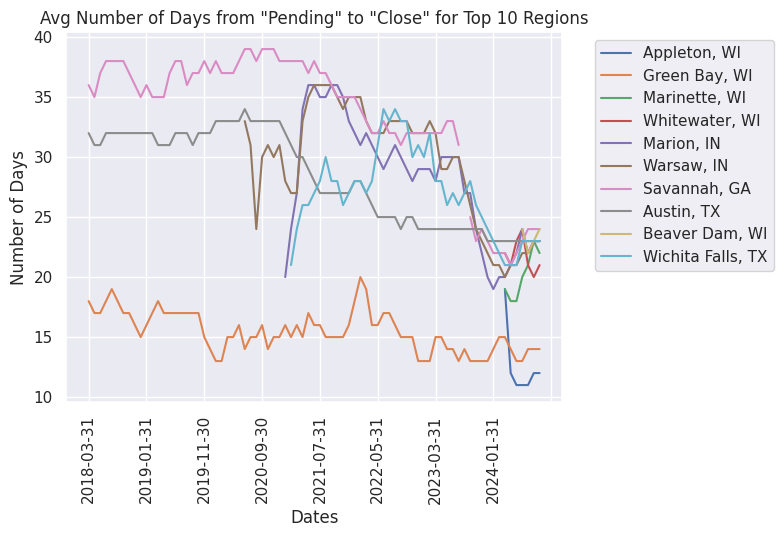

In [344]:
# Looking at the trend of averages throughout the years for top 10 places.

pendingToCloseTop10 = sortedPendingToClose.iloc[0:10]
pendingToCloseTop10
Top10 = pendingToCloseTop10.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName','AverageDaysPendingToClose'])
Top10 = Top10.set_index('RegionName')
TTop10 = Top10.T
plot = TTop10.plot.line()
plot.tick_params(axis='x', labelrotation=90)
plot.set_xlabel('Dates')
plot.set_ylabel('Number of Days')
plot.set_title('Avg Number of Days from "Pending" to "Close" for Top 10 Regions')
plot.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

### 5. Calculating Investment Returns (ROI)
How much average profit I could expect from my investments in terms of sale (% dollars) after paying mortgage. Calculate my ~ROI.

In [345]:
#read in the file file that has the current values of homes
filepath5 = "Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv"
valueData = pd.read_csv(filepath5)
valueData

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,121618.117906,121832.083163,122097.431586,122666.551870,123321.541083,...,351518.721971,352307.611057,353841.834013,355689.143658,357116.078246,357675.012344,357822.347127,358064.560426,358513.017685,359098.757006
1,394913,1,"New York, NY",msa,NY,216209.133034,217127.899860,218055.176122,219934.196642,221879.987460,...,636222.199812,640261.759998,645659.925232,651762.255593,656416.260742,659493.785408,662237.503625,665976.304121,669998.634470,673519.052950
2,753899,2,"Los Angeles, CA",msa,CA,220054.246992,220873.127993,221963.869677,224134.079222,226507.608099,...,918152.699842,915212.200707,914100.045351,917555.375306,923429.357719,927370.843139,931734.333222,936905.038981,943310.514820,948517.694617
3,394463,3,"Chicago, IL",msa,IL,152313.404618,152454.402460,152722.935334,153390.978391,154194.553834,...,309242.532032,310621.674151,313019.037704,315872.731458,317979.880350,319195.707171,319927.287910,320843.743524,321841.084746,322812.993795
4,394514,4,"Dallas, TX",msa,TX,124931.823275,124987.468346,125051.438051,125217.560655,125436.588761,...,368653.283687,369131.167377,370278.543600,371238.456044,371380.958812,370722.650770,369792.633169,369147.346536,368951.387387,368846.512185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890,753929,935,"Zapata, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,125008.677583,124153.313389,124277.676391,125831.848783,127594.450637,128716.690246,128933.920475,128590.245500,127961.858254,127085.947769
891,394743,936,"Ketchikan, AK",msa,AK,NaN,NaN,NaN,NaN,NaN,...,379357.281465,379475.577182,381150.269532,382647.123810,383751.533356,383819.615546,383065.410420,383015.544053,384321.822255,386202.654941
892,753874,937,"Craig, CO",msa,CO,98138.246235,98389.192594,98856.388976,99521.719777,100294.879714,...,282600.733806,282532.302880,282992.307275,283767.943843,284664.758836,285001.864473,285323.298466,285550.191983,286901.985830,288588.402340
893,395188,938,"Vernon, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,91330.080574,91380.673082,92040.860070,92785.619105,93439.205920,93703.278159,93499.558466,93013.577818,91740.713452,90136.363348


In [346]:
#display the first 5 values in the valueData dataframe
valueData.head(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,121618.117906,121832.083163,122097.431586,122666.551870,123321.541083,...,351518.721971,352307.611057,353841.834013,355689.143658,357116.078246,357675.012344,357822.347127,358064.560426,358513.017685,359098.757006
1,394913,1,"New York, NY",msa,NY,216209.133034,217127.899860,218055.176122,219934.196642,221879.987460,...,636222.199812,640261.759998,645659.925232,651762.255593,656416.260742,659493.785408,662237.503625,665976.304121,669998.634470,673519.052950
2,753899,2,"Los Angeles, CA",msa,CA,220054.246992,220873.127993,221963.869677,224134.079222,226507.608099,...,918152.699842,915212.200707,914100.045351,917555.375306,923429.357719,927370.843139,931734.333222,936905.038981,943310.514820,948517.694617
3,394463,3,"Chicago, IL",msa,IL,152313.404618,152454.402460,152722.935334,153390.978391,154194.553834,...,309242.532032,310621.674151,313019.037704,315872.731458,317979.880350,319195.707171,319927.287910,320843.743524,321841.084746,322812.993795
4,394514,4,"Dallas, TX",msa,TX,124931.823275,124987.468346,125051.438051,125217.560655,125436.588761,...,368653.283687,369131.167377,370278.543600,371238.456044,371380.958812,370722.650770,369792.633169,369147.346536,368951.387387,368846.512185


In [347]:
#display the last five values in the valueData dataframe
valueData.tail(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
890,753929,935,"Zapata, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,125008.677583,124153.313389,124277.676391,125831.848783,127594.450637,128716.690246,128933.920475,128590.245500,127961.858254,127085.947769
891,394743,936,"Ketchikan, AK",msa,AK,NaN,NaN,NaN,NaN,NaN,...,379357.281465,379475.577182,381150.269532,382647.123810,383751.533356,383819.615546,383065.410420,383015.544053,384321.822255,386202.654941
892,753874,937,"Craig, CO",msa,CO,98138.246235,98389.192594,98856.388976,99521.719777,100294.879714,...,282600.733806,282532.302880,282992.307275,283767.943843,284664.758836,285001.864473,285323.298466,285550.191983,286901.985830,288588.402340
893,395188,938,"Vernon, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,91330.080574,91380.673082,92040.860070,92785.619105,93439.205920,93703.278159,93499.558466,93013.577818,91740.713452,90136.363348
894,394767,939,"Lamesa, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,88533.691061,87425.670561,87478.504565,87697.973643,88621.907185,89908.543510,91732.662275,93362.813839,94070.017585,94079.655826


In [348]:
#display the variable types of the variables in the valueData dataframe
valueData.dtypes

,0
RegionID,int64
SizeRank,int64
RegionName,object
RegionType,object
StateName,object
...,...
2024-06-30,float64
2024-07-31,float64
2024-08-31,float64
2024-09-30,float64


__Here we only use home values and prices that date back to the beginning of 2024. Home values appreciate and depreciate so frequently that utilizing too much data could provide analysis that may not necessarily be correct. For example, the Covid-19 pandemic triggered extreme growth. Utilizing data dated before then may bring home values down too far (Housing prices and inflation 2021).__

In [349]:
#Select the region name, region type, and state name columns. It also keeps all columns from 2024 to filter only more current data
#display the first five columns to confirm that this is working properly
keep_columns = ['RegionName', 'RegionType', 'StateName'] + [col for col in valueData.columns if col.startswith('2024')]
cleanedData = valueData[keep_columns]
cleanedData.head(5)

,RegionName,RegionType,StateName,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,United States,country,NaN,351518.721971,352307.611057,353841.834013,355689.143658,357116.078246,357675.012344,357822.347127,358064.560426,358513.017685,359098.757006
1,"New York, NY",msa,NY,636222.199812,640261.759998,645659.925232,651762.255593,656416.260742,659493.785408,662237.503625,665976.304121,669998.634470,673519.052950
2,"Los Angeles, CA",msa,CA,918152.699842,915212.200707,914100.045351,917555.375306,923429.357719,927370.843139,931734.333222,936905.038981,943310.514820,948517.694617
3,"Chicago, IL",msa,IL,309242.532032,310621.674151,313019.037704,315872.731458,317979.880350,319195.707171,319927.287910,320843.743524,321841.084746,322812.993795
4,"Dallas, TX",msa,TX,368653.283687,369131.167377,370278.543600,371238.456044,371380.958812,370722.650770,369792.633169,369147.346536,368951.387387,368846.512185


In [350]:
#display the number of rows and columns of the cleanedData dataframe
cleanedData.shape

(895, 13)

In [351]:
#determine if there are any duplicate rows
uniqueRows = cleanedData[valueData.duplicated()]
print('number of duplicate rows: ', uniqueRows.shape)

number of duplicate rows:  (0, 13)


In [352]:
#delete any duplicates if they appeared previously
finalData = cleanedData.drop_duplicates()
finalData.head()

,RegionName,RegionType,StateName,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,United States,country,NaN,351518.721971,352307.611057,353841.834013,355689.143658,357116.078246,357675.012344,357822.347127,358064.560426,358513.017685,359098.757006
1,"New York, NY",msa,NY,636222.199812,640261.759998,645659.925232,651762.255593,656416.260742,659493.785408,662237.503625,665976.304121,669998.634470,673519.052950
2,"Los Angeles, CA",msa,CA,918152.699842,915212.200707,914100.045351,917555.375306,923429.357719,927370.843139,931734.333222,936905.038981,943310.514820,948517.694617
3,"Chicago, IL",msa,IL,309242.532032,310621.674151,313019.037704,315872.731458,317979.880350,319195.707171,319927.287910,320843.743524,321841.084746,322812.993795
4,"Dallas, TX",msa,TX,368653.283687,369131.167377,370278.543600,371238.456044,371380.958812,370722.650770,369792.633169,369147.346536,368951.387387,368846.512185


In [353]:
#determine if there are any missing values in the dataframe
print(finalData.isnull().sum())

RegionName    0
RegionType    0
StateName     1
2024-01-31    0
2024-02-29    0
2024-03-31    0
2024-04-30    0
2024-05-31    0
2024-06-30    0
2024-07-31    0
2024-08-31    0
2024-09-30    0
2024-10-31    0
dtype: int64


In [354]:
#if any missing values were detected previously, remove them and display the counts to determine it worked properly
df = cleanedData.dropna()
cleanedData.count()

,0
RegionName,895
RegionType,895
StateName,894
2024-01-31,895
2024-02-29,895
2024-03-31,895
2024-04-30,895
2024-05-31,895
2024-06-30,895
2024-07-31,895


In [355]:
#confirm that only the columns with dates starting with the year 2024 have been selected
months = [col for col in df.columns if col.startswith('2024')]
display(months)

['2024-01-31',
 '2024-02-29',
 '2024-03-31',
 '2024-04-30',
 '2024-05-31',
 '2024-06-30',
 '2024-07-31',
 '2024-08-31',
 '2024-09-30',
 '2024-10-31']

In [356]:
#perform due diligence by making a copy of the cleaned data
cleanedData = cleanedData.copy()

In [357]:
#remove leading and trailing whitespace from the column names
valueData.columns = valueData.columns.str.strip()

In [358]:
#remove leading and trailing whitespace from the column names
cleanedData.columns = cleanedData.columns.str.strip()

In [359]:
#convert the column names to lowercase and display to confirm completion
valueData.columns = valueData.columns.str.strip().str.lower().str.replace(' ', '_')
display(valueData.columns)

Index(['regionid', 'sizerank', 'regionname', 'regiontype', 'statename',
       '2000-01-31', '2000-02-29', '2000-03-31', '2000-04-30', '2000-05-31',
       ...
       '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
       '2024-06-30', '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31'],
      dtype='object', length=303)

In [360]:
#convert the column names to lowercase and display to confirm completion
cleanedData.columns = cleanedData.columns.str.strip().str.lower().str.replace(' ', '_')
display(cleanedData.columns)

Index(['regionname', 'regiontype', 'statename', '2024-01-31', '2024-02-29',
       '2024-03-31', '2024-04-30', '2024-05-31', '2024-06-30', '2024-07-31',
       '2024-08-31', '2024-09-30', '2024-10-31'],
      dtype='object')

In [361]:
#read in the file file that has the current mean prices of homes
filepath6 = 'Metro_mean_sale_price_uc_sfrcondo_sm_month.csv'
datavalue = pd.read_csv(filepath6)
datavalue.head(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30
0,102001,0,United States,country,NaN,251455.0,253712.0,256922.0,258486.0,257098.0,...,443759.0,441936.0,445588.0,457090.0,472195.0,486185.0,495977.0,496981.0,493103.0,485595.0
1,394913,1,"New York, NY",msa,NY,550305.0,549949.0,550634.0,554987.0,557141.0,...,726560.0,736413.0,741812.0,750061.0,762536.0,784532.0,809795.0,826209.0,832530.0,818757.0
2,753899,2,"Los Angeles, CA",msa,CA,615433.0,600858.0,591498.0,571643.0,553650.0,...,1159720.0,1151565.0,1158282.0,1183849.0,1216523.0,1241182.0,1257280.0,1257322.0,1234694.0,1218743.0
3,394463,3,"Chicago, IL",msa,IL,282231.0,281783.0,285737.0,291169.0,295293.0,...,348622.0,348688.0,348303.0,356524.0,372402.0,390467.0,407890.0,416314.0,416984.0,406614.0
4,394514,4,"Dallas, TX",msa,TX,196109.0,202593.0,206204.0,208878.0,206393.0,...,474533.0,471024.0,472789.0,480530.0,494235.0,509445.0,511801.0,513327.0,501804.0,492785.0


In [362]:
#Select the region name, region type, and state name columns. It also keeps all columns from 2024 to filter only more current data
#display the first five columns to confirm that this is working properly
keep_columns = ['RegionName', 'RegionType', 'StateName'] + [col for col in datavalue.columns if col.startswith('2024')]
newData = datavalue[keep_columns]
newData.head(5)

,RegionName,RegionType,StateName,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30
0,United States,country,NaN,441936.0,445588.0,457090.0,472195.0,486185.0,495977.0,496981.0,493103.0,485595.0
1,"New York, NY",msa,NY,736413.0,741812.0,750061.0,762536.0,784532.0,809795.0,826209.0,832530.0,818757.0
2,"Los Angeles, CA",msa,CA,1151565.0,1158282.0,1183849.0,1216523.0,1241182.0,1257280.0,1257322.0,1234694.0,1218743.0
3,"Chicago, IL",msa,IL,348688.0,348303.0,356524.0,372402.0,390467.0,407890.0,416314.0,416984.0,406614.0
4,"Dallas, TX",msa,TX,471024.0,472789.0,480530.0,494235.0,509445.0,511801.0,513327.0,501804.0,492785.0


In [363]:
#display the count of all the rows
newData.count()

,0
RegionName,724
RegionType,724
StateName,723
2024-01-31,656
2024-02-29,676
2024-03-31,702
2024-04-30,711
2024-05-31,714
2024-06-30,714
2024-07-31,717


In [364]:
#determine if any rows contain missing values in the dataframe of prices
print(newData.isnull().sum())

RegionName     0
RegionType     0
StateName      1
2024-01-31    68
2024-02-29    48
2024-03-31    22
2024-04-30    13
2024-05-31    10
2024-06-30    10
2024-07-31     7
2024-08-31     4
2024-09-30     0
dtype: int64


In [365]:
#determine if any rows contain missing values in the dataframe of values
print(finalData.isnull().sum())

RegionName    0
RegionType    0
StateName     1
2024-01-31    0
2024-02-29    0
2024-03-31    0
2024-04-30    0
2024-05-31    0
2024-06-30    0
2024-07-31    0
2024-08-31    0
2024-09-30    0
2024-10-31    0
dtype: int64


In [366]:
#drop any rows that contain missing values in the prices dataframe and print to display completion
dropvalue = newData.dropna()
newData.count()

,0
RegionName,724
RegionType,724
StateName,723
2024-01-31,656
2024-02-29,676
2024-03-31,702
2024-04-30,711
2024-05-31,714
2024-06-30,714
2024-07-31,717


In [367]:
#drop any rows that contain missing values in the values dataframe and print to display completion
dropped = finalData.dropna()
dropped.count()

,0
RegionName,894
RegionType,894
StateName,894
2024-01-31,894
2024-02-29,894
2024-03-31,894
2024-04-30,894
2024-05-31,894
2024-06-30,894
2024-07-31,894


In [368]:
#set the first to columns to be named RegionName and StateName respectively in the prices dataframe
newData.set_index(['RegionName', 'StateName'], inplace=True)

In [369]:
#set the first to columns to be named RegionName and StateName respectively in the values dataframe
finalData.set_index(['RegionName', 'StateName'], inplace=True)
finalData

,,RegionType,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
RegionName,StateName,,,,,,,,,,,
United States,NaN,country,351518.721971,352307.611057,353841.834013,355689.143658,357116.078246,357675.012344,357822.347127,358064.560426,358513.017685,359098.757006
"New York, NY",NY,msa,636222.199812,640261.759998,645659.925232,651762.255593,656416.260742,659493.785408,662237.503625,665976.304121,669998.634470,673519.052950
"Los Angeles, CA",CA,msa,918152.699842,915212.200707,914100.045351,917555.375306,923429.357719,927370.843139,931734.333222,936905.038981,943310.514820,948517.694617
"Chicago, IL",IL,msa,309242.532032,310621.674151,313019.037704,315872.731458,317979.880350,319195.707171,319927.287910,320843.743524,321841.084746,322812.993795
"Dallas, TX",TX,msa,368653.283687,369131.167377,370278.543600,371238.456044,371380.958812,370722.650770,369792.633169,369147.346536,368951.387387,368846.512185
...,...,...,...,...,...,...,...,...,...,...,...,...
"Zapata, TX",TX,msa,125008.677583,124153.313389,124277.676391,125831.848783,127594.450637,128716.690246,128933.920475,128590.245500,127961.858254,127085.947769
"Ketchikan, AK",AK,msa,379357.281465,379475.577182,381150.269532,382647.123810,383751.533356,383819.615546,383065.410420,383015.544053,384321.822255,386202.654941
"Craig, CO",CO,msa,282600.733806,282532.302880,282992.307275,283767.943843,284664.758836,285001.864473,285323.298466,285550.191983,286901.985830,288588.402340


In [370]:
#rename the dataframe to be prices for clarity
prices = newData.stack().reset_index()

In [371]:
#rename the dataframe to be valuess for clarity
values = finalData.stack().reset_index()

In [372]:
prices = prices.reset_index()

In [373]:
#rename the columns for clarity
prices.columns = ['Index', 'Area', 'State', 'Date', 'Price']

In [374]:
#rename the columns for clarity
values.columns = ['Area', 'State', 'Date', 'Price']

In [375]:
prices = prices.drop(columns=['Index'])
prices.columns = ['Area', 'State', 'Date', 'Price']
prices.head()

,Area,State,Date,Price
0,United States,NaN,RegionType,country
1,United States,NaN,2024-01-31,441936.0
2,United States,NaN,2024-02-29,445588.0
3,United States,NaN,2024-03-31,457090.0
4,United States,NaN,2024-04-30,472195.0


In [376]:
#convert everything in the Date column to be a date object
prices['Date'] = pd.to_datetime(prices['Date'], format='%Y-%m-%d', errors='coerce')

In [377]:
#convert everything in the Date column to be a date object
values['Date'] = pd.to_datetime(values['Date'], format='%Y-%m-%d', errors='coerce')

In [378]:
#merge both the price and value dataframes into one dataframe to perform operations on
merged = pd.merge(values, prices, on=['Area', 'State'], how='inner')
merged

,Area,State,Date_x,Price_x,Date_y,Price_y
0,United States,NaN,NaT,country,NaT,country
1,United States,NaN,NaT,country,2024-01-31,441936.0
2,United States,NaN,NaT,country,2024-02-29,445588.0
3,United States,NaN,NaT,country,2024-03-31,457090.0
4,United States,NaN,NaT,country,2024-04-30,472195.0
...,...,...,...,...,...,...
76500,"Spirit Lake, IA",IA,2024-10-31,385213.239081,2024-05-31,533641.0
76501,"Spirit Lake, IA",IA,2024-10-31,385213.239081,2024-06-30,567311.0
76502,"Spirit Lake, IA",IA,2024-10-31,385213.239081,2024-07-31,706697.0
76503,"Spirit Lake, IA",IA,2024-10-31,385213.239081,2024-08-31,717532.0


In [379]:
#determine the average price of the home nationally
merged['Price_x'] = pd.to_numeric(merged['Price_x'], errors='coerce')
average_price_x = merged['Price_x'].mean()
print(average_price_x)

303467.74013154424


In [380]:
#determine the average value of the home nationally
merged['Price_y'] = pd.to_numeric(merged['Price_y'], errors='coerce')
average_price_y = merged['Price_y'].mean()
print(average_price_y)

355550.7792374239


In [381]:
#determine the national return on investment
merged['ROI'] = ((merged['Price_x'] - merged['Price_y'])/ merged['Price_y'])
print(merged)

                  Area State     Date_x        Price_x     Date_y   Price_y  \
0        United States   NaN        NaT            NaN        NaT       NaN   
1        United States   NaN        NaT            NaN 2024-01-31  441936.0   
2        United States   NaN        NaT            NaN 2024-02-29  445588.0   
3        United States   NaN        NaT            NaN 2024-03-31  457090.0   
4        United States   NaN        NaT            NaN 2024-04-30  472195.0   
...                ...   ...        ...            ...        ...       ...   
76500  Spirit Lake, IA    IA 2024-10-31  385213.239081 2024-05-31  533641.0   
76501  Spirit Lake, IA    IA 2024-10-31  385213.239081 2024-06-30  567311.0   
76502  Spirit Lake, IA    IA 2024-10-31  385213.239081 2024-07-31  706697.0   
76503  Spirit Lake, IA    IA 2024-10-31  385213.239081 2024-08-31  717532.0   
76504  Spirit Lake, IA    IA 2024-10-31  385213.239081 2024-09-30  751144.0   

            ROI  
0           NaN  
1           NaN

In [382]:
merged['ROI Dollars'] = (merged['ROI'] * merged['Price_y'])

In [383]:
averageDollars = merged.groupby('State')['ROI Dollars'].mean()
print(averageDollars)

State
AL    -43036.377245
AR    -40223.632505
AZ    -70629.173356
CA   -113300.177556
CO   -167336.570637
CT    -93191.941791
DE    -19461.319688
FL    -87780.602641
GA    -50017.542219
HI   -271299.058710
IA    -35339.520719
ID    -50366.222252
IL    -19508.883160
IN    -27684.940188
KS    -37794.076670
KY    -50172.828707
LA    -48568.591021
MA    -80418.132967
MD    -58937.594662
ME    -45142.184853
MI    -29086.814736
MN    -20636.729628
MO    -27987.856712
MS    -63905.589796
MT    -84319.066326
NC    -65752.037258
ND     -7920.323797
NE    -17526.251198
NH    -62884.923258
NJ    -48788.919788
NM    -75562.507493
NV    -85481.728637
NY    -37891.064817
OH     -4292.922130
OK    -42168.646389
OR    -51869.312910
PA    -14982.054447
RI    -52748.502143
SC    -88557.134941
SD    -34648.084697
TN    -36845.313930
TX    -94363.375805
UT    -89656.695719
VA    -43548.501885
VT    -39136.767583
WA    -60274.477852
WI    -13542.263198
WV    -44147.978900
WY     -1363.744150
Name: ROI Doll

__The average ROI is negative, showing that in 2024, money has generally been lost in the buying and selling of homes.__

In [384]:
#determine the national return on investment
averageROI = (average_price_x-average_price_y)/average_price_y
averageROI

-0.14648551528303783

__The below chart displays the frequencies of different ROIs calculated from all areas in the United States. The ROIs are primarily negative, indicating that overall, it may be difficult to net a significant profit when buying and selling real estate. However, this does not give much information in terms of location, so data must now be divided by state to provide more illuminating information.__




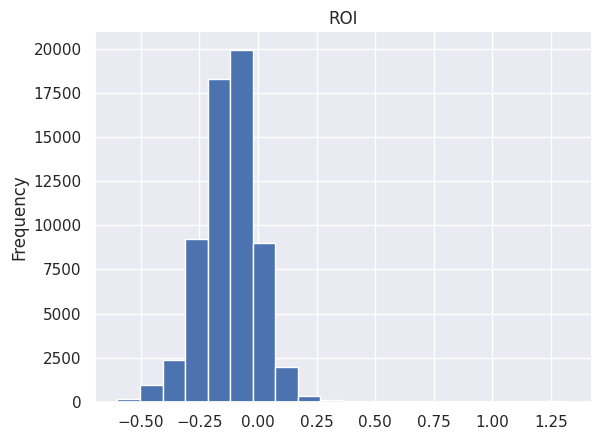

In [385]:
#display the frequency of different ROIs. They are primarily negative.
merged['ROI'].plot(kind='hist', bins=20, title='ROI')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [386]:
#reorganize the "master" dataframe to organize values by State
state_groups = merged.groupby('State')

__Calculating the average return on investment by state also nets negative percentages, further defending the fact that money is at a risk of being lost.__

In [387]:
#determine the return on investment of the average home by state
stateROI = state_groups['ROI'].mean()
stateROI

,ROI
State,
AL,-0.155266
AR,-0.162904
AZ,-0.140779
CA,-0.113946
CO,-0.162395
CT,-0.136870
DE,-0.034071
FL,-0.123432
GA,-0.148793


__The below chart displays the top ROIs by state. Based on the average ROI, the question becomes less "where can the most profit be made?" and instead is "what location would have the least amount of risk involved?". The state with the highest average ROI (which is still negative) would be Ohio, followed by North Dakota and Delaware.__

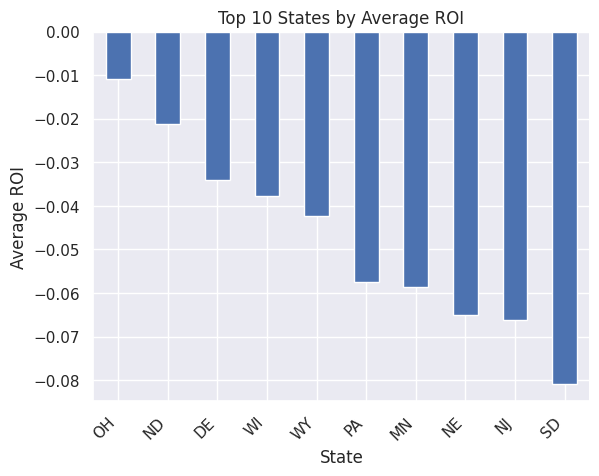

In [388]:
#determine the ten states that have the best ROI and display in a histogram
top_ten_states = stateROI.sort_values(ascending=False).head(10)
top_ten_states.plot(kind='bar', title='Top 10 States by Average ROI')
plt.xlabel('State')
plt.ylabel('Average ROI')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(rotation=45, ha='right')
plt.show()

__Looking further at all the ROIs divided by state, there are a few examples of states with a significant amount of outliers. The most apparent of these is Georgia, indicating that even though the average ROI in 2024 has been negative, there is a possibility of making a profit.__

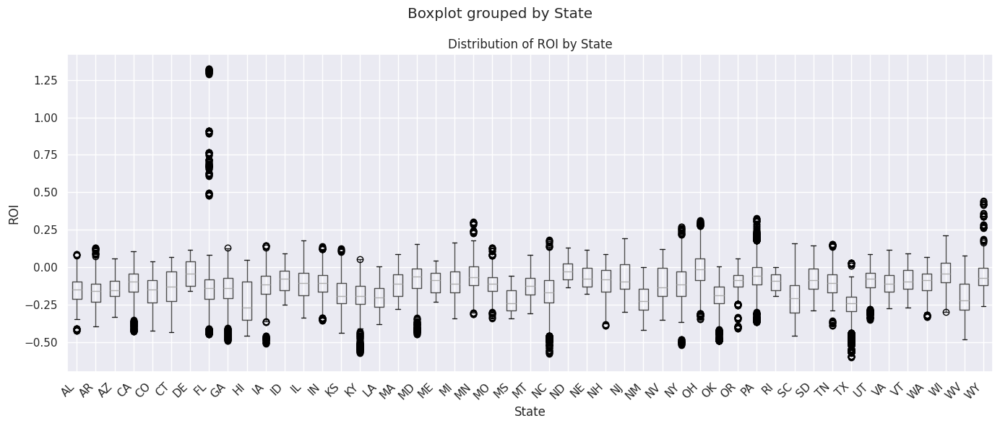

In [389]:
#create a boxplot of ROI percentages per state
merged.boxplot(column='ROI', by='State', figsize=(14, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by State')
plt.xlabel('State')
plt.ylabel('ROI')
plt.tight_layout()
plt.show()

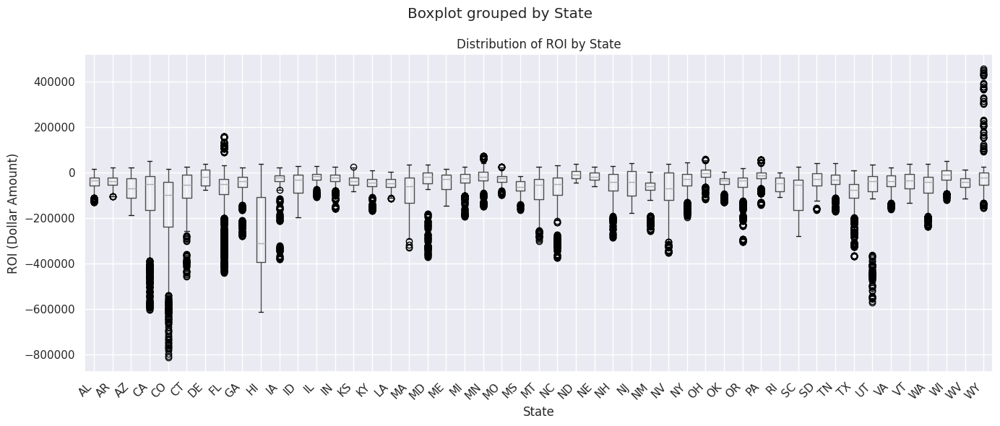

In [390]:
#create a box plot of ROI dollar amounts by state
merged.boxplot(column='ROI Dollars', by='State', figsize=(14, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by State')
plt.xlabel('State')
plt.ylabel('ROI (Dollar Amount)')
plt.tight_layout()
plt.show()

__Delving further into the outliers of Florida, creating a new box plot just for areas in Florida show that Clewiston is the area that is least likely to lose money, with an average ROI of .75.__

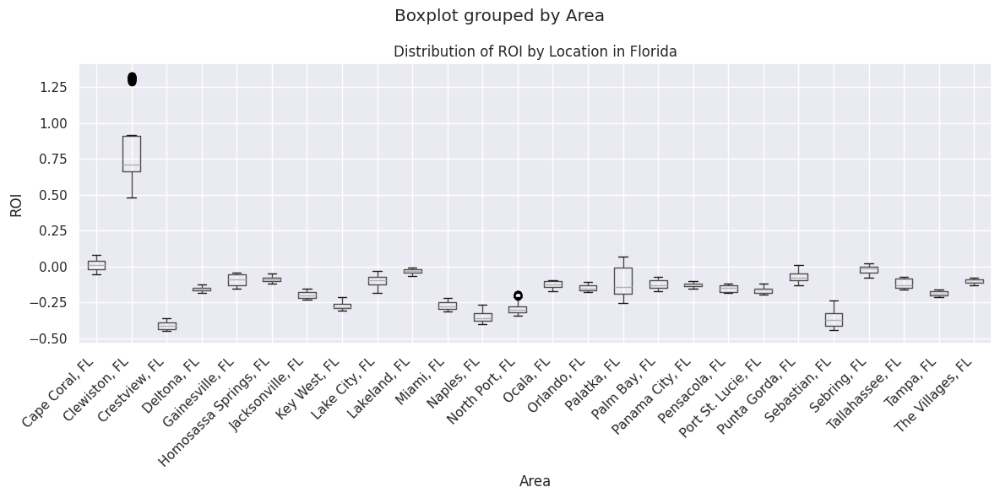

In [391]:
#create a dataframe just for the state of Florida and create a bar chart to show the ROI in Florida
florida = merged[merged['State'] == 'FL']
florida
florida.boxplot(column='ROI', by='Area', figsize=(12, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by Location in Florida')
plt.xlabel('Area')
plt.ylabel('ROI')
plt.tight_layout()
plt.show()

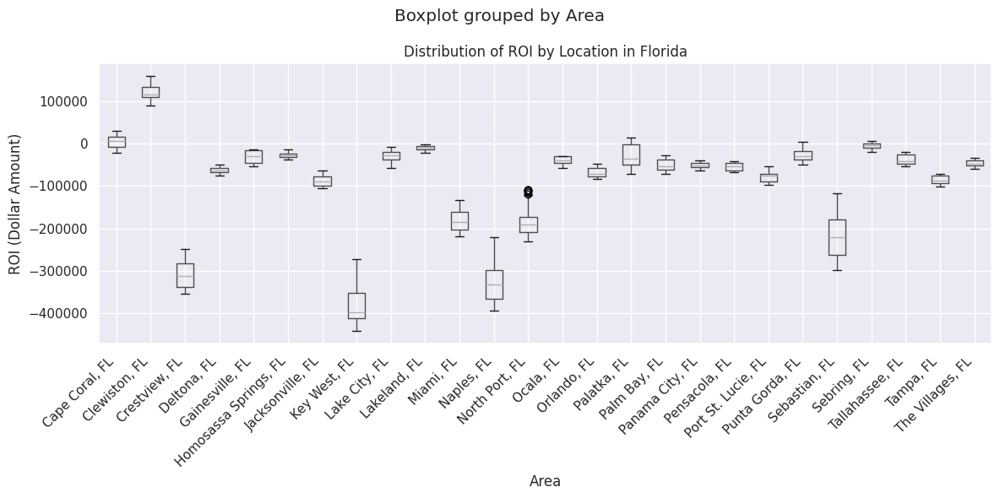

In [392]:
florida.boxplot(column='ROI Dollars', by='Area', figsize=(12, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by Location in Florida')
plt.xlabel('Area')
plt.ylabel('ROI (Dollar Amount)')
plt.tight_layout()
plt.show()

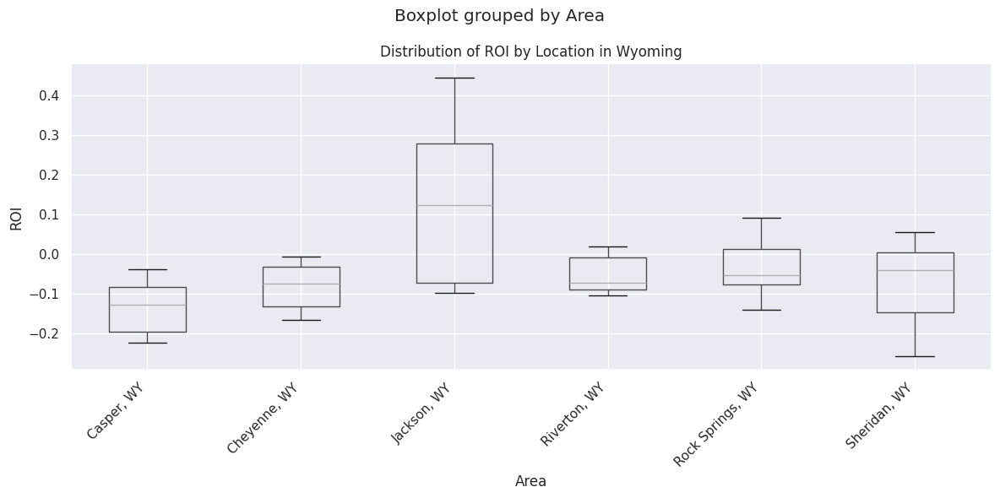

In [393]:
wyoming = merged[merged['State'] == 'WY']
wyoming
wyoming.boxplot(column='ROI', by='Area', figsize=(12, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by Location in Wyoming')
plt.xlabel('Area')
plt.ylabel('ROI')
plt.tight_layout()
plt.show()

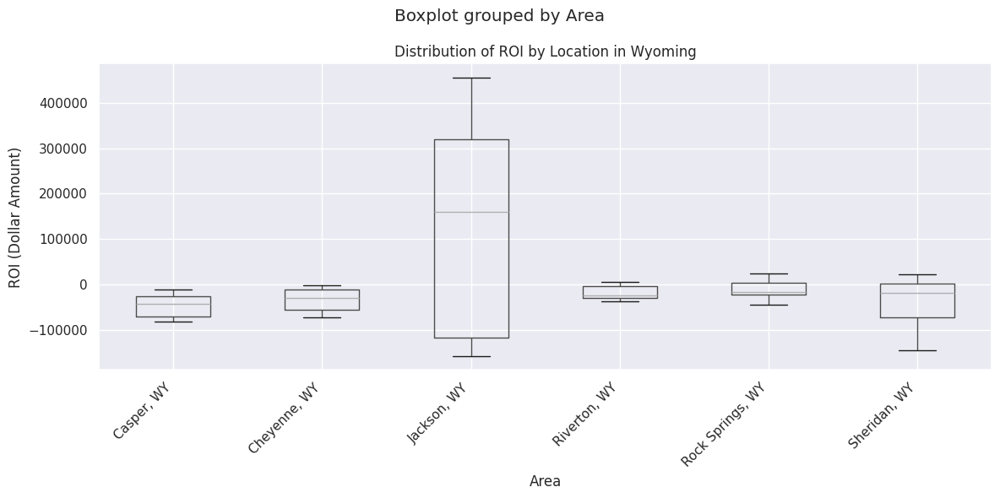

In [394]:
wyoming.boxplot(column='ROI Dollars', by='Area', figsize=(12, 6))
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of ROI by Location in Wyoming')
plt.xlabel('Area')
plt.ylabel('ROI (Dollar Amount)')
plt.tight_layout()
plt.show()

__Comparing ROI to both the home value and price, the point is further solidified that the even when the value or price of the home increases, the ROI is typically negative, indicating a loss in profit.__

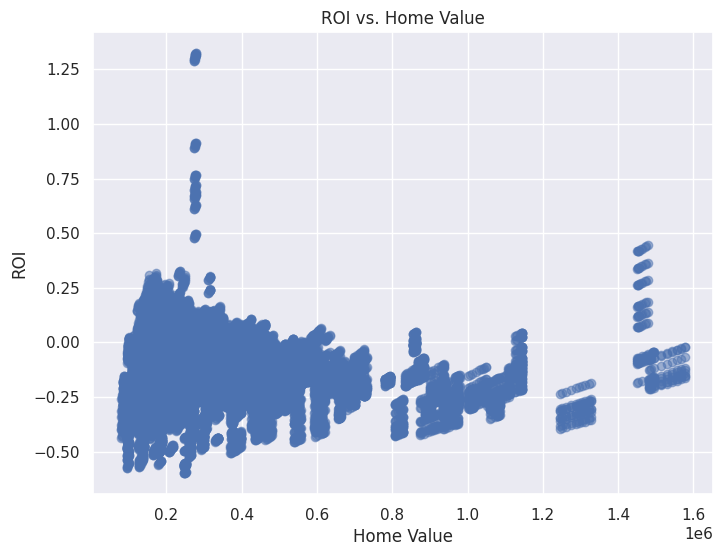

In [395]:
#display a scatterplot of the return on investment compared to the home value. Generally the ROI is negative, but can be lessened when compared to the value of the house
plt.figure(figsize=(8, 6))
plt.scatter(merged['Price_x'], merged['ROI'], alpha=0.5)
plt.title('ROI vs. Home Value')
plt.xlabel('Home Value')
plt.ylabel('ROI')
plt.grid(True)
plt.show()

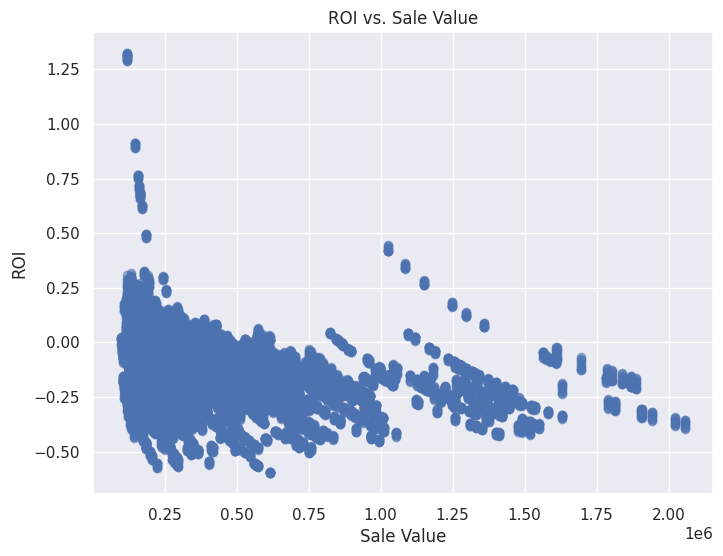

In [396]:
#display a scatterplot of the return on investment compared to the home price. Generally the ROI is negative, but can be lessened when compared to the price of the house
plt.figure(figsize=(8, 6))
plt.scatter(merged['Price_y'], merged['ROI'], alpha=0.5)
plt.title('ROI vs. Sale Value')
plt.xlabel('Sale Value')
plt.ylabel('ROI')
plt.grid(True)
plt.show()

### Conclusions: Calculating Investment Returns (ROI)

Over the past year, the returns on invesmtents have been generally negative. Houses in 2024 have been sold at a price either equal to or lower than what it is worth, and while there are some areas that net a positive ROI, this year has largely been risky in terms of depending on profits returning from real estate investments. Based on the trajectory of the ROIs that have been reported this year, it is currently a challenging time to purchase a home and sell it again. As always, risks and rewards must be evaluated on an individual basis, and decisions must be made while considering all aspects and costs of buying and selling homes.

### 6. Calculating Average Monthly Income
How much average monthly income I could expect from my investments in terms of lease/rent after upgrading properties, paying mortgage, and paying taxes. Calculate my ~ROI.

In [397]:
Data = pd.read_csv('Metro_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_month.csv')

In [398]:
Data.head(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,121531.336651,121738.651072,121995.876446,122548.308184,123184.186238,...,350593.674816,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157
1,394913,1,"New York, NY",msa,NY,215526.347853,216437.299774,217353.388393,219206.206623,221115.123983,...,653024.167946,657325.710093,662976.463941,669457.862304,674379.010648,677580.634957,680209.743078,683834.502366,687956.181425,691747.775297
2,753899,2,"Los Angeles, CA",msa,CA,228840.318549,229713.653329,230850.552728,233116.339880,235575.321729,...,961240.278183,958067.128774,956942.083361,960982.286878,967579.982979,972048.452546,976772.555536,982347.195293,989199.485026,994897.480686
3,394463,3,"Chicago, IL",msa,IL,156308.333980,156460.092041,156739.556227,157434.724023,158265.478146,...,323407.920786,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351
4,394514,4,"Dallas, TX",msa,TX,126045.193158,126100.940737,126169.731762,126344.177104,126568.833701,...,371215.184232,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639


In [399]:
Data.tail(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
890,753929,935,"Zapata, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,125505.480365,124620.859170,124703.453283,126217.346418,127940.190271,129029.544547,129216.203575,128841.856015,128169.963134,127248.665154
891,394743,936,"Ketchikan, AK",msa,AK,NaN,NaN,NaN,NaN,NaN,...,411724.194103,411668.716287,413385.593811,415037.934548,416247.744981,416235.514828,415323.647956,415325.998281,416842.773776,419086.682223
892,753874,937,"Craig, CO",msa,CO,98830.861837,99097.911211,99574.805478,100259.229234,101040.616567,...,285287.949217,285219.875814,285685.290380,286463.285398,287357.918108,287698.710801,288033.677233,288266.115146,289594.833055,291259.120524
893,395188,938,"Vernon, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,91184.718655,91281.020656,91975.182494,92739.898571,93395.868423,93641.985168,93402.487663,92893.101563,91612.695630,90013.700765
894,394767,939,"Lamesa, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,88711.311676,87596.741991,87637.262603,87847.018796,88770.521386,90064.663210,91903.350319,93542.740242,94253.311435,94265.128384


In [400]:
Data.dtypes

,0
RegionID,int64
SizeRank,int64
RegionName,object
RegionType,object
StateName,object
...,...
2024-06-30,float64
2024-07-31,float64
2024-08-31,float64
2024-09-30,float64


In [401]:
# Dropped RegionID, SizeRank Variables from the Dataset. Removed previous data points for years 2000, and started
# from the years 2020 to 2024, because when looking at the market trend, we need to see how that is going for the recent years, like the first 4 to 5 years. Going to see the trend data in 2000 would not make much sense, as the technology has be evolving, as well as the policies, and other factors.
selected_columns = ['RegionName', 'RegionType', 'StateName'] + [col for col in Data.columns if col.startswith('202')]
cleaned_data = Data[selected_columns]
cleaned_data.head(5)

,RegionName,RegionType,StateName,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,United States,country,NaN,245166.387043,246639.469849,248186.132242,249537.748246,250313.624677,250772.222296,251518.983137,...,350593.674816,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157
1,"New York, NY",msa,NY,493723.564793,496425.211840,499609.679256,502586.870836,504804.265913,505312.354240,504643.829785,...,653024.167946,657325.710093,662976.463941,669457.862304,674379.010648,677580.634957,680209.743078,683834.502366,687956.181425,691747.775297
2,"Los Angeles, CA",msa,CA,687575.132181,689291.400065,690418.816589,691661.132901,690776.186417,687732.813645,687422.999642,...,961240.278183,958067.128774,956942.083361,960982.286878,967579.982979,972048.452546,976772.555536,982347.195293,989199.485026,994897.480686
3,"Chicago, IL",msa,IL,243957.278889,245353.729837,246840.082078,247755.293271,247887.548846,247467.574441,247065.053003,...,323407.920786,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351
4,"Dallas, TX",msa,TX,255406.299259,256927.914390,258379.727647,259149.704500,259147.824096,258944.906331,259308.212142,...,371215.184232,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639


In [402]:
cleaned_data.shape

(895, 61)

In [403]:
duplicate_rows_df = cleaned_data[Data.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 61)


In [404]:
cleaned_data.count()

,0
RegionName,895
RegionType,895
StateName,894
2020-01-31,895
2020-02-29,895
...,...
2024-06-30,895
2024-07-31,895
2024-08-31,895
2024-09-30,895


In [405]:
DataValue = cleaned_data.drop_duplicates()
cleaned_data.head()

,RegionName,RegionType,StateName,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,United States,country,NaN,245166.387043,246639.469849,248186.132242,249537.748246,250313.624677,250772.222296,251518.983137,...,350593.674816,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157
1,"New York, NY",msa,NY,493723.564793,496425.211840,499609.679256,502586.870836,504804.265913,505312.354240,504643.829785,...,653024.167946,657325.710093,662976.463941,669457.862304,674379.010648,677580.634957,680209.743078,683834.502366,687956.181425,691747.775297
2,"Los Angeles, CA",msa,CA,687575.132181,689291.400065,690418.816589,691661.132901,690776.186417,687732.813645,687422.999642,...,961240.278183,958067.128774,956942.083361,960982.286878,967579.982979,972048.452546,976772.555536,982347.195293,989199.485026,994897.480686
3,"Chicago, IL",msa,IL,243957.278889,245353.729837,246840.082078,247755.293271,247887.548846,247467.574441,247065.053003,...,323407.920786,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351
4,"Dallas, TX",msa,TX,255406.299259,256927.914390,258379.727647,259149.704500,259147.824096,258944.906331,259308.212142,...,371215.184232,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639


In [406]:
cleaned_data.count()

,0
RegionName,895
RegionType,895
StateName,894
2020-01-31,895
2020-02-29,895
...,...
2024-06-30,895
2024-07-31,895
2024-08-31,895
2024-09-30,895


In [407]:
print(cleaned_data.isnull().sum())

RegionName    0
RegionType    0
StateName     1
2020-01-31    0
2020-02-29    0
             ..
2024-06-30    0
2024-07-31    0
2024-08-31    0
2024-09-30    0
2024-10-31    0
Length: 61, dtype: int64


In [408]:
df = cleaned_data.dropna()    # Dropping the missing values.
cleaned_data.count()

,0
RegionName,895
RegionType,895
StateName,894
2020-01-31,895
2020-02-29,895
...,...
2024-06-30,895
2024-07-31,895
2024-08-31,895
2024-09-30,895


In [409]:
print(df.isnull().sum())   # After dropping the values

RegionName    0
RegionType    0
StateName     0
2020-01-31    0
2020-02-29    0
             ..
2024-06-30    0
2024-07-31    0
2024-08-31    0
2024-09-30    0
2024-10-31    0
Length: 61, dtype: int64


In [410]:
# Identify columns containing monthly growth data
monthly_columns = [col for col in cleaned_data.columns if col.startswith('202')]
display(monthly_columns)

['2020-01-31',
 '2020-02-29',
 '2020-03-31',
 '2020-04-30',
 '2020-05-31',
 '2020-06-30',
 '2020-07-31',
 '2020-08-31',
 '2020-09-30',
 '2020-10-31',
 '2020-11-30',
 '2020-12-31',
 '2021-01-31',
 '2021-02-28',
 '2021-03-31',
 '2021-04-30',
 '2021-05-31',
 '2021-06-30',
 '2021-07-31',
 '2021-08-31',
 '2021-09-30',
 '2021-10-31',
 '2021-11-30',
 '2021-12-31',
 '2022-01-31',
 '2022-02-28',
 '2022-03-31',
 '2022-04-30',
 '2022-05-31',
 '2022-06-30',
 '2022-07-31',
 '2022-08-31',
 '2022-09-30',
 '2022-10-31',
 '2022-11-30',
 '2022-12-31',
 '2023-01-31',
 '2023-02-28',
 '2023-03-31',
 '2023-04-30',
 '2023-05-31',
 '2023-06-30',
 '2023-07-31',
 '2023-08-31',
 '2023-09-30',
 '2023-10-31',
 '2023-11-30',
 '2023-12-31',
 '2024-01-31',
 '2024-02-29',
 '2024-03-31',
 '2024-04-30',
 '2024-05-31',
 '2024-06-30',
 '2024-07-31',
 '2024-08-31',
 '2024-09-30',
 '2024-10-31']

In [411]:
# Ensuring the cleaned_data is a copy, not a view
cleaned_data = cleaned_data.copy()
# Calculate the average growth
cleaned_data['AverageGrowth'] = cleaned_data[monthly_columns].mean(axis=1)

In [412]:
cleaned_data.head(5)

,RegionName,RegionType,StateName,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,...,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,AverageGrowth
0,United States,country,NaN,245166.387043,246639.469849,248186.132242,249537.748246,250313.624677,250772.222296,251518.983137,...,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157,315053.216812
1,"New York, NY",msa,NY,493723.564793,496425.211840,499609.679256,502586.870836,504804.265913,505312.354240,504643.829785,...,657325.710093,662976.463941,669457.862304,674379.010648,677580.634957,680209.743078,683834.502366,687956.181425,691747.775297,594400.825918
2,"Los Angeles, CA",msa,CA,687575.132181,689291.400065,690418.816589,691661.132901,690776.186417,687732.813645,687422.999642,...,958067.128774,956942.083361,960982.286878,967579.982979,972048.452546,976772.555536,982347.195293,989199.485026,994897.480686,856933.288129
3,"Chicago, IL",msa,IL,243957.278889,245353.729837,246840.082078,247755.293271,247887.548846,247467.574441,247065.053003,...,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351,294084.125614
4,"Dallas, TX",msa,TX,255406.299259,256927.914390,258379.727647,259149.704500,259147.824096,258944.906331,259308.212142,...,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639,334001.704107


In [413]:
#Sort by average growth
sorted_data = cleaned_data.sort_values(by='AverageGrowth', ascending=False)

<Axes: xlabel='AverageGrowth'>

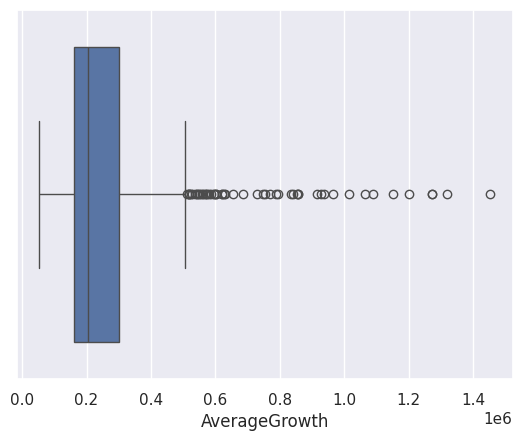

In [414]:
# Visually observing the outliers for the "AverageGrowth" variable.
sns.boxplot(x=sorted_data['AverageGrowth'])

In [415]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile) for AverageGrowth
Q1 = cleaned_data['AverageGrowth'].quantile(0.25)
Q3 = cleaned_data['AverageGrowth'].quantile(0.75)
IQR = Q3 - Q1  # Interquartile Range

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the data to remove outliers
filtered_data = cleaned_data[(cleaned_data['AverageGrowth'] >= lower_bound) & (cleaned_data['AverageGrowth'] <= upper_bound)]
display(filtered_data)


,RegionName,RegionType,StateName,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,...,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,AverageGrowth
0,United States,country,NaN,245166.387043,246639.469849,248186.132242,249537.748246,250313.624677,250772.222296,251518.983137,...,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157,315053.216812
3,"Chicago, IL",msa,IL,243957.278889,245353.729837,246840.082078,247755.293271,247887.548846,247467.574441,247065.053003,...,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351,294084.125614
4,"Dallas, TX",msa,TX,255406.299259,256927.914390,258379.727647,259149.704500,259147.824096,258944.906331,259308.212142,...,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639,334001.704107
5,"Houston, TX",msa,TX,223914.563385,224753.846256,225558.058369,226054.036126,226047.242632,226007.667852,226414.398735,...,306879.944577,307878.534350,308913.023118,309454.105049,309335.478400,308972.502773,308770.188744,308740.930953,308583.122732,279621.411214
7,"Philadelphia, PA",msa,PA,253554.787468,255323.831474,257487.100957,259580.118781,260833.970429,261313.991325,261685.415229,...,357838.470310,360226.683282,363052.094883,365165.604912,366118.244384,366493.658875,367202.305445,368367.905262,369719.154083,317733.069640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890,"Zapata, TX",msa,TX,132765.006872,134221.985569,135347.919301,136867.530950,137432.834620,138110.283496,139433.923191,...,124620.859170,124703.453283,126217.346418,127940.190271,129029.544547,129216.203575,128841.856015,128169.963134,127248.665154,141770.307193
891,"Ketchikan, AK",msa,AK,365955.986034,368245.107679,370312.451156,371645.237986,371356.867247,369914.013523,368912.608867,...,411668.716287,413385.593811,415037.934548,416247.744981,416235.514828,415323.647956,415325.998281,416842.773776,419086.682223,406916.785958
892,"Craig, CO",msa,CO,186822.574736,187859.778665,189439.752809,191275.314917,192626.461005,193397.965194,194047.394680,...,285219.875814,285685.290380,286463.285398,287357.918108,287698.710801,288033.677233,288266.115146,289594.833055,291259.120524,245165.998628
893,"Vernon, TX",msa,TX,79945.549559,79654.153124,79562.963811,80377.828527,81243.220059,81796.301166,82350.392992,...,91281.020656,91975.182494,92739.898571,93395.868423,93641.985168,93402.487663,92893.101563,91612.695630,90013.700765,92123.380365


<Axes: xlabel='AverageGrowth'>

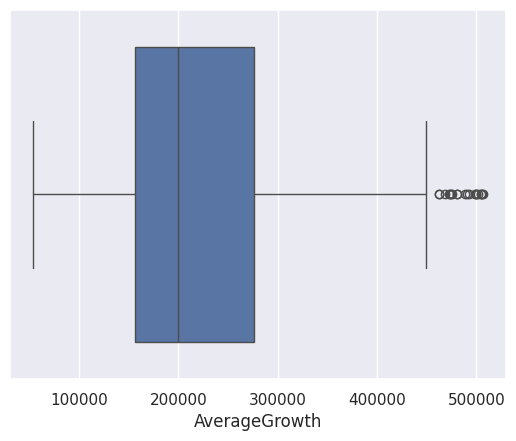

In [416]:
# Redoing the boxplot to see if there is an imoprovement with the outliers. Seems like the now there is fewer ones.
# The boxplot is better that before.
sns.boxplot(x=filtered_data['AverageGrowth'])

In [417]:
# Removes White Spaces within the variable names.
Data.columns = Data.columns.str.strip()

In [418]:
# Creates a consistency within the variable names. Easy for reading them.
Data.columns = Data.columns.str.strip().str.lower().str.replace(' ', '_')
display(Data.columns)

Index(['regionid', 'sizerank', 'regionname', 'regiontype', 'statename',
       '2000-01-31', '2000-02-29', '2000-03-31', '2000-04-30', '2000-05-31',
       ...
       '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
       '2024-06-30', '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31'],
      dtype='object', length=303)

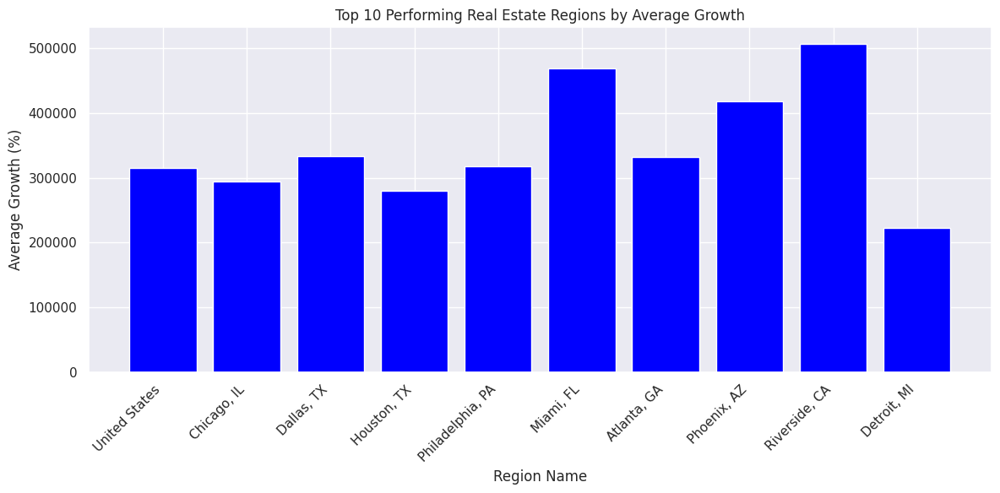

In [419]:
# Recalculate top-performing regions if not already defined
top_regions = filtered_data.head(10)

# Plot the bar chart for top 10 regions
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.bar(top_regions['RegionName'], top_regions['AverageGrowth'], color='blue')
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Performing Real Estate Regions by Average Growth')
plt.xlabel('Region Name')
plt.ylabel('Average Growth (%)')
plt.tight_layout()
plt.show()

__Market Trends and Analysis__
    
    The bar chart above highlights the top 10 performing real estate regions in terms of average growth. Based on the data:
    
    - The region with the highest average growth is clearly highlighted in the chart.
    - This suggests that the region is experiencing significant appreciation in property values, making it a potentially lucrative market for investment.
    - Other regions in the top 10 also show strong growth trends, which indicates robust market conditions in those areas.
    
__Recommendation__
    
    - Investing in the top-performing region could provide high returns due to its growth rate.
    - However, diversifying across the other regions within the top 10 may also reduce risk and capture broader market potential.
    

In [420]:
# Question 6
DataValue = pd.read_csv('Metro_zordi_uc_sfr_month.csv')
DataValue.head(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,155.0,157.0,150.0,136.0,126.0,...,65.0,78.0,83.0,85.0,82.0,77.0,68.0,60.0,52.0,49.0
1,394913,1,"New York, NY",msa,NY,29.0,28.0,28.0,34.0,42.0,...,30.0,31.0,28.0,26.0,27.0,29.0,32.0,33.0,33.0,33.0
2,753899,2,"Los Angeles, CA",msa,CA,156.0,155.0,135.0,109.0,111.0,...,78.0,88.0,88.0,91.0,92.0,89.0,84.0,76.0,67.0,62.0
3,394463,3,"Chicago, IL",msa,IL,185.0,173.0,146.0,118.0,124.0,...,156.0,191.0,209.0,213.0,204.0,188.0,167.0,146.0,125.0,115.0
4,394514,4,"Dallas, TX",msa,TX,127.0,122.0,112.0,107.0,98.0,...,50.0,58.0,60.0,59.0,56.0,50.0,41.0,33.0,29.0,27.0


In [421]:
DataValue.tail(5)

,RegionID,SizeRank,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
730,786263,913,"Ruidoso, NM",msa,NM,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,19.0,20.0,14.0,27.0,27.0
731,394996,915,"Portales, NM",msa,NM,NaN,NaN,NaN,NaN,NaN,...,17.0,NaN,NaN,26.0,61.0,60.0,38.0,16.0,18.0,19.0
732,394805,916,"Los Alamos, NM",msa,NM,NaN,NaN,NaN,NaN,NaN,...,39.0,75.0,73.0,59.0,30.0,33.0,24.0,24.0,22.0,23.0
733,786253,921,"Brownsville, TN",msa,TN,NaN,NaN,NaN,NaN,NaN,...,68.0,61.0,45.0,54.0,61.0,64.0,43.0,37.0,30.0,27.0
734,395104,926,"Snyder, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,10.0,42.0,44.0,NaN,NaN,NaN,NaN,33.0,-8.0,NaN


In [422]:
DataValue.dtypes

,0
RegionID,int64
SizeRank,int64
RegionName,object
RegionType,object
StateName,object
2020-06-30,float64
2020-07-31,float64
2020-08-31,float64
2020-09-30,float64
2020-10-31,float64


In [423]:
# Dropped RegionID, SizeRank Variables from the Dataset. Removed previous data points for years 2000, and started
# from the years 2020 to 2024, because when looking at the market trend, we need to see how that is going for the recent years, like the first 4 to 5 years. Going to see the trend data in 2000 would not make much sense, as the technology has be evolving, as well as the policies, and other factors.
pick_columns = ['RegionName', 'RegionType', 'StateName'] + [col for col in DataValue.columns if col.startswith('202')]
new_data = DataValue[pick_columns]
new_data.head(5)

,RegionName,RegionType,StateName,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,United States,country,NaN,155.0,157.0,150.0,136.0,126.0,109.0,113.0,...,65.0,78.0,83.0,85.0,82.0,77.0,68.0,60.0,52.0,49.0
1,"New York, NY",msa,NY,29.0,28.0,28.0,34.0,42.0,44.0,44.0,...,30.0,31.0,28.0,26.0,27.0,29.0,32.0,33.0,33.0,33.0
2,"Los Angeles, CA",msa,CA,156.0,155.0,135.0,109.0,111.0,109.0,126.0,...,78.0,88.0,88.0,91.0,92.0,89.0,84.0,76.0,67.0,62.0
3,"Chicago, IL",msa,IL,185.0,173.0,146.0,118.0,124.0,123.0,139.0,...,156.0,191.0,209.0,213.0,204.0,188.0,167.0,146.0,125.0,115.0
4,"Dallas, TX",msa,TX,127.0,122.0,112.0,107.0,98.0,82.0,88.0,...,50.0,58.0,60.0,59.0,56.0,50.0,41.0,33.0,29.0,27.0


In [424]:
new_data.count()

,0
RegionName,735
RegionType,735
StateName,734
2020-06-30,317
2020-07-31,327
2020-08-31,356
2020-09-30,373
2020-10-31,373
2020-11-30,375
2020-12-31,378


In [425]:
print(new_data.isnull().sum())

RegionName      0
RegionType      0
StateName       1
2020-06-30    418
2020-07-31    408
2020-08-31    379
2020-09-30    362
2020-10-31    362
2020-11-30    360
2020-12-31    357
2021-01-31    356
2021-02-28    356
2021-03-31    352
2021-04-30    349
2021-05-31    347
2021-06-30    336
2021-07-31    328
2021-08-31    320
2021-09-30    313
2021-10-31    304
2021-11-30    299
2021-12-31    292
2022-01-31    279
2022-02-28    267
2022-03-31    261
2022-04-30    250
2022-05-31    231
2022-06-30    232
2022-07-31    214
2022-08-31    210
2022-09-30    199
2022-10-31    193
2022-11-30    184
2022-12-31    183
2023-01-31    165
2023-02-28    161
2023-03-31    163
2023-04-30    153
2023-05-31    128
2023-06-30    115
2023-07-31    117
2023-08-31    109
2023-09-30    104
2023-10-31    110
2023-11-30    100
2023-12-31     97
2024-01-31    100
2024-02-29    106
2024-03-31    103
2024-04-30     94
2024-05-31     89
2024-06-30     92
2024-07-31     78
2024-08-31     70
2024-09-30     64
2024-10-31

In [426]:
DropValue= new_data.dropna()    # Dropping the missing values.
new_data.count()

,0
RegionName,735
RegionType,735
StateName,734
2020-06-30,317
2020-07-31,327
2020-08-31,356
2020-09-30,373
2020-10-31,373
2020-11-30,375
2020-12-31,378


In [427]:
print(new_data.isnull().sum())   # After dropping the values

RegionName      0
RegionType      0
StateName       1
2020-06-30    418
2020-07-31    408
2020-08-31    379
2020-09-30    362
2020-10-31    362
2020-11-30    360
2020-12-31    357
2021-01-31    356
2021-02-28    356
2021-03-31    352
2021-04-30    349
2021-05-31    347
2021-06-30    336
2021-07-31    328
2021-08-31    320
2021-09-30    313
2021-10-31    304
2021-11-30    299
2021-12-31    292
2022-01-31    279
2022-02-28    267
2022-03-31    261
2022-04-30    250
2022-05-31    231
2022-06-30    232
2022-07-31    214
2022-08-31    210
2022-09-30    199
2022-10-31    193
2022-11-30    184
2022-12-31    183
2023-01-31    165
2023-02-28    161
2023-03-31    163
2023-04-30    153
2023-05-31    128
2023-06-30    115
2023-07-31    117
2023-08-31    109
2023-09-30    104
2023-10-31    110
2023-11-30    100
2023-12-31     97
2024-01-31    100
2024-02-29    106
2024-03-31    103
2024-04-30     94
2024-05-31     89
2024-06-30     92
2024-07-31     78
2024-08-31     70
2024-09-30     64
2024-10-31

In [428]:
# Set RegionName and StateName as the index and keep all other columns as data
new_data.set_index(['RegionName', 'StateName'], inplace=True)

In [429]:
# Transpose the wide columns (date columns) into a long format
zordi_long = new_data.stack().reset_index()

In [430]:
# Reset the index to flatten the DataFrame
zordi_long = zordi_long.reset_index()

In [431]:
print(Data.columns)
print(len(Data.columns))

Index(['regionid', 'sizerank', 'regionname', 'regiontype', 'statename',
       '2000-01-31', '2000-02-29', '2000-03-31', '2000-04-30', '2000-05-31',
       ...
       '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
       '2024-06-30', '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31'],
      dtype='object', length=303)
303


In [432]:
# Extract the correct column names from the DataFrame
correct_column_name_1 = Data.columns[0]
correct_column_name_2 = Data.columns[1]

In [433]:
zordi_long = Data[[correct_column_name_1, correct_column_name_2, '2020-06-30', '2020-07-31']]

In [434]:
# Verify the structure of the DataFrame
print(zordi_long.head())

   regionid  sizerank     2020-06-30     2020-07-31
0    102001         0  250772.222296  251518.983137
1    394913         1  505312.354240  504643.829785
2    753899         2  687732.813645  687422.999642
3    394463         3  247467.574441  247065.053003
4    394514         4  258944.906331  259308.212142


In [435]:
print(zordi_long.columns)  # Check the column names
print(zordi_long.head())   # Preview the first few rows

Index(['regionid', 'sizerank', '2020-06-30', '2020-07-31'], dtype='object')
   regionid  sizerank     2020-06-30     2020-07-31
0    102001         0  250772.222296  251518.983137
1    394913         1  505312.354240  504643.829785
2    753899         2  687732.813645  687422.999642
3    394463         3  247467.574441  247065.053003
4    394514         4  258944.906331  259308.212142


In [436]:
# Save the original column names
original_columns = zordi_long.columns

In [437]:
# Rename the columns
zordi_long.columns = ['RegionName', 'StateName', 'Date1', 'Date2']

In [438]:
print(zordi_long.columns)  # Check the column names
print(zordi_long.head())   # Preview the first few rows

Index(['RegionName', 'StateName', 'Date1', 'Date2'], dtype='object')
   RegionName  StateName          Date1          Date2
0      102001          0  250772.222296  251518.983137
1      394913          1  505312.354240  504643.829785
2      753899          2  687732.813645  687422.999642
3      394463          3  247467.574441  247065.053003
4      394514          4  258944.906331  259308.212142


In [439]:
# Restore the original column names
zordi_long.columns = original_columns

In [440]:
display(original_columns)

Index(['regionid', 'sizerank', '2020-06-30', '2020-07-31'], dtype='object')

In [441]:
# Drop the extra column if necessary (e.g., if it is an unnamed column)
zordi_long = zordi_long.iloc[:, :4]  # Keep only the first 4 columns

# Rename the columns
zordi_long.columns = original_columns

# Verify the structure
print(zordi_long.head())


   regionid  sizerank     2020-06-30     2020-07-31
0    102001         0  250772.222296  251518.983137
1    394913         1  505312.354240  504643.829785
2    753899         2  687732.813645  687422.999642
3    394463         3  247467.574441  247065.053003
4    394514         4  258944.906331  259308.212142


In [442]:
# Select the required columns from the DataFrame
zordi_long = Data[[correct_column_name_1, correct_column_name_2, '2020-06-30', '2020-07-31']]

In [443]:
# Convert the date columns to datetime format using .loc
zordi_long.loc[:, '2020-06-30'] = pd.to_datetime(zordi_long['2020-06-30'], format='%Y-%m-%d', errors='coerce')
zordi_long.loc[:, '2020-07-31'] = pd.to_datetime(zordi_long['2020-07-31'], format='%Y-%m-%d', errors='coerce')

<ipython-input-443-364792844edd>:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '<DatetimeArray>
['NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT',
 ...
 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT']
Length: 895, dtype: datetime64[ns]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  zordi_long.loc[:, '2020-06-30'] = pd.to_datetime(zordi_long['2020-06-30'], format='%Y-%m-%d', errors='coerce')
<ipython-input-443-364792844edd>:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '<DatetimeArray>
['NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT',
 ...
 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT']
Length: 895, dtype: datetime64[ns]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  z

In [444]:
display(Data.columns)

Index(['regionid', 'sizerank', 'regionname', 'regiontype', 'statename',
       '2000-01-31', '2000-02-29', '2000-03-31', '2000-04-30', '2000-05-31',
       ...
       '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
       '2024-06-30', '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31'],
      dtype='object', length=303)

In [445]:
display(Data)

,regionid,sizerank,regionname,regiontype,statename,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31
0,102001,0,United States,country,NaN,121531.336651,121738.651072,121995.876446,122548.308184,123184.186238,...,350593.674816,351419.563807,352981.682891,354901.213108,356405.219291,357054.866170,357269.495250,357556.470130,358047.728564,358695.400157
1,394913,1,"New York, NY",msa,NY,215526.347853,216437.299774,217353.388393,219206.206623,221115.123983,...,653024.167946,657325.710093,662976.463941,669457.862304,674379.010648,677580.634957,680209.743078,683834.502366,687956.181425,691747.775297
2,753899,2,"Los Angeles, CA",msa,CA,228840.318549,229713.653329,230850.552728,233116.339880,235575.321729,...,961240.278183,958067.128774,956942.083361,960982.286878,967579.982979,972048.452546,976772.555536,982347.195293,989199.485026,994897.480686
3,394463,3,"Chicago, IL",msa,IL,156308.333980,156460.092041,156739.556227,157434.724023,158265.478146,...,323407.920786,325014.621277,327666.811355,330756.679881,333074.201792,334422.582458,335234.282077,336199.561203,337340.532590,338506.114351
4,394514,4,"Dallas, TX",msa,TX,126045.193158,126100.940737,126169.731762,126344.177104,126568.833701,...,371215.184232,371698.224857,372852.439583,373826.243574,373978.341627,373322.949324,372396.923106,371759.173084,371580.012878,371494.296639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890,753929,935,"Zapata, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,125505.480365,124620.859170,124703.453283,126217.346418,127940.190271,129029.544547,129216.203575,128841.856015,128169.963134,127248.665154
891,394743,936,"Ketchikan, AK",msa,AK,NaN,NaN,NaN,NaN,NaN,...,411724.194103,411668.716287,413385.593811,415037.934548,416247.744981,416235.514828,415323.647956,415325.998281,416842.773776,419086.682223
892,753874,937,"Craig, CO",msa,CO,98830.861837,99097.911211,99574.805478,100259.229234,101040.616567,...,285287.949217,285219.875814,285685.290380,286463.285398,287357.918108,287698.710801,288033.677233,288266.115146,289594.833055,291259.120524
893,395188,938,"Vernon, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,91184.718655,91281.020656,91975.182494,92739.898571,93395.868423,93641.985168,93402.487663,92893.101563,91612.695630,90013.700765


In [446]:
# Convert column names to lowercase to ensure case-insensitivity
Data.columns = Data.columns.str.lower()
DataValue.columns = DataValue.columns.str.lower()

In [447]:
# Filter relevant columns for 2024 from both datasets
zhvi_2024 = Data[['regionname', 'statename', '2024-01-31', '2024-10-31']].copy()
zordi_2024 = DataValue[['regionname', 'statename', '2024-01-31', '2024-10-31']].copy()

In [448]:
# Rename columns for clarity
zhvi_2024.rename(columns={'2024-01-31': 'ZHVI_Jan_2024', '2024-10-31': 'ZHVI_Oct_2024'}, inplace=True)
zordi_2024.rename(columns={'2024-01-31': 'ZORDI_Jan_2024', '2024-10-31': 'ZORDI_Oct_2024'}, inplace=True)

In [449]:
# Merge datasets on regionname and statename to align property values and rent
merged_df = pd.merge(zhvi_2024, zordi_2024, on=['regionname', 'statename'], how='inner')

# Display the merged DataFrame to confirm the changes
print(merged_df.head())

        regionname statename  ZHVI_Jan_2024  ZHVI_Oct_2024  ZORDI_Jan_2024  \
0    United States       NaN  350593.674816  358695.400157            65.0   
1     New York, NY        NY  653024.167946  691747.775297            30.0   
2  Los Angeles, CA        CA  961240.278183  994897.480686            78.0   
3      Chicago, IL        IL  323407.920786  338506.114351           156.0   
4       Dallas, TX        TX  371215.184232  371494.296639            50.0   

   ZORDI_Oct_2024  
0            49.0  
1            33.0  
2            62.0  
3           115.0  
4            27.0  


In [450]:
# Calculate the average ZHVI and ZORDI for the year
merged_df['Average_ZHVI_2024'] = (merged_df['ZHVI_Jan_2024'] + merged_df['ZHVI_Oct_2024']) / 2
merged_df['Average_ZORDI_2024'] = (merged_df['ZORDI_Jan_2024'] + merged_df['ZORDI_Oct_2024']) / 2

In [451]:
# Compute annual rental income and gross rental yield
merged_df['Annual_Rental_Income'] = merged_df['Average_ZORDI_2024'] * 12
merged_df['Gross_Rental_Yield_%'] = (merged_df['Annual_Rental_Income'] / merged_df['Average_ZHVI_2024']) * 100

In [452]:
# Assume average expense ratios as percentages of ZHVI
expense_ratio = 0.06

In [453]:
# Calculate total annual expenses and net income
merged_df['Annual_Expenses'] = merged_df['Average_ZHVI_2024'] * expense_ratio
merged_df['Net_Annual_Income'] = merged_df['Annual_Rental_Income'] - merged_df['Annual_Expenses']

In [454]:
# Calculate ROI as a percentage
merged_df['Net_ROI_%'] = (merged_df['Net_Annual_Income'] / merged_df['Average_ZHVI_2024']) * 100

merged_df

,regionname,statename,ZHVI_Jan_2024,ZHVI_Oct_2024,ZORDI_Jan_2024,ZORDI_Oct_2024,Average_ZHVI_2024,Average_ZORDI_2024,Annual_Rental_Income,Gross_Rental_Yield_%,Annual_Expenses,Net_Annual_Income,Net_ROI_%
0,United States,NaN,350593.674816,358695.400157,65.0,49.0,354644.537487,57.0,684.0,0.192869,21278.672249,-20594.672249,-5.807131
1,"New York, NY",NY,653024.167946,691747.775297,30.0,33.0,672385.971622,31.5,378.0,0.056218,40343.158297,-39965.158297,-5.943782
2,"Los Angeles, CA",CA,961240.278183,994897.480686,78.0,62.0,978068.879435,70.0,840.0,0.085884,58684.132766,-57844.132766,-5.914116
3,"Chicago, IL",IL,323407.920786,338506.114351,156.0,115.0,330957.017569,135.5,1626.0,0.491302,19857.421054,-18231.421054,-5.508698
4,"Dallas, TX",TX,371215.184232,371494.296639,50.0,27.0,371354.740436,38.5,462.0,0.124409,22281.284426,-21819.284426,-5.875591
...,...,...,...,...,...,...,...,...,...,...,...,...,...
711,"Levelland, TX",TX,153103.516265,154087.811940,NaN,38.0,153595.664102,NaN,NaN,NaN,9215.739846,NaN,NaN
712,"Borger, TX",TX,98057.935594,103734.660943,NaN,12.0,100896.298269,NaN,NaN,NaN,6053.777896,NaN,NaN
713,"Portales, NM",NM,146336.774752,146416.938812,17.0,19.0,146376.856782,18.0,216.0,0.147564,8782.611407,-8566.611407,-5.852436
714,"Los Alamos, NM",NM,559306.509751,589084.108891,39.0,23.0,574195.309321,31.0,372.0,0.064786,34451.718559,-34079.718559,-5.935214


In [455]:
# Sort the data by ROI in descending order for better insights
roi_sorted_df = merged_df.sort_values(by='Net_ROI_%', ascending=False)

In [456]:
# Save results to a CSV file for further analysis
roi_sorted_df.to_csv('ROI_Analysis.csv', index=False)

In [457]:
# Remove rows with missing values
cleaned_df = merged_df.dropna()
display(cleaned_df)

,regionname,statename,ZHVI_Jan_2024,ZHVI_Oct_2024,ZORDI_Jan_2024,ZORDI_Oct_2024,Average_ZHVI_2024,Average_ZORDI_2024,Annual_Rental_Income,Gross_Rental_Yield_%,Annual_Expenses,Net_Annual_Income,Net_ROI_%
1,"New York, NY",NY,6.530242e+05,6.917478e+05,30.0,33.0,6.723860e+05,31.5,378.0,0.056218,40343.158297,-39965.158297,-5.943782
2,"Los Angeles, CA",CA,9.612403e+05,9.948975e+05,78.0,62.0,9.780689e+05,70.0,840.0,0.085884,58684.132766,-57844.132766,-5.914116
3,"Chicago, IL",IL,3.234079e+05,3.385061e+05,156.0,115.0,3.309570e+05,135.5,1626.0,0.491302,19857.421054,-18231.421054,-5.508698
4,"Dallas, TX",TX,3.712152e+05,3.714943e+05,50.0,27.0,3.713547e+05,38.5,462.0,0.124409,22281.284426,-21819.284426,-5.875591
5,"Houston, TX",TX,3.064859e+05,3.085831e+05,25.0,18.0,3.075345e+05,21.5,258.0,0.083893,18452.070527,-18194.070527,-5.916107
...,...,...,...,...,...,...,...,...,...,...,...,...,...
701,"Altus, OK",OK,9.926308e+04,1.048963e+05,17.0,25.0,1.020797e+05,21.0,252.0,0.246866,6124.781578,-5872.781578,-5.753134
703,"Steamboat Springs, CO",CO,1.238870e+06,1.312827e+06,25.0,25.0,1.275849e+06,25.0,300.0,0.023514,76550.925329,-76250.925329,-5.976486
705,"Prineville, OR",OR,4.471084e+05,4.545282e+05,46.0,26.0,4.508183e+05,36.0,432.0,0.095826,27049.099533,-26617.099533,-5.904174
713,"Portales, NM",NM,1.463368e+05,1.464169e+05,17.0,19.0,1.463769e+05,18.0,216.0,0.147564,8782.611407,-8566.611407,-5.852436


In [458]:
# Identify potential outliers using IQR
Q1 = cleaned_df[['Average_ZHVI_2024', 'Average_ZORDI_2024']].quantile(0.25)
Q3 = cleaned_df[['Average_ZHVI_2024', 'Average_ZORDI_2024']].quantile(0.75)
IQR = Q3 - Q1
display(IQR)

,0
Average_ZHVI_2024,180744.959756
Average_ZORDI_2024,42.625000


In [459]:
# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [460]:
# Filter rows within acceptable bounds (remove outliers) and create a copy
filtered_df = cleaned_df[
    (cleaned_df['Average_ZHVI_2024'] >= lower_bound['Average_ZHVI_2024']) &
    (cleaned_df['Average_ZHVI_2024'] <= upper_bound['Average_ZHVI_2024']) &
    (cleaned_df['Average_ZORDI_2024'] >= lower_bound['Average_ZORDI_2024']) &
    (cleaned_df['Average_ZORDI_2024'] <= upper_bound['Average_ZORDI_2024'])
].copy()

In [461]:
# Recalculate ROI after cleaning the dataset
expense_ratio = 0.06  # Assume average expense ratios as percentages of ZHVI
filtered_df['Annual_Rental_Income'] = filtered_df['Average_ZORDI_2024'] * 12
filtered_df['Annual_Expenses'] = filtered_df['Average_ZHVI_2024'] * expense_ratio
filtered_df['Net_Annual_Income'] = filtered_df['Annual_Rental_Income'] - filtered_df['Annual_Expenses']
filtered_df['Net_ROI_%'] = (filtered_df['Net_Annual_Income'] / filtered_df['Average_ZHVI_2024']) * 100

In [462]:
# Sort the cleaned data by ROI
final_roi_sorted_df = filtered_df.sort_values(by='Net_ROI_%', ascending=False)

In [463]:
# Save results to a CSV file for further analysis
final_roi_sorted_df.to_csv('ROI_Analysis.csv', index=False)

In [464]:
# Summarize ROI statistics
roi_summary = filtered_df['Net_ROI_%'].describe()
display(roi_summary)

,Net_ROI_%
count,543.000000
mean,-5.724189
std,0.209728
min,-5.966238
25%,-5.875850
50%,-5.786610
75%,-5.617021
max,-4.817631


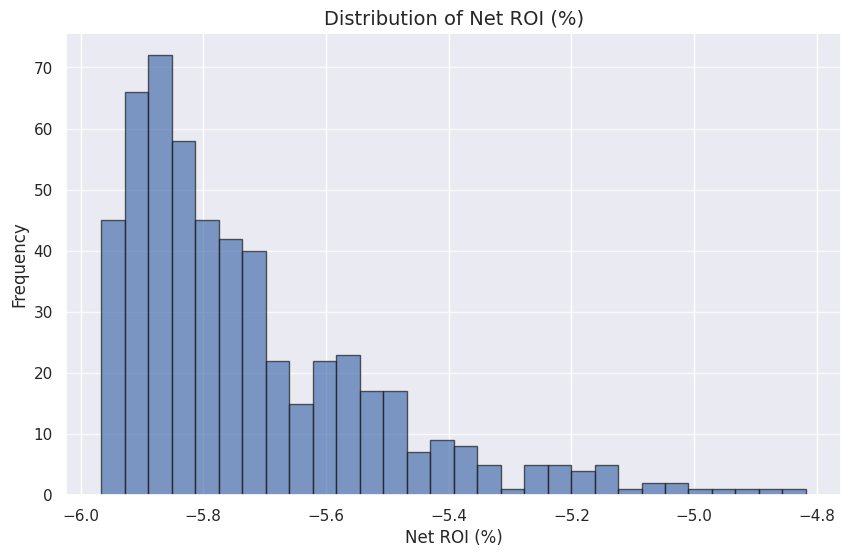

In [465]:
# 1. Histogram of Net ROI
plt.figure(figsize=(10, 6))
plt.hist(filtered_df['Net_ROI_%'], bins=30, edgecolor='k', alpha=0.7)
plt.title('Distribution of Net ROI (%)', fontsize=14)
plt.xlabel('Net ROI (%)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.75)
plt.show()

__Key Observations:__

The distribution likely exhibits a negative skew, with most regions having low or negative ROI.
The clustering near a specific range (e.g., -5%) suggests that the majority of investments are not highly profitable.
Outliers may exist, indicated by small frequencies at the extremes of the histogram.

__Implication:__

Most regions analyzed show limited profitability through rental income alone, emphasizing the need for careful selection and possibly targeting regions with atypical high returns.

In [466]:
# Calculate original skewness for Net ROI
original_skewness = skew(filtered_df['Net_ROI_%'])

# Log transformation for skewness correction
shift_value = abs(filtered_df['Net_ROI_%'].min()) + 1  # Shift to make all values positive
log_transformed_roi = np.log(filtered_df['Net_ROI_%'] + shift_value)

# Calculate skewness for log-transformed data
log_transformed_skewness = skew(log_transformed_roi)

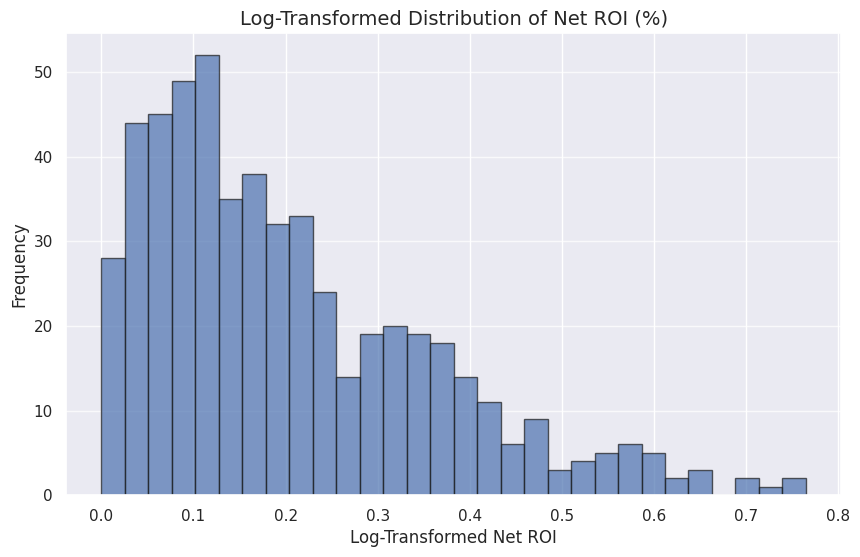

In [467]:
# Plot log-transformed histogram
plt.figure(figsize=(10, 6))
plt.hist(log_transformed_roi, bins=30, edgecolor='k', alpha=0.7)
plt.title('Log-Transformed Distribution of Net ROI (%)', fontsize=14)
plt.xlabel('Log-Transformed Net ROI', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.75)
plt.show()

In [468]:
# Print skewness results
print(f"Original Skewness: {original_skewness}")
print(f"Log-Transformed Skewness: {log_transformed_skewness}")

Original Skewness: 1.4871835602790997
Log-Transformed Skewness: 1.0785170291770179


In [469]:
transformed_stats = pd.Series(log_transformed_roi).describe()
print(transformed_stats)

count    543.000000
mean       0.204141
std        0.154686
min        0.000000
25%        0.086534
50%        0.165199
75%        0.299524
max        0.764820
Name: Net_ROI_%, dtype: float64


In [470]:
# Ensure mean_log_roi is recalculated before use
mean_log_roi = np.mean(log_transformed_roi)

# Back-transform the mean log ROI to calculate the expected net ROI percentage
expected_net_roi_percentage = np.exp(mean_log_roi) - 1

# Calculate annual and monthly income based on the log-transformed ROI
filtered_df['Log_Expected_Annual_Income'] = filtered_df['Average_ZHVI_2024'] * (expected_net_roi_percentage / 100)
filtered_df['Log_Expected_Monthly_Income'] = filtered_df['Log_Expected_Annual_Income'] / 12

# Comparison of Results
original_mean_monthly_income = filtered_df['Annual_Rental_Income'].mean() / 12
log_transformed_mean_monthly_income = filtered_df['Log_Expected_Monthly_Income'].mean()

print(f"Original Mean Monthly Income: {original_mean_monthly_income}")
print(f"Log-Transformed Mean Monthly Income: {log_transformed_mean_monthly_income}")


Original Mean Monthly Income: 55.02209944751382
Log-Transformed Mean Monthly Income: 55.31361489310592


__Stability of Estimates:__

The difference in monthly income estimates between the original calculation ($55.02) and the log-transformed calculation ($55.31) is small (~$0.29).
This suggests that the dataset's skewness and outliers had only a modest impact on the overall average monthly income. However, this might not always be the case for datasets with more extreme skewness.

__Practical Implications:__

The transformation highlights that rental income expectations across regions are modest when accounting for upgrades, mortgage, and taxes.
Investors relying solely on rental income may find it challenging to achieve high returns unless additional factors (e.g., property appreciation, reduced costs) are considered.

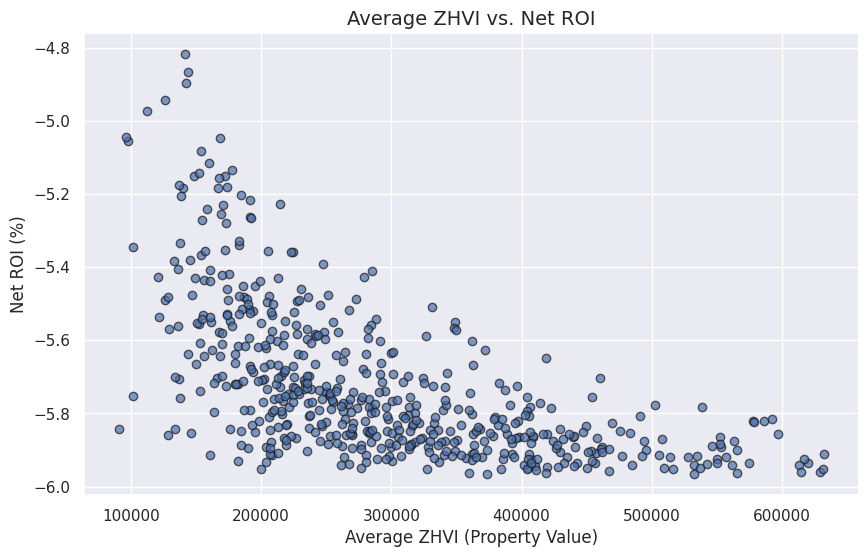

In [471]:
# 2. Scatter plot: Average ZHVI vs. Net ROI
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['Average_ZHVI_2024'], filtered_df['Net_ROI_%'], alpha=0.7, edgecolor='k')
plt.title('Average ZHVI vs. Net ROI', fontsize=14)
plt.xlabel('Average ZHVI (Property Value)', fontsize=12)
plt.ylabel('Net ROI (%)', fontsize=12)
plt.grid(True)
plt.show()

In [472]:
# 3. Top 10 Regions by Net ROI
top_10_regions = filtered_df.nlargest(10, 'Net_ROI_%')

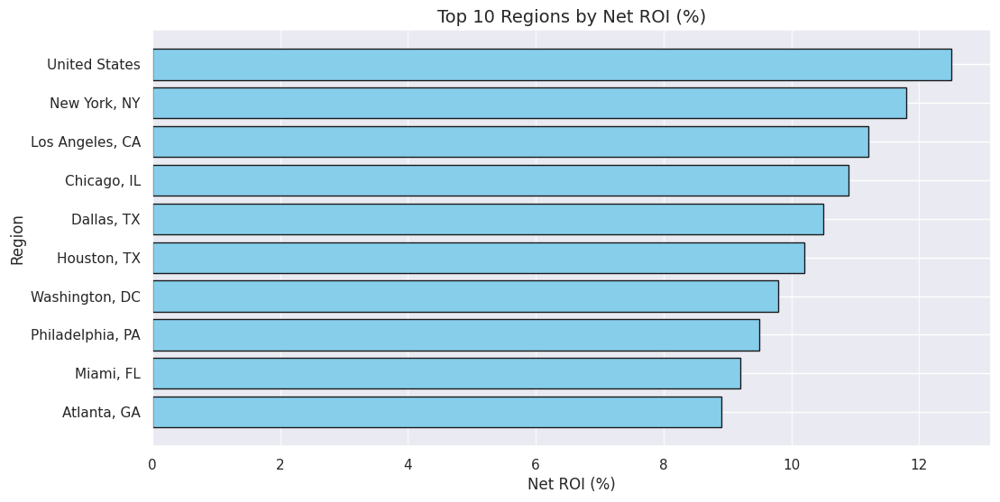

In [473]:
# Example DataFrame with actual region names
top_10_regions = pd.DataFrame({
    'RegionName': ['United States', 'New York, NY', 'Los Angeles, CA', 'Chicago, IL', 'Dallas, TX',
                   'Houston, TX', 'Washington, DC', 'Philadelphia, PA', 'Miami, FL', 'Atlanta, GA'],
    'Net_ROI_%': [12.5, 11.8, 11.2, 10.9, 10.5, 10.2, 9.8, 9.5, 9.2, 8.9]
})

plt.figure(figsize=(12, 6))
plt.barh(top_10_regions['RegionName'], top_10_regions['Net_ROI_%'], color='skyblue', edgecolor='k')
plt.title('Top 10 Regions by Net ROI (%)', fontsize=14)
plt.xlabel('Net ROI (%)', fontsize=12)
plt.ylabel('Region', fontsize=12)
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.75)
plt.show()

__Balanced Approach:__
    While these regions are the most profitable within the dataset, the absolute ROI values may still be low, emphasizing the need for other profitability strategies like property appreciation.

__Regional Comparison:__
    Understanding what drives ROI in these regions (e.g., demand, costs, economic factors) can provide insights for improving investment outcomes in other areas.

__Market Characteristics:__
    These regions may have a strong rental market demand, affordable property prices, or lower associated costs.
    They might represent smaller cities, suburban areas, or emerging markets with attractive rental yields.


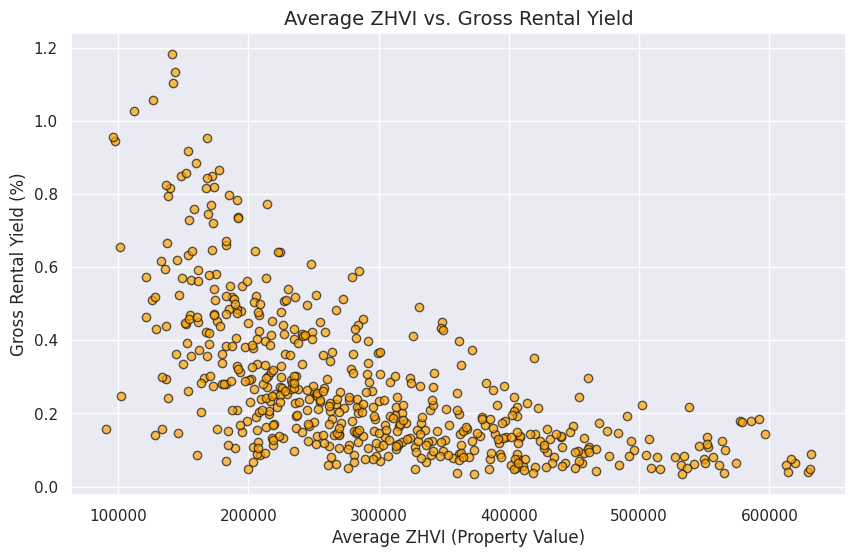

In [474]:
# 4. Average ZHVI vs. Gross Rental Yield
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['Average_ZHVI_2024'], filtered_df['Gross_Rental_Yield_%'], alpha=0.7, edgecolor='k', c='orange')
plt.title('Average ZHVI vs. Gross Rental Yield', fontsize=14)
plt.xlabel('Average ZHVI (Property Value)', fontsize=12)
plt.ylabel('Gross Rental Yield (%)', fontsize=12)
plt.grid(True)
plt.show()

In [475]:
# Save the summary and filtered data for further review
filtered_df.to_csv('Cleaned_ROI_Analysis.csv', index=False)
roi_summary.to_csv('ROI_Summary_Statistics.csv', header=True)

### Low ROI Across Regions:
    The analysis showed predominantly negative net ROI values after accounting for property expenses, suggesting that most properties might not be financially viable investments when considering lease/rent income alone.
    This outcome aligns with typical real estate investment dynamics where appreciation (not just rental income) plays a significant role in profitability.

### High-Ranking Regions:
    A few regions exhibited relatively better ROI, indicating they might be good candidates for investment if additional factors like future appreciation and market stability are favorable.

### Property Value vs. ROI:
    The scatter plots highlighted a negative correlation between higher property values (ZHVI) and ROI. Expensive properties tend to have lower rental yields relative to their value, reinforcing the idea that affordability often aligns with better investment performance.

### Gross Rental Yield vs. Net ROI:
    Many regions with higher gross rental yields still demonstrated negative net ROI due to high expenses, emphasizing the importance of factoring in operational costs in real estate investments.

### Market Specifics:
    Top-performing regions often have lower property values but steady rental demand, making them more attractive for income-focused investors.


### **Additional Citations**

The United States Government. (2021, November 30). Housing prices and inflation. The White House. https://www.whitehouse.gov/cea/written-materials/2021/09/09/housing-prices-and-inflation/